In [10]:
import sys
import os
import pandas as pd
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import distance_matrix
from scipy.stats import pearsonr, spearmanr
import seaborn as sns

In [2]:
import base64
import io

def plt2base64(plt):
    pic_IObytes = io.BytesIO()
    plt.savefig(pic_IObytes,  format='png')
    pic_IObytes.seek(0)
    pic_hash = base64.b64encode(pic_IObytes.read())
    return bytes.decode(pic_hash) # convert bytes to string

def plt2html(plt):
    '''
    output an HTML img tag
    '''
    return '<img src="data:image/.png;base64,' + plt2base64(plt) + '">'

In [3]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [4]:
#This is needed so we can display plotly plots properly
init_notebook_mode(connected=True)

In [5]:
import matplotlib.pyplot as plt

def visualize_matrix(dm, cmap = None, silent = False):

    fig = plt.figure(figsize = (3,3))
    if cmap is None:
        plt.imshow(dm)
    else:
        plt.imshow(dm, cmap = cmap)

    cur_axes = plt.gca()
    cur_axes.axes.get_xaxis().set_visible(False)
    cur_axes.axes.get_yaxis().set_visible(False) 

    fig.tight_layout()
        
    s = plt2html(plt) # must appear before plt.show()

    if (silent == False):
        plt.show()
    return s

In [106]:
# format CSV file into a Pandas Dataframe
Big_data_set = pd.read_csv('r\home\bonsai\wholecell3\cvreliabledataset.csv')
Big_data_set

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,EG10346-MONOMER[c],G6995-MONOMER[c],CPLX0-3501[c],CYTOCHROME-B561-MONOMER[i],CPLX-3942[c],GLUCDEHYDROG-MONOMER[m],CPLX0-8248[c],G378-MONOMER[c],RED-THIOREDOXIN2-MONOMER[c],EG12128-MONOMER[i]
0,2296,3030,2704,8799,5813,4484,8810,6897,6569,3098,...,621,658,388,1218,37,447,209,866,719,292
1,1939,2621,2276,7732,5061,3850,7872,5906,5715,2783,...,419,991,243,725,34,806,155,654,593,265
2,1979,2775,2407,7996,5327,4120,7989,6317,6205,2680,...,371,495,497,1055,60,951,148,821,511,289
3,2116,2827,2467,8058,5405,4081,8306,6334,6241,2894,...,558,719,316,1780,36,598,256,661,1180,320
4,2006,2673,2423,7974,5213,3865,7875,6297,5813,2768,...,537,375,216,1227,35,746,188,1199,966,360
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2065,1899,2568,2334,7538,4873,3727,7512,5711,5720,2637,...,261,566,234,1926,29,474,135,572,661,264
2066,1936,2605,2261,7703,5029,3825,7594,5807,5634,2654,...,404,843,333,1036,38,348,103,415,978,403
2067,2069,2796,2446,7954,5119,3840,7946,6076,5965,2813,...,552,497,202,1142,27,739,155,1049,463,419
2068,1938,2604,2358,7513,4937,3736,7460,5735,5684,2663,...,318,891,257,1066,52,315,171,401,781,353


In [693]:
#define function to calculate cv
cv = lambda x: np.std(x, ddof=1) / np.mean(x) * 100 

In [717]:
#calculate CV for each column in data frame
cv1 = Big_data_set.apply(cv)
cv1

FDNG-MONOMER[p]                       4549.725266
E1O[c]                                4549.725266
FORMATEDEHYDROGN-CPLX[i]              4549.725266
MONOMER0-5[i]                         3596.352067
YBBP-MONOMER[i]                       2211.191115
                                         ...     
G6662-MONOMER[c]                       100.127346
ARAH-MONOMER[i]                        100.105015
EG11692-MONOMER[c]                     100.034337
G6112-MONOMER[c]                       100.022392
LIPIDADISACCHARIDESYNTH-MONOMER[i]     100.018279
Length: 1752, dtype: float64

In [107]:
# data set containing features with CV < 30
Big_data_set = Big_data_set.iloc[:, : 1422]
Big_data_set

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,G6567-MONOMER[c],EG10346-MONOMER[c],G6995-MONOMER[c],CPLX0-3501[c],CYTOCHROME-B561-MONOMER[i],CPLX-3942[c],GLUCDEHYDROG-MONOMER[m],CPLX0-8248[c],G378-MONOMER[c],RED-THIOREDOXIN2-MONOMER[c]
0,2296,3030,2704,8799,5813,4484,8810,6897,6569,3098,...,173,621,658,388,1218,37,447,209,866,719
1,1939,2621,2276,7732,5061,3850,7872,5906,5715,2783,...,289,419,991,243,725,34,806,155,654,593
2,1979,2775,2407,7996,5327,4120,7989,6317,6205,2680,...,573,371,495,497,1055,60,951,148,821,511
3,2116,2827,2467,8058,5405,4081,8306,6334,6241,2894,...,351,558,719,316,1780,36,598,256,661,1180
4,2006,2673,2423,7974,5213,3865,7875,6297,5813,2768,...,279,537,375,216,1227,35,746,188,1199,966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2065,1899,2568,2334,7538,4873,3727,7512,5711,5720,2637,...,334,261,566,234,1926,29,474,135,572,661
2066,1936,2605,2261,7703,5029,3825,7594,5807,5634,2654,...,240,404,843,333,1036,38,348,103,415,978
2067,2069,2796,2446,7954,5119,3840,7946,6076,5965,2813,...,411,552,497,202,1142,27,739,155,1049,463
2068,1938,2604,2358,7513,4937,3736,7460,5735,5684,2663,...,402,318,891,257,1066,52,315,171,401,781


<AxesSubplot:>

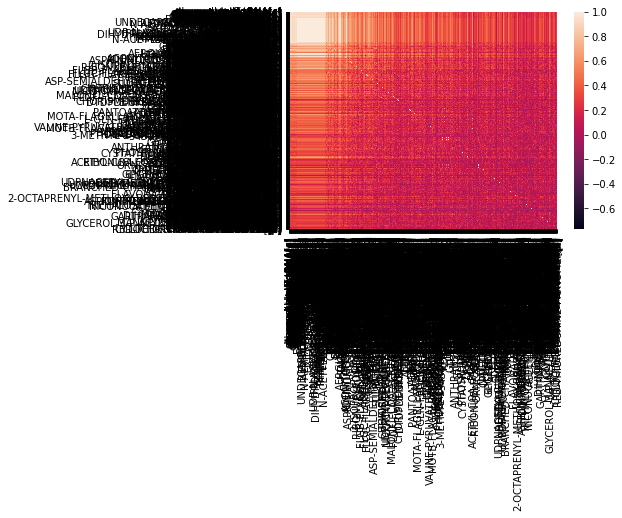

In [11]:
# calculate the correlation matrix of bulk molecules(pearson)
corr = Big_data_set.corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

<AxesSubplot:>

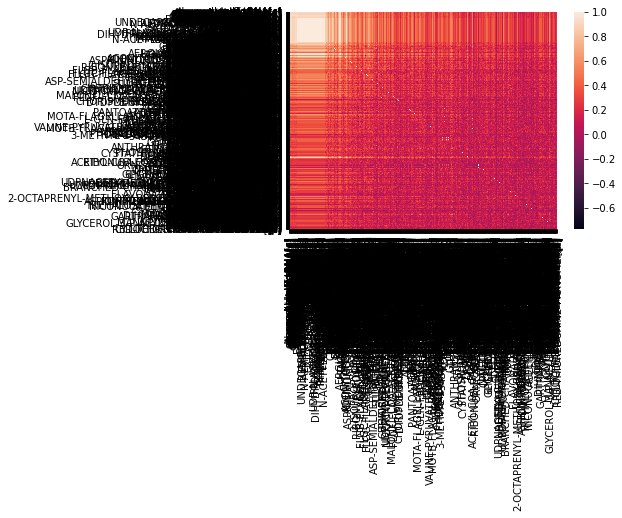

In [18]:
# calculate the correlation matrix of bulk molecules (spearman)
corr = Big_data_set.corr(method = 'spearman')

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [19]:
# standardise the CV < 30 data set
from sklearn.preprocessing import StandardScaler
standardised_data = StandardScaler().fit_transform(Big_data_set)
standardised_data

array([[ 1.74751894,  1.35230472,  1.75077042, ...,  1.0767597 ,
         0.7967913 , -0.52388418],
       [-0.80633374, -0.80430646, -0.8339304 , ..., -0.06417097,
        -0.21507598, -1.0164615 ],
       [-0.52018778,  0.00771829, -0.0428187 , ..., -0.21206939,
         0.58200815, -1.3370277 ],
       ...,
       [ 0.12364063,  0.11844893,  0.19270311, ..., -0.06417097,
         1.67024278, -1.5246762 ],
       [-0.81348739, -0.89394556, -0.33873071, ...,  0.27388256,
        -1.42263459, -0.28150486],
       [ 2.28404261,  0.90938213,  1.45485841, ..., -0.31771112,
        -0.40122138,  0.72710585]])

In [82]:
# Embed standardised data with PCA in 2D
from sklearn.decomposition import PCA, FastICA
from sklearn import manifold
import matplotlib.ticker as mticker
import umap
from sklearn.manifold import TSNE
from sklearn.manifold import SpectralEmbedding

import time

start = time.perf_counter()
# Generate PCA embedding
K = 2
pca = PCA(n_components = K) # keep the first K components
pca.fit(standardised_data)
pca_embedding = pd.DataFrame(pca.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the PCA algorithm in {start-end:0.4f} seconds")

print(pca_embedding)

Processed the PCA algorithm in -0.5717 seconds
              0          1
0    -31.105744  -1.558508
1      8.948265   4.601804
2     -5.040635   6.472708
3     -8.107278   7.312680
4      8.139300  -7.194166
...         ...        ...
2065  20.264769   1.546953
2066  17.328797   6.137820
2067   4.156253  -2.920910
2068  20.984862   5.148190
2069 -36.224988  11.113397

[2070 rows x 2 columns]


In [81]:
# label columns
pca_embedding.columns = ["PC1_2d", "PC2_2d"]

In [82]:
#Instructions for building the 2-D plot displaying index numbers when cursor hovers over a data point


trace1 = go.Scatter(
                    x = pca_embedding["PC1_2d"],
                    y = pca_embedding["PC2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = pca_embedding.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using PCA"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


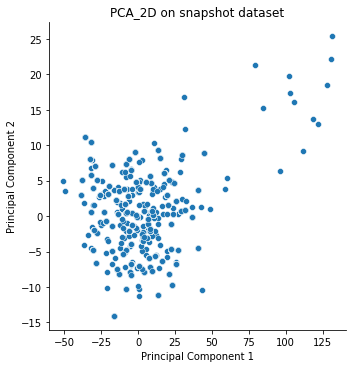

In [9]:
# Plot 2D scatterplot without index numbers 

import seaborn as sns

sns.relplot(pca_embedding[:, 0], pca_embedding[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA_2D on snapshot dataset')
plt.show()

In [9]:
# manual search of selected cells using their index numbers for comparison in high dimensions (PCA)
Big_data_set = Big_data_set.iloc[[874,1349,1707,2063,75,78,391,68,2023,2017,381,2008,405]]
Big_data_set

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,G6567-MONOMER[c],EG10346-MONOMER[c],G6995-MONOMER[c],CPLX0-3501[c],CYTOCHROME-B561-MONOMER[i],CPLX-3942[c],GLUCDEHYDROG-MONOMER[m],CPLX0-8248[c],G378-MONOMER[c],RED-THIOREDOXIN2-MONOMER[c]
874,964,1328,1167,3749,2497,1882,3802,2915,2886,1352,...,172,274,339,153,723,22,306,78,360,527
1349,1015,1311,1201,3804,2657,1852,3989,3103,3121,1305,...,157,246,347,198,682,21,294,79,365,440
1707,1071,1358,1195,3940,2633,2005,4009,3060,2968,1369,...,171,280,390,161,718,20,330,74,369,523
2063,2057,2813,2404,7971,5095,3825,8058,6105,5795,2756,...,166,543,519,249,1421,36,294,96,638,1191
75,2025,2719,2401,8075,5398,4033,8111,6191,6065,2763,...,355,371,620,291,1935,30,664,206,964,438
78,2054,2833,2396,8016,5176,3902,8020,6060,5998,2788,...,311,597,699,147,1441,36,554,194,619,442
391,2127,2853,2526,8132,5295,4113,8105,6275,5889,2778,...,239,336,406,364,1351,47,987,129,602,926
68,2046,2755,2435,8124,5064,4035,7752,6141,6002,2772,...,227,358,625,325,1582,46,669,182,364,700
2023,2066,2878,2430,8111,5326,4035,8082,6180,5867,2824,...,189,233,333,330,729,21,485,139,601,657
2017,2038,2744,2490,8316,5336,4119,8185,6177,6120,2778,...,328,296,608,219,1322,36,942,172,400,647


In [10]:
# Only include the most abundant bulkmolecules
Big_data_set3 = Big_data_set.loc[:, (Big_data_set > 1000).any()]
Big_data_set3

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,EG12303-MONOMER[c],EG10611-MONOMER[c],G7513-MONOMER[c],MONOMER0-4235[c],CYCA-MONOMER[i],EG10856-MONOMER[p],G6337-MONOMER[c],CYTOCHROME-B561-MONOMER[i],G378-MONOMER[c],RED-THIOREDOXIN2-MONOMER[c]
874,964,1328,1167,3749,2497,1882,3802,2915,2886,1352,...,389,492,610,575,242,695,609,723,360,527
1349,1015,1311,1201,3804,2657,1852,3989,3103,3121,1305,...,409,515,573,528,290,572,637,682,365,440
1707,1071,1358,1195,3940,2633,2005,4009,3060,2968,1369,...,382,491,657,661,268,646,574,718,369,523
2063,2057,2813,2404,7971,5095,3825,8058,6105,5795,2756,...,960,1318,874,880,639,623,792,1421,638,1191
75,2025,2719,2401,8075,5398,4033,8111,6191,6065,2763,...,757,1206,829,918,644,1242,1509,1935,964,438
78,2054,2833,2396,8016,5176,3902,8020,6060,5998,2788,...,410,736,821,1171,458,866,811,1441,619,442
391,2127,2853,2526,8132,5295,4113,8105,6275,5889,2778,...,576,541,702,1349,472,1505,938,1351,602,926
68,2046,2755,2435,8124,5064,4035,7752,6141,6002,2772,...,453,1086,1242,690,581,1921,578,1582,364,700
2023,2066,2878,2430,8111,5326,4035,8082,6180,5867,2824,...,553,768,1821,875,444,1448,1297,729,601,657
2017,2038,2744,2490,8316,5336,4119,8185,6177,6120,2778,...,641,1629,1228,1425,611,813,1007,1322,400,647


In [908]:
# Identify the means of each bulk molecule corresponding to how abundent they are
mean2 = Big_data_set.mean(axis=0)
mean2.sort_values(ascending=True).astype('int')

serW-tRNA[c]                    11
CPLX0-230[c]                    18
ABC-34-CPLX[i]                  20
RNA0-302[c]                     21
asnU-tRNA[c]                    21
                          ...     
PUTRESCINE[c]             18594697
CPD-12819[c]              51338639
glycogen-monomer[c]       80811275
K+[c]                    118438303
WATER[c]               52311559269
Length: 1422, dtype: int64

In [11]:
# Identify the variance of each bulk molecule
var2 = Big_data_set3.var(axis=0)
var2.sort_values(ascending=True).astype('int')

NICOTINATEPRIBOSYLTRANS-MONOMER[c]                  21175
EG11268-MONOMER[c]                                  27817
BIOTIN-SYN-CPLX[c]                                  28326
RIB5PISOMA-CPLX[c]                                  30018
BIOTIN-CARBOXYL-CPLX[c]                             31209
                                             ...         
PUTRESCINE[c]                              14967031411142
CPD-12819[c]                              114089615473718
glycogen-monomer[c]                       282684057582601
K+[c]                                     607213963769971
WATER[c]                             -9223372036854775808
Length: 865, dtype: int64

In [36]:
# reformat data set in terms of decending variance of bulk molecule mass
Newset = Big_data_set3.reindex(var2.sort_values(ascending=False).index, axis=1)
Data_set3 = Newset.iloc[:, :]
Data_set3

,WATER[c],K+[c],glycogen-monomer[c],CPD-12819[c],PUTRESCINE[c],GLUTATHIONE[c],CPD-8260[c],ATP[c],FRUCTOSE-16-DIPHOSPHATE[c],OROTATE[c],...,EG10300-MONOMER[c],CPLX0-8563[c],PHOSPHASERSYN-MONOMER[c],CPLX0-8104[i],EG12295-MONOMER[c],BIOTIN-CARBOXYL-CPLX[c],RIB5PISOMA-CPLX[c],BIOTIN-SYN-CPLX[c],EG11268-MONOMER[c],NICOTINATEPRIBOSYLTRANS-MONOMER[c]
874,27109318814,61378054,41878671,26605124,9636295,7458808,6384666,6107851,4042302,3469360,...,463,453,467,765,1152,590,597,393,437,593
1349,27286290050,61778734,42152058,26778804,9699200,7507501,6426346,6147723,4068691,3492009,...,501,536,448,781,1077,628,551,414,450,647
1707,27811534205,62967936,42963459,27294279,9885904,7652015,6550049,6266063,4147010,3559228,...,533,488,439,814,1156,601,611,431,503,656
2063,52662489200,119232842,81353394,51683043,18719440,14489462,12402835,11865095,7852565,6739571,...,808,943,679,1281,1387,974,910,668,1058,784
75,52423527871,118691811,80984245,51448526,18634498,14423714,12346556,11811256,7816933,6708989,...,1033,883,1012,1236,1568,1192,1029,604,618,668
78,51968735588,117662118,80281679,51002192,18472838,14298583,12239445,11708789,7749119,6650787,...,762,965,965,946,1505,942,869,667,620,1083
391,51726058401,117112675,79906789,50764028,18386575,14231813,12182291,11654113,7712933,6619730,...,724,850,767,1026,1327,868,880,702,696,897
68,51604073303,116836488,79718346,50644311,18343214,14198251,12153562,11626628,7694744,6604118,...,893,733,719,1132,1456,1018,831,639,424,717
2023,51141111430,115788299,79003159,50189960,18178649,14070872,12044527,11522322,7625711,6544870,...,797,860,576,1056,1097,860,723,625,595,822
2017,53080550653,120179373,81999218,52093329,18868044,14604486,12501295,11959286,7914903,6793073,...,1025,703,811,1221,1382,913,977,713,710,1011


(array([1, 2, 3, 4]),
 [Text(1, 0, 'K+[c]'),
  Text(2, 0, 'glycogen-monomer[c]'),
  Text(3, 0, 'CPD-12819[c]'),
  Text(4, 0, 'PUTRESCINE[c]')])

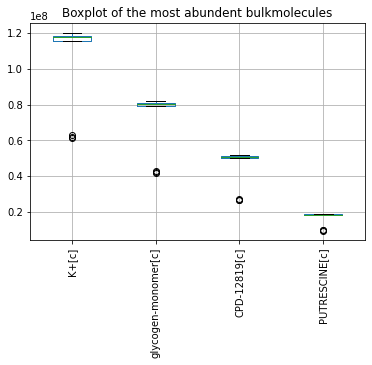

In [30]:
# Create box-plot containg the most abundent bulk molecules

Data_set3 = pd.DataFrame(Data_set3,
                  columns=['K+[c]', 'glycogen-monomer[c]', 'CPD-12819[c]', 'PUTRESCINE[c]'])
boxplot = Data_set3.boxplot(column=['K+[c]', 'glycogen-monomer[c]','CPD-12819[c]','PUTRESCINE[c]'])
plt.suptitle("")
boxplot.set_xlabel("")
boxplot.set_title("Boxplot of the most abundent bulkmolecules")
plt.xticks(rotation=90)

Text(0.5, 1.0, 'Boxplot of bulkmolecule with the largest mass')

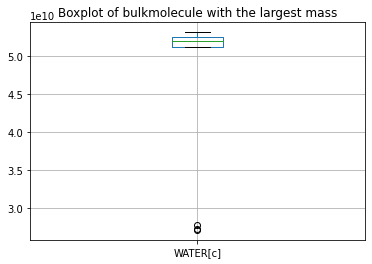

In [34]:
# Boxplot of Water content 
Data_setbox = pd.DataFrame(Data_set3,
                  columns=['WATER[c]'])
boxplot = Data_setbox.boxplot(column=['WATER[c]'])
plt.suptitle("")
boxplot.set_xlabel("")
boxplot.set_title("Boxplot of bulkmolecule with the largest mass")

In [37]:
# Total mass of each cell explored
Data_set3.sum(axis=1)

874     27359878132
1349    27536713964
1707    28069826100
2063    53135411716
75      52895298773
78      52438361255
391     52192040509
68      52068845807
2023    51601410574
2017    53561693401
381     52619666937
2008    52855241441
405     53246839409
dtype: int64

In [263]:
# cells with bulk molecule mass from most abundent found in box plots

Cell874 = [61378054,41878671,26605124,9636295,7458808,6384666,6107851,4042302,3469360]

Cell1349 = [61778734,42152058,26778804,9699200,7507501,6426346,6147723,4068691,3492009]

Cell1707 = [62967936,42963459,27294279,9885904,7652015,6550049,6266063,4147010,3559228]

Cell2063 = [119232842,81353394,51683043,18719440,14489462,12402835,11865095,7852565,6739571]

Cell75 = [118691811,80984245,51448526,18634498,14423714,12346556,11811256,7816933,6708989]

Cell78 = [117662118,80281679,51002192,18472838,14298583,12239445,11708789,7749119,6650787]

Cell391 = [117112675,79906789,50764028,18386575,14231813,12182291,11654113,7712933,6619730]

Cell68 = [116836488,79718346,50644311,18343214,14198251,12153562,11626628,7694744,6604118]

Cell2023 = [115788299,79003159,50189960,18178649,14070872,12044527,11522322,7625711,6544870]

Cell2017 = [120179373,81999218,52093329,18868044,14604486,12501295,11959286,7914903,6793073]

Cell381 = [118082297,80568369,51184323,18538805,14349644,12283153,11750602,7776791,6674537]

Cell2008 = [118598441,80920538,51408053,18619840,14412368,12336844,11801965,7810784,6703712]

Cell405 = [119472856,81517157,51787080,18757122,14518629,12427801,11888979,7868372,6753137]

Text(0.5, 0, 'Bulk Molecules')

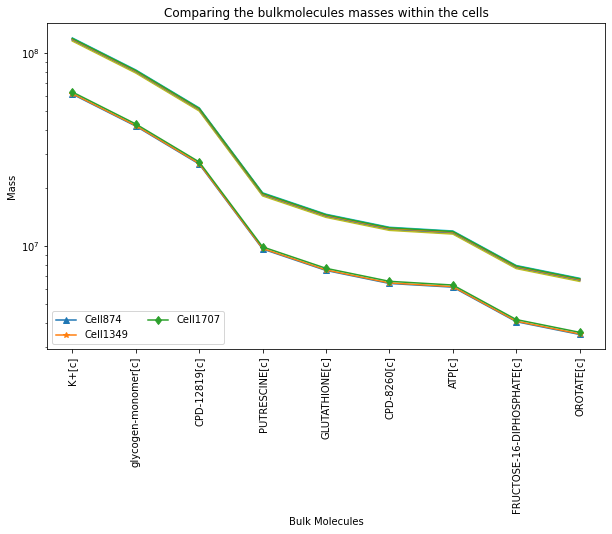

In [267]:
# Plot said cells on a line graph for comparison

plt.figure(figsize=(10,6))
plt.plot(list(range(1, 10)), Cell874, label = 'Cell874',marker = '^')
plt.plot(list(range(1, 10)), Cell1349, label = 'Cell1349',marker = '*')
plt.plot(list(range(1, 10)), Cell1707, label = 'Cell1707',marker = 'd')
plt.plot(list(range(1, 10)), Cell2063)
plt.plot(list(range(1, 10)), Cell75)
plt.plot(list(range(1, 10)), Cell78)
plt.plot(list(range(1, 10)), Cell391)
plt.plot(list(range(1, 10)), Cell68)
plt.plot(list(range(1, 10)), Cell2023)
plt.plot(list(range(1, 10)), Cell2017)
plt.plot(list(range(1, 10)), Cell381)
plt.plot(list(range(1, 10)), Cell2008)
plt.plot(list(range(1, 10)), Cell405)
plt.yscale("log")
labels = ('K+[c]','glycogen-monomer[c]','CPD-12819[c]','PUTRESCINE[c]','GLUTATHIONE[c]','CPD-8260[c]',
          'ATP[c]','FRUCTOSE-16-DIPHOSPHATE[c]','OROTATE[c]')
positions = (1, 2, 3, 4, 5, 6, 7, 8, 9)
plt.xticks(positions, labels, rotation=90)
plt.legend(loc="lower left", ncol = 2)
plt.title('Comparing the bulkmolecules masses within the cells')
plt.ylabel('Mass')
plt.xlabel('Bulk Molecules')

In [516]:
# Embed data using Isomap algorithm

start = time.perf_counter()
# Generate Isomap embedding
isomap_5 = manifold.Isomap(n_neighbors=30, n_components=2) #default settings
isomap_embedding_5 = isomap_5.fit_transform(standardised_data)

end = time.perf_counter()
print(f"Processed the Isomap algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate Isomap embedding
isomap_15 = manifold.Isomap(n_neighbors=50, n_components=2) #default settings
isomap_embedding_15 = isomap_15.fit_transform(standardised_data)

end = time.perf_counter()
print(f"Processed the Isomap algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate Isomap embedding
isomap_30 = manifold.Isomap(n_neighbors=100, n_components=2) #default settings
isomap_embedding_30 = isomap_30.fit_transform(standardised_data)

end = time.perf_counter()
print(f"Processed the Isomap algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate Isomap embedding
isomap_50 = manifold.Isomap(n_neighbors=250, n_components=2) #default settings
isomap_embedding_50 = isomap_50.fit_transform(standardised_data)

end = time.perf_counter()
print(f"Processed the Isomap algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate Isomap embedding
isomap_100 = manifold.Isomap(n_neighbors=500, n_components=2) #default settings
isomap_embedding_100 = isomap_100.fit_transform(standardised_data)

end = time.perf_counter()
print(f"Processed the Isomap algorithm in {start-end:0.4f} seconds")


Processed the Isomap algorithm in -3.3620 seconds
Processed the Isomap algorithm in -4.0132 seconds
Processed the Isomap algorithm in -6.2235 seconds
Processed the Isomap algorithm in -10.2911 seconds
Processed the Isomap algorithm in -16.5680 seconds


Text(0.5, 1.0, '500')

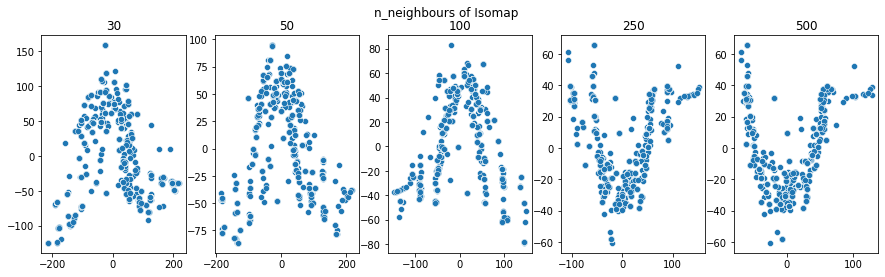

In [517]:
# Plot 2D scatterplots of adjusted hyper-parameters

import seaborn as sns

fig, axes = plt.subplots(1, 5, figsize=(15, 4))
fig.suptitle('n_neighbours of Isomap')

# Isomap neighbour = 5
g1 = sns.scatterplot(ax=axes[0], x=isomap_embedding_5[:, 0], y=isomap_embedding_5[:, 1])
axes[0].set_title('30')

# Isomap neighbour = 15
g2 = sns.scatterplot(ax=axes[1], x=isomap_embedding_15[:, 0], y=isomap_embedding_15[:, 1])
axes[1].set_title('50')

# Isomap neighbour = 30
g3 = sns.scatterplot(ax=axes[2], x=isomap_embedding_30[:, 0], y=isomap_embedding_30[:, 1])
axes[2].set_title('100')

# Isomap neighbour = 50
g4 = sns.scatterplot(ax=axes[3], x=isomap_embedding_50[:, 0], y=isomap_embedding_50[:, 1])
axes[3].set_title('250')

# Isomap neighbour = 100
g5 = sns.scatterplot(ax=axes[4], x=isomap_embedding_100[:, 0], y=isomap_embedding_50[:, 1])
axes[4].set_title('500')



In [127]:
# Label columns of Isomap embeded data sets

isomap_embedding_5.columns = ["Isomap1_2d", "Isomap2_2d"]
isomap_embedding_15.columns = ["Isomap1_2d", "Isomap2_2d"]
isomap_embedding_30.columns = ["Isomap1_2d", "Isomap2_2d"]
isomap_embedding_50.columns = ["Isomap1_2d", "Isomap2_2d"]
isomap_embedding_100.columns = ["Isomap1_2d", "Isomap2_2d"]

In [128]:
#Instructions for building the 2-D plot displaying index numbers when cursor hovers over a data point
# When N-neighbour is set to 30

trace1 = go.Scatter(
                    x = isomap_embedding_5["Isomap1_2d"],
                    y = isomap_embedding_5["Isomap2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = isomap_embedding_5.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [129]:
#Instructions for building the 2-D plot displaying index numbers when cursor hovers over a data point
# When N-neighbour is set to 50

trace1 = go.Scatter(
                    x = isomap_embedding_15["Isomap1_2d"],
                    y = isomap_embedding_15["Isomap2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = isomap_embedding_15.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [130]:
#Instructions for building the 2-D plot displaying index numbers when cursor hovers over a data point
# When N-neighbour is set to 100

trace1 = go.Scatter(
                    x = isomap_embedding_30["Isomap1_2d"],
                    y = isomap_embedding_30["Isomap2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = isomap_embedding_30.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [132]:
#Instructions for building the 2-D plot displaying index numbers when cursor hovers over a data point
# When N-neighbour is set to 250

trace1 = go.Scatter(
                    x = isomap_embedding_50["Isomap1_2d"],
                    y = isomap_embedding_50["Isomap2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = isomap_embedding_50.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [133]:
#Instructions for building the 2-D plot displaying index numbers when cursor hovers over a data point
# When N-neighbour is set to 500

trace1 = go.Scatter(
                    x = isomap_embedding_100["Isomap1_2d"],
                    y = isomap_embedding_100["Isomap2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = isomap_embedding_100.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [808]:
# manual search of selected cells using their index numbers for comparison in high dimensions (Isomap 
#when N-neighbour is 100)
Big_data_set = Big_data_set.iloc[[2019,2058,456,430,993,777]]
Big_data_set

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,G6567-MONOMER[c],EG10346-MONOMER[c],G6995-MONOMER[c],CPLX0-3501[c],CYTOCHROME-B561-MONOMER[i],CPLX-3942[c],GLUCDEHYDROG-MONOMER[m],CPLX0-8248[c],G378-MONOMER[c],RED-THIOREDOXIN2-MONOMER[c]
2019,2181,2948,2577,8677,5813,4345,8627,6716,6559,3106,...,438,692,692,357,996,26,590,192,813,551
2058,2085,2770,2611,8405,5519,4257,8460,6605,6354,2877,...,247,658,506,290,775,43,504,128,898,609
456,2139,2786,2362,8031,5335,4070,8068,6338,5898,2755,...,331,359,757,346,2179,53,534,197,822,792
430,2231,2775,2560,8271,5364,3970,8171,6207,6183,2886,...,235,370,627,277,1270,43,701,96,410,1599
993,1198,1615,1381,4448,3162,2360,4867,3889,3830,1536,...,180,423,385,196,756,31,478,113,423,562
777,1243,1678,1428,4670,3297,2561,4979,3896,3649,1582,...,177,318,409,233,896,20,502,85,381,729


In [809]:
# Only include the most abundant bulkmolecules
Big_data_set4 = Big_data_set.loc[:, (Big_data_set > 1000).any()]
Big_data_set4

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,G7003-MONOMER[c],MONOMER-51[c],EG10611-MONOMER[c],G7513-MONOMER[c],MONOMER0-4235[c],CYCA-MONOMER[i],EG10856-MONOMER[p],G6337-MONOMER[c],CYTOCHROME-B561-MONOMER[i],RED-THIOREDOXIN2-MONOMER[c]
2019,2181,2948,2577,8677,5813,4345,8627,6716,6559,3106,...,1072,653,546,1205,1065,509,1033,1392,996,551
2058,2085,2770,2611,8405,5519,4257,8460,6605,6354,2877,...,681,1106,1294,1337,895,487,1288,1367,775,609
456,2139,2786,2362,8031,5335,4070,8068,6338,5898,2755,...,975,916,1075,632,1201,1061,1258,821,2179,792
430,2231,2775,2560,8271,5364,3970,8171,6207,6183,2886,...,594,566,1013,1027,801,603,971,999,1270,1599
993,1198,1615,1381,4448,3162,2360,4867,3889,3830,1536,...,393,423,665,684,708,391,613,653,756,562
777,1243,1678,1428,4670,3297,2561,4979,3896,3649,1582,...,390,381,543,612,583,306,752,573,896,729


In [163]:
#calculate CV for each column in data frame
cv1 = Big_data_set4.apply(cv)
cv1

charged-valU-tRNA[c]           26.391080
charged-lysT-tRNA[c]           25.109259
charged-alaW-tRNA[c]           27.243445
RNA0-312[c]                    27.781676
charged-thrW-tRNA[c]           25.049011
                                 ...    
CYCA-MONOMER[i]                47.547521
EG10856-MONOMER[p]             27.275314
G6337-MONOMER[c]               36.302340
CYTOCHROME-B561-MONOMER[i]     47.134964
RED-THIOREDOXIN2-MONOMER[c]    49.514781
Length: 856, dtype: float64

In [164]:
# Sort CV values in ascending order
cv1.sort_values(ascending=False).head(50)

CPLX0-8186[c]                  67.892589
CPLX0-7921[i]                  65.891536
G6635-MONOMER[c]               63.930002
GATB-MONOMER[c]                63.706015
CPLX0-921[p]                   63.695756
GATA-MONOMER[c]                61.676926
EG10743-MONOMER[c]             58.241948
G7128-MONOMER[c]               57.443210
GLYCEROL-KIN-CPLX[c]           54.592288
CPLX0-1321[i]                  53.646636
G7258-MONOMER[i]               50.202375
NARL-MONOMER[c]                49.941477
CPLX0-8240[c]                  49.554821
RED-THIOREDOXIN2-MONOMER[c]    49.514781
HIS[c]                         48.886524
hisR-tRNA[c]                   48.356270
LYS[c]                         47.565423
CYCA-MONOMER[i]                47.547521
TYRB-DIMER[c]                  47.493446
EG11121-MONOMER[c]             47.312593
EG12434-MONOMER[c]             47.230701
CYTOCHROME-B561-MONOMER[i]     47.134964
CPLX0-7668[c]                  47.028304
ARGT-MONOMER[p]                46.955637
EG10983-MONOMER[

In [187]:
# dataset containing the 20 bulkmolecules containing the lowest CV among the selected cells
Newset = Big_data_set4.reindex(cv1.sort_values(ascending=True).index, axis=1)
Data_set4 = Newset.iloc[:, : 20]
Data_set4

,AROA-MONOMER[c],G6396-MONOMER[o],CPLX0-8223[c],PC00027[c],ISOCITHASE-CPLX[c],PD00440[c],charged-lysT-tRNA[c],RNA0-313[c],EG10673-MONOMER[o],CRR-MONOMER[i],EG10108-MONOMER[c],EG10506-MONOMER[c],charged-alaW-tRNA[c],GATB-MONOMER[c],charged-valV-tRNA[c],charged-asnT-tRNA[c],RNA0-314[c],charged-leuW-tRNA[c],charged-serX-tRNA[c],PD00260[c]
2019,3603,3175,98686,6383,34215,1434,2948,1479,61256,20220,16332,7269,2577,15486,2015,3231,3212,1710,2412,5017
2058,2933,3050,87585,6292,31500,1517,2770,1404,63224,14607,17749,6692,2611,14384,1929,3170,3125,1728,2308,6205
456,2642,2575,89500,5084,31968,1427,2786,1355,56311,16125,15644,6166,2362,12434,1808,3064,3064,1661,2203,5069
430,2651,2044,101856,5976,33841,1196,2775,1443,60698,19187,16272,6303,2560,16823,1919,3249,3083,1615,2202,5540
993,1751,2303,44820,3848,15577,1010,1615,763,36105,9870,9802,3847,1381,1680,1026,1749,1745,953,1282,2944
777,1670,1884,45118,3690,14849,1003,1678,750,34279,10040,11095,3630,1428,2480,1000,1631,1710,971,1252,2795


In [810]:
# dataset containing the 50 bulkmolecules with the highest variance
Newset = Big_data_set4.reindex(var2.sort_values(ascending=False).index, axis=1)
Data_set4 = Newset.iloc[:, : 50]
Data_set4

,WATER[c],K+[c],glycogen-monomer[c],CPD-12819[c],PUTRESCINE[c],GLUTATHIONE[c],CPD-8260[c],ATP[c],FRUCTOSE-16-DIPHOSPHATE[c],OROTATE[c],...,OXIDIZED-GLUTATHIONE[c],L-ALPHA-ALANINE[c],CPD-13469[c],ACETYL-P[c],ACETYL-COA[c],LYS[c],UDP[c],SER[c],GLY[c],IMP[c]
2019,57968082283,131245206,89549513,56889959,20605369,15949233,13652385,13060469,8643689,7418563,...,1827516,1373027,1559661,1451163,1434889,850209,1295875,970938,784874,1045380
2058,57034564786,129131634,88107408,55973804,20273541,15692386,13432527,12850143,8504491,7299095,...,1798086,1036516,1534544,1427793,1411781,496775,1275007,839755,715658,1028545
456,53180818426,120406388,82154113,52191732,18903685,14632073,12524910,11981876,7929854,6805905,...,1676592,1306717,1430857,1331320,1316389,861333,1188856,858800,657193,959048
430,52850255034,119657962,81643457,51867316,18786182,14541123,12447057,11907400,7880563,6763601,...,1666170,1438904,1421963,1323045,1308207,1037021,1181466,1034708,794090,953086
993,32702484104,74041508,50519034,32094265,11624444,8997702,7701944,7368016,4876306,4185155,...,1030987,496826,879878,818669,809487,321010,731063,489581,287678,589747
777,32668595504,73964781,50466682,32061007,11612398,8988378,7693962,7360381,4871253,4180819,...,1029918,562026,878966,817820,808648,320562,730306,451267,340178,589136


In [811]:
# Total mass of selected cells
Data_set4.sum(axis=1)

2019    58461314989
2058    57519232152
456     53635368309
430     53302519118
993     32986021110
777     32950785534
dtype: int64

In [229]:
# dataset containing the top 10 with highest average (most abundent)
Newset = Big_data_set4.reindex(mean2.sort_values(ascending=False).index, axis=1)
Data_set4 = Newset.iloc[:, : 10]
Data_set4

,WATER[c],K+[c],glycogen-monomer[c],CPD-12819[c],GLT[c],PUTRESCINE[c],GLUTATHIONE[c],CPD-8260[c],ATP[c],FRUCTOSE-16-DIPHOSPHATE[c]
2019,57968082283,131245206,89549513,56889959,18615998,20605369,15949233,13652385,13060469,8643689
2058,57034564786,129131634,88107408,55973804,19163472,20273541,15692386,13432527,12850143,8504491
456,53180818426,120406388,82154113,52191732,18419418,18903685,14632073,12524910,11981876,7929854
430,52850255034,119657962,81643457,51867316,17599425,18786182,14541123,12447057,11907400,7880563
993,32702484104,74041508,50519034,32094265,16031953,11624444,8997702,7701944,7368016,4876306
777,32668595504,73964781,50466682,32061007,15277446,11612398,8988378,7693962,7360381,4871253


In [233]:
# manual search of selected cells using their index numbers for comparison in high dimensions (Isomap 
#when N-neighbour is 250)
Big_data_set = Big_data_set.iloc[[1973,2064,2020,2054,43,76,1990,409,2069]]
Big_data_set

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,EG10346-MONOMER[c],G6995-MONOMER[c],CPLX0-3501[c],CYTOCHROME-B561-MONOMER[i],CPLX-3942[c],GLUCDEHYDROG-MONOMER[m],CPLX0-8248[c],G378-MONOMER[c],RED-THIOREDOXIN2-MONOMER[c],EG12128-MONOMER[i]
1973,1856,2495,2122,6866,4605,3422,6939,5296,5115,2452,...,263,667,143,720,36,531,98,655,881,234
2064,1907,2491,2197,7263,4703,3664,7234,5580,5330,2523,...,321,659,159,1427,33,462,158,385,681,278
2020,1770,2438,2141,7209,4641,3550,7168,5479,5149,2390,...,760,598,392,1738,38,856,135,395,1012,231
2054,2229,2932,2528,8457,5539,4109,8349,6539,6235,2919,...,296,403,297,1689,26,434,170,763,495,253
43,1995,2759,2452,8143,5319,3964,8000,6286,5881,2843,...,268,866,232,1179,27,436,269,339,740,259
76,2116,2837,2578,8452,5462,4192,8287,6351,6276,2901,...,447,432,384,1226,38,489,188,820,513,436
1990,2216,2941,2557,8678,5629,4430,8619,6767,6390,3083,...,563,769,343,1623,31,644,132,1144,1013,412
409,2247,3000,2519,8670,5564,4209,8757,6737,6345,2884,...,560,517,271,2113,38,746,269,628,878,454
2069,2371,2946,2655,8765,5824,4528,8980,6962,6700,3126,...,538,1164,257,1636,58,431,143,615,1039,499


In [234]:
# dataset containing the most abundant bulk molecules
Big_data_set4 = Big_data_set.loc[:, (Big_data_set > 1000).any()]
Big_data_set4

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,EG10611-MONOMER[c],G7513-MONOMER[c],MONOMER0-4235[c],CYCA-MONOMER[i],EG10856-MONOMER[p],G6337-MONOMER[c],G6995-MONOMER[c],CYTOCHROME-B561-MONOMER[i],G378-MONOMER[c],RED-THIOREDOXIN2-MONOMER[c]
1973,1856,2495,2122,6866,4605,3422,6939,5296,5115,2452,...,545,1000,912,282,1120,856,667,720,655,881
2064,1907,2491,2197,7263,4703,3664,7234,5580,5330,2523,...,1176,747,1124,520,1099,1002,659,1427,385,681
2020,1770,2438,2141,7209,4641,3550,7168,5479,5149,2390,...,612,838,1347,518,894,730,598,1738,395,1012
2054,2229,2932,2528,8457,5539,4109,8349,6539,6235,2919,...,911,1139,1139,538,1272,1260,403,1689,763,495
43,1995,2759,2452,8143,5319,3964,8000,6286,5881,2843,...,1126,1022,1372,846,1358,1269,866,1179,339,740
76,2116,2837,2578,8452,5462,4192,8287,6351,6276,2901,...,1174,1120,822,402,1058,891,432,1226,820,513
1990,2216,2941,2557,8678,5629,4430,8619,6767,6390,3083,...,990,1320,885,663,1017,1475,769,1623,1144,1013
409,2247,3000,2519,8670,5564,4209,8757,6737,6345,2884,...,1076,1251,1188,1020,1763,846,517,2113,628,878
2069,2371,2946,2655,8765,5824,4528,8980,6962,6700,3126,...,965,925,1322,691,1158,1011,1164,1636,615,1039


In [235]:
#calculate CV for each column in data frame
cv1 = Big_data_set4.apply(cv)
cv1

charged-valU-tRNA[c]            9.888608
charged-lysT-tRNA[c]            8.170005
charged-alaW-tRNA[c]            8.502231
RNA0-312[c]                     9.157796
charged-thrW-tRNA[c]            9.005375
                                 ...    
G6337-MONOMER[c]               23.654785
G6995-MONOMER[c]               35.085004
CYTOCHROME-B561-MONOMER[i]     27.081336
G378-MONOMER[c]                39.876376
RED-THIOREDOXIN2-MONOMER[c]    26.066709
Length: 878, dtype: float64

In [191]:
# data set containing the top 50 bulk molecules with the lowest CV
Newset = Big_data_set4.reindex(cv1.sort_values(ascending=True).index, axis=1)
Data_set4 = Newset.iloc[:, : 50]
Data_set4

,AROA-MONOMER[c],G6396-MONOMER[o],CPLX0-8223[c],PC00027[c],ISOCITHASE-CPLX[c],PD00440[c],charged-lysT-tRNA[c],RNA0-313[c],EG10673-MONOMER[o],CRR-MONOMER[i],...,charged-argY-tRNA[c],charged-glnU-tRNA[c],RNA0-309[c],ANTHRANSYNCOMPI-MONOMER[c],charged-argZ-tRNA[c],charged-argQ-tRNA[c],charged-glnX-tRNA[c],charged-lysV-tRNA[c],G6833-MONOMER[c],charged-tyrV-tRNA[c]
1973,2701,3023,78655,5055,27786,1232,2495,1191,48201,16777,...,5575,2452,3422,1236,1431,5138,1906,1650,3131,3657
2064,2841,3085,77214,5094,29391,1428,2491,1232,50220,13897,...,5938,2523,3664,1182,1526,5587,1963,1559,3328,3624
2020,2725,2547,75470,5613,27258,1245,2438,1220,55713,14336,...,5889,2390,3550,1149,1549,5464,1873,1605,3553,3577
2054,2733,3015,91589,5603,32965,1456,2932,1472,54658,15824,...,6970,2919,4109,1279,1778,6461,2304,1949,3209,4381
43,2708,2861,85573,5051,31850,1458,2759,1326,59405,16768,...,6678,2843,3964,1116,1762,6320,2217,1871,4110,4178
76,2999,3005,87543,5389,32826,1405,2837,1431,53916,16066,...,6819,2901,4192,1113,1773,6285,2337,1882,3462,4280
1990,2832,2828,86659,5801,32600,1504,2941,1438,62523,16371,...,7173,3083,4430,1428,1891,6758,2368,1975,4050,4541
409,2895,3108,90046,5189,32385,1484,3000,1427,56735,14908,...,7111,2884,4209,1188,1866,6434,2365,1959,3443,4404
2069,3121,3253,91575,6365,34459,1579,2946,1443,60092,18175,...,7298,3126,4528,1026,1832,6820,2371,2034,3388,4558


In [180]:
# data set with top 50 bulk molecules with the highest variances
Newset = Big_data_set4.reindex(var2.sort_values(ascending=False).index, axis=1)
Data_set4 = Newset.iloc[:, : 50]
Data_set4

,WATER[c],K+[c],glycogen-monomer[c],CPD-12819[c],PUTRESCINE[c],GLUTATHIONE[c],CPD-8260[c],ATP[c],FRUCTOSE-16-DIPHOSPHATE[c],OROTATE[c],...,OXIDIZED-GLUTATHIONE[c],L-ALPHA-ALANINE[c],CPD-13469[c],ACETYL-P[c],ACETYL-COA[c],LYS[c],UDP[c],SER[c],GLY[c],IMP[c]
1973,44751649862,101321956,69132672,43919333,15907448,12312888,10539709,10082747,6672971,5727168,...,1410852,951354,1204066,1120305,1107741,593537,1000423,649118,464535,807038
2064,45665066202,103390017,70543725,44815762,16232132,12564203,10754833,10288544,6809171,5844064,...,1439648,911059,1228643,1143171,1130351,626790,1020841,670440,514260,823511
2020,46387363459,105025365,71659534,45524625,16488880,12762935,10924945,10451281,6916874,5936501,...,1462420,1305117,1248076,1161253,1148230,908522,1036988,829595,687995,836536
2054,53305828593,120689423,82347230,52314417,18948122,14666469,12554351,12010042,7948494,6821903,...,1680533,1364809,1434221,1334449,1319483,796705,1191651,981239,845952,961302
43,53044090409,120096823,81942895,52057546,18855084,14594455,12492708,11951071,7909467,6788407,...,1672281,1232197,1427179,1327897,1313004,742382,1185799,874005,742713,956582
76,53772729232,121746530,83068501,52772633,19114086,14794931,12664314,12115237,8018115,6881656,...,1695253,771749,1446783,1346137,1331040,373811,1202088,647239,498407,969722
1990,59278137988,134211295,91573296,58175649,21071042,16309679,13960923,13355630,8839033,7586220,...,1868817,1418474,1594909,1483959,1467317,839385,1325162,1057574,911417,1069005
409,58116071924,131580268,89778128,57035196,20657974,15989951,13687238,13093812,8665756,7437503,...,1832182,1276506,1563643,1454868,1438552,949361,1299184,1014719,759613,1048049
2069,58864075215,133273817,90933649,57769288,20923859,16195755,13863405,13262340,8777291,7533229,...,1855763,1330897,1583769,1473594,1457067,666497,1315905,1028701,688119,1061538


In [236]:
# data set with the top 10 bulk molecules with the highest averages
Newset = Big_data_set4.reindex(mean2.sort_values(ascending=False).index, axis=1)
Data_set4 = Newset.iloc[:, : 10]
Data_set4

,WATER[c],K+[c],glycogen-monomer[c],CPD-12819[c],GLT[c],PUTRESCINE[c],GLUTATHIONE[c],CPD-8260[c],ATP[c],FRUCTOSE-16-DIPHOSPHATE[c]
1973,44751649862,101321956,69132672,43919333,15467783,15907448,12312888,10539709,10082747,6672971
2064,45665066202,103390017,70543725,44815762,15853253,16232132,12564203,10754833,10288544,6809171
2020,46387363459,105025365,71659534,45524625,16646688,16488880,12762935,10924945,10451281,6916874
2054,53305828593,120689423,82347230,52314417,17388016,18948122,14666469,12554351,12010042,7948494
43,53044090409,120096823,81942895,52057546,17453723,18855084,14594455,12492708,11951071,7909467
76,53772729232,121746530,83068501,52772633,17068430,19114086,14794931,12664314,12115237,8018115
1990,59278137988,134211295,91573296,58175649,20466562,21071042,16309679,13960923,13355630,8839033
409,58116071924,131580268,89778128,57035196,21213525,20657974,15989951,13687238,13093812,8665756
2069,58864075215,133273817,90933649,57769288,20155422,20923859,16195755,13863405,13262340,8777291


In [199]:
# manual search of selected cells using their index numbers for comparison in high dimensions (Isomap 
#when N-neighbour is 500)
Big_data_set = Big_data_set.iloc[[2040,1973,403, 2052, 447, 2032, 74, 2028, 2026]]
Big_data_set

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,EG10346-MONOMER[c],G6995-MONOMER[c],CPLX0-3501[c],CYTOCHROME-B561-MONOMER[i],CPLX-3942[c],GLUCDEHYDROG-MONOMER[m],CPLX0-8248[c],G378-MONOMER[c],RED-THIOREDOXIN2-MONOMER[c],EG12128-MONOMER[i]
2040,1784,2262,2011,6906,4635,3337,6875,5227,4997,2502,...,377,452,233,1024,23,440,158,291,433,621
1973,1856,2495,2122,6866,4605,3422,6939,5296,5115,2452,...,263,667,143,720,36,531,98,655,881,234
403,1772,2420,2151,7046,4499,3521,7168,5500,5258,2283,...,358,382,332,825,24,385,125,472,1183,300
2052,2143,2832,2543,8433,5531,3970,8215,6253,6207,2889,...,369,466,353,1030,22,512,243,758,735,351
447,2016,2925,2506,8275,5184,3925,8158,6134,6034,2809,...,386,385,367,1061,29,404,101,722,1889,384
2032,2032,2787,2471,7965,5211,4024,7985,6055,5907,2830,...,361,518,240,1403,47,548,143,995,743,325
74,2424,3148,2646,9036,5796,4548,9136,7043,6650,2995,...,782,1203,220,1297,38,648,143,866,747,293
2028,2262,3074,2701,8943,6024,4482,8939,6701,6657,3073,...,347,1034,285,1448,86,597,292,639,778,233
2026,2051,2900,2562,8521,5514,4096,8494,6516,6279,2888,...,295,629,497,1999,38,1125,93,1133,1505,339


In [200]:
# data set with the most abundent bulk molecules
Big_data_set4 = Big_data_set.loc[:, (Big_data_set > 1000).any()]
Big_data_set4

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,G7513-MONOMER[c],MONOMER0-4235[c],CYCA-MONOMER[i],EG10856-MONOMER[p],G6337-MONOMER[c],G6995-MONOMER[c],CYTOCHROME-B561-MONOMER[i],GLUCDEHYDROG-MONOMER[m],G378-MONOMER[c],RED-THIOREDOXIN2-MONOMER[c]
2040,1784,2262,2011,6906,4635,3337,6875,5227,4997,2502,...,494,626,502,1233,442,452,1024,440,291,433
1973,1856,2495,2122,6866,4605,3422,6939,5296,5115,2452,...,1000,912,282,1120,856,667,720,531,655,881
403,1772,2420,2151,7046,4499,3521,7168,5500,5258,2283,...,1337,1492,659,1029,738,382,825,385,472,1183
2052,2143,2832,2543,8433,5531,3970,8215,6253,6207,2889,...,1075,682,1220,746,909,466,1030,512,758,735
447,2016,2925,2506,8275,5184,3925,8158,6134,6034,2809,...,844,754,796,792,2153,385,1061,404,722,1889
2032,2032,2787,2471,7965,5211,4024,7985,6055,5907,2830,...,1401,1066,747,1574,1076,518,1403,548,995,743
74,2424,3148,2646,9036,5796,4548,9136,7043,6650,2995,...,1289,907,882,2358,1365,1203,1297,648,866,747
2028,2262,3074,2701,8943,6024,4482,8939,6701,6657,3073,...,680,1305,712,1771,1230,1034,1448,597,639,778
2026,2051,2900,2562,8521,5514,4096,8494,6516,6279,2888,...,1112,747,793,1016,832,629,1999,1125,1133,1505


In [197]:
# data set with top 50 bulkmolecules with the highest variance among selected cells
Newset = Big_data_set4.reindex(var2.sort_values(ascending=False).index, axis=1)
Data_set4 = Newset.iloc[:, : 50]
Data_set4

,WATER[c],K+[c],glycogen-monomer[c],CPD-12819[c],PUTRESCINE[c],GLUTATHIONE[c],CPD-8260[c],ATP[c],FRUCTOSE-16-DIPHOSPHATE[c],OROTATE[c],...,OXIDIZED-GLUTATHIONE[c],L-ALPHA-ALANINE[c],CPD-13469[c],ACETYL-P[c],ACETYL-COA[c],LYS[c],UDP[c],SER[c],GLY[c],IMP[c]
2040,45035709793,101965094,69571490,44198110,16008420,12391043,10606610,10146748,6715327,5763521,...,1419807,1036958,1211709,1127417,1114773,615355,1006772,677155,602855,812161
1973,44751649862,101321956,69132672,43919333,15907448,12312888,10539709,10082747,6672971,5727168,...,1410852,951354,1204066,1120305,1107741,593537,1000423,649118,464535,807038
403,46211233448,104626591,71387448,45351771,16426272,12714475,10883464,10411598,6890611,5913960,...,1456867,1014907,1243337,1156844,1143870,632838,1033051,750985,523957,833361
2052,53607622042,121372712,82813442,52610597,19055397,14749504,12625428,12078037,7993495,6860526,...,1690048,1285903,1442341,1342004,1326954,771150,1198397,886635,786937,966745
447,52402985920,118645302,80952511,51428365,18627196,14418062,12341718,11806628,7813870,6706361,...,1652070,1503159,1409929,1311848,1297136,1104291,1171468,955928,897506,945021
2032,52324904535,118468519,80831891,51351737,18599442,14396580,12323328,11789036,7802228,6696368,...,1649608,1397679,1407828,1309893,1295203,1278991,1169722,983706,802876,943612
74,59208302635,134053181,91465414,58107113,21046218,16290465,13944476,13339896,8828619,7577282,...,1866616,1801984,1593030,1482211,1465588,1173266,1323601,1228405,1094332,1067746
2028,58225143195,131827216,89946623,57142239,20696744,16019960,13712926,13118386,8682019,7451461,...,1835621,1462166,1566578,1457599,1441251,908677,1301621,1079662,888355,1050016
2026,57807466936,130881557,89301393,56732331,20548277,15905041,13614557,13024281,8619739,7398008,...,1822453,1584292,1555340,1447142,1430913,1167167,1292284,1121358,859030,1042483


In [202]:
# data set with top 10 bulk molecules with highest mass averages
Newset = Big_data_set4.reindex(mean2.sort_values(ascending=False).index, axis=1)
Data_set4 = Newset.iloc[:, : 10]
Data_set4

,WATER[c],K+[c],glycogen-monomer[c],CPD-12819[c],GLT[c],PUTRESCINE[c],GLUTATHIONE[c],CPD-8260[c],ATP[c],FRUCTOSE-16-DIPHOSPHATE[c]
2040,45035709793,101965094,69571490,44198110,14813773,16008420,12391043,10606610,10146748,6715327
1973,44751649862,101321956,69132672,43919333,15467783,15907448,12312888,10539709,10082747,6672971
403,46211233448,104626591,71387448,45351771,16018508,16426272,12714475,10883464,10411598,6890611
2052,53607622042,121372712,82813442,52610597,17548472,19055397,14749504,12625428,12078037,7993495
447,52402985920,118645302,80952511,51428365,16630621,18627196,14418062,12341718,11806628,7813870
2032,52324904535,118468519,80831891,51351737,18173058,18599442,14396580,12323328,11789036,7802228
74,59208302635,134053181,91465414,58107113,19725491,21046218,16290465,13944476,13339896,8828619
2028,58225143195,131827216,89946623,57142239,19954411,20696744,16019960,13712926,13118386,8682019
2026,57807466936,130881557,89301393,56732331,19290315,20548277,15905041,13614557,13024281,8619739


In [238]:
# Top 6 bulkmolecules with the highest mass average among selected cells

Cell2040 = [14813773,16008420,12391043,10606610,10146748,6715327]

Cell777 = [15277446,11612398,8988378,7693962,7360381,4871253]

Cell1973 = [15467783,15907448,12312888,10539709,10082747,6672971]

Cell2064 = [15853253,16232132,12564203,10754833,10288544,6809171]

Cell403 = [16018508,16426272,12714475,10883464,10411598,6890611]

Cell993 = [16031953,11624444,8997702,7701944,7368016,4876306]

Cell447 = [16630621,18627196,14418062,12341718,11806628,7813870]

Cell2020 = [16646688,16488880,12762935,10924945,10451281,6916874]

Cell76 = [17068430,19114086,14794931,12664314,12115237,8018115]

Cell2054 = [17388016,18948122,14666469,12554351,12010042,7948494]

Cell43 = [17453723,18855084,14594455,12492708,11951071,7909467]

Cell2052 = [17548472,19055397,14749504,12625428,12078037,7993495]

Cell430 = [17599425,18786182,14541123,12447057,11907400,7880563]

Cell2032 = [18173058,18599442,14396580,12323328,11789036,7802228]

Cell456 = [18419418,18903685,14632073,12524910,11981876,7929854]

Cell2019 = [18615998,20605369,15949233,13652385,13060469,8643689]

Cell2058 = [19163472,20273541,15692386,13432527,12850143,8504491]

Cell2026 = [19290315,20548277,15905041,13614557,13024281,8619739]

Cell74 = [19725491,21046218,16290465,13944476,13339896,8828619]

Cell2028 = [19954411,20696744,16019960,13712926,13118386,8682019]

Cell1990 = [20466562,21071042,16309679,13960923,13355630,8839033]

Cell409 = [21213525,20657974,15989951,13687238,13093812,8665756]

Cell2069 = [20155422,20923859,16195755,13863405,13262340,8777291]

Text(0.5, 0, 'Bulk Molecules')

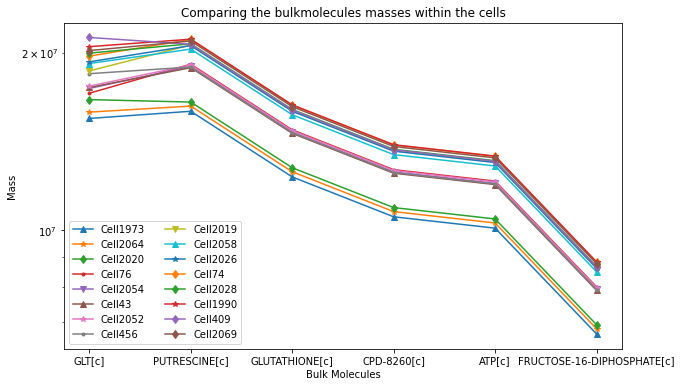

In [252]:
# Plot cells in line graph

plt.figure(figsize=(10,6))
plt.plot(list(range(1, 7)), Cell1973, label = 'Cell1973',marker = '^')
plt.plot(list(range(1, 7)), Cell2064, label = 'Cell2064',marker = '*')
plt.plot(list(range(1, 7)), Cell2020, label = 'Cell2020',marker = 'd')
plt.plot(list(range(1, 7)), Cell76, label = 'Cell76',marker='.')
plt.plot(list(range(1, 7)), Cell2054, label = 'Cell2054',marker = 'v')
plt.plot(list(range(1, 7)), Cell43, label = 'Cell43',marker = '^')
plt.plot(list(range(1, 7)), Cell2052, label = 'Cell2052',marker = '*')
plt.plot(list(range(1, 7)), Cell456, label = 'Cell456',marker='.')
plt.plot(list(range(1, 7)), Cell2019, label = 'Cell2019',marker = 'v')
plt.plot(list(range(1, 7)), Cell2058, label = 'Cell2058',marker = '^')
plt.plot(list(range(1, 7)), Cell2026, label = 'Cell2026',marker = '*')
plt.plot(list(range(1, 7)), Cell74, label = 'Cell74',marker = 'd')
plt.plot(list(range(1, 7)), Cell2028, label = 'Cell2028',marker = 'd')
plt.plot(list(range(1, 7)), Cell1990, label = 'Cell1990',marker = '*')
plt.plot(list(range(1, 7)), Cell409, label = 'Cell409',marker = 'd')
plt.plot(list(range(1, 7)), Cell2069, label = 'Cell2069',marker = 'd')
plt.yscale("log")
labels = ('GLT[c]','PUTRESCINE[c]', 'GLUTATHIONE[c]','CPD-8260[c]','ATP[c]','FRUCTOSE-16-DIPHOSPHATE[c]')
positions = (1, 2, 3, 4, 5, 6)
plt.xticks(positions, labels)
plt.legend(loc="lower left", ncol = 2)
plt.title('Comparing the bulkmolecules masses within the cells')
plt.ylabel('Mass')
plt.xlabel('Bulk Molecules')

In [20]:
# Embed standardised data using t-SNE algorithm

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding1 = TSNE(n_components=2, perplexity=5.0, n_iter=1000, verbose=1, random_state=0).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding2 = TSNE(n_components=2, perplexity=30.0, n_iter=1000, verbose=1, random_state=0).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding3 = TSNE(n_components=2, perplexity=100.0, n_iter=1000, verbose=1, random_state=0).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding4 = TSNE(n_components=2, perplexity=500.0, n_iter=1000, verbose=1, random_state=0).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding5 = TSNE(n_components=2, perplexity=1000.0, n_iter=1000, verbose=1, random_state=0).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

NameError: name 'time' is not defined

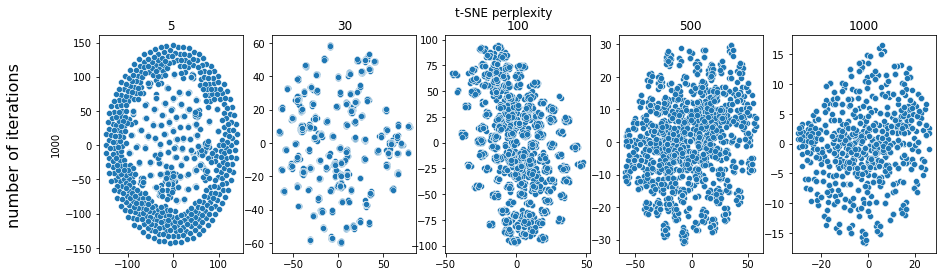

In [275]:
# plot 2D scatterplots containing adjusted perplexities (5,30,100,500,1000)

import seaborn as sns

fig, axes = plt.subplots(1, 5, figsize=(15, 4))
fig.suptitle('t-SNE perplexity')
fig.text(0.04, 0.5, 'number of iterations', va='center', rotation='vertical', fontsize = 16)

# t-SNE perplexity = 5
g1 = sns.scatterplot(ax=axes[0], x=tsne_embedding1[:, 0], y=tsne_embedding1[:, 1])
axes[0].set_title('5')
g1.set(ylabel = '1000')


# t-SNE perplexity = 15
g2 = sns.scatterplot(ax=axes[1], x=tsne_embedding2[:, 0], y=tsne_embedding2[:, 1])
axes[1].set_title('30')

# t-SNE perplexity = 30
g3 = sns.scatterplot(ax=axes[2], x=tsne_embedding3[:, 0], y=tsne_embedding3[:, 1])
axes[2].set_title('100')

# t-SNE perplexity = 50
g4 = sns.scatterplot(ax=axes[3], x=tsne_embedding4[:, 0], y=tsne_embedding4[:, 1])
axes[3].set_title('500')

# t-SNE perplexity = 100
g5 = sns.scatterplot(ax=axes[4], x=tsne_embedding5[:, 0], y=tsne_embedding5[:, 1])
axes[4].set_title('1000')

plt.show()

In [22]:

import time
from sklearn.manifold import TSNE

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding1 = pd.DataFrame(TSNE(n_components=2, perplexity=5.0, n_iter=1000, verbose=1, 
                                    random_state=0).fit_transform(standardised_data))
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding2 = pd.DataFrame(TSNE(n_components=2, perplexity=30.0, n_iter=1000, verbose=1, 
                                    random_state=0).fit_transform(standardised_data))
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding3 = pd.DataFrame(TSNE(n_components=2, perplexity=100.0, n_iter=1000, verbose=1, 
                                    random_state=0).fit_transform(standardised_data))
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding4 = pd.DataFrame(TSNE(n_components=2, perplexity=500.0, n_iter=1000, verbose=1, 
                                    random_state=0).fit_transform(standardised_data))
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding5 = pd.DataFrame(TSNE(n_components=2, perplexity=1000.0, n_iter=1000, verbose=1, 
                                    random_state=0).fit_transform(standardised_data))
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.003s...
[t-SNE] Computed neighbors for 2070 samples in 1.029s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.622227
[t-SNE] KL divergence after 1000 iterations: 0.154887
Processed the t-SNE algorithm in -11.3391 seconds
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.002s...
[t-SNE] Computed neighbors for 2070 samples in 0.162s...


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 12.271220
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.014271
[t-SNE] KL divergence after 1000 iterations: 0.053480
Processed the t-SNE algorithm in -9.4348 seconds
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.001s...
[t-SNE] Computed neighbors for 2070 samples in 0.193s...


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 17.457280
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.728195
[t-SNE] KL divergence after 1000 iterations: 0.098946
Processed the t-SNE algorithm in -13.2824 seconds
[t-SNE] Computing 1501 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.001s...


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computed neighbors for 2070 samples in 1.258s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 20.893191
[t-SNE] KL divergence after 100 iterations with early exaggeration: 46.058228
[t-SNE] KL divergence after 1000 iterations: 0.112926
Processed the t-SNE algorithm in -31.5486 seconds
[t-SNE] Computing 2069 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.001s...


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computed neighbors for 2070 samples in 1.170s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 24.611455
[t-SNE] KL divergence after 100 iterations with early exaggeration: 38.121506
[t-SNE] KL divergence after 1000 iterations: 0.149963
Processed the t-SNE algorithm in -36.7427 seconds


In [23]:
# label t-SNE embed datasets (perplexity = 5,30, 100, 500, 1000)
tsne_embedding1.columns = ["tsne1_2d", "tsne2_2d"]
tsne_embedding2.columns = ["tsne1_2d", "tsne2_2d"]
tsne_embedding3.columns = ["tsne1_2d", "tsne2_2d"]
tsne_embedding4.columns = ["tsne1_2d", "tsne2_2d"]
tsne_embedding5.columns = ["tsne1_2d", "tsne2_2d"]

In [24]:
#Instructions for building the 2-D plot displaying index numbers when cursor hovers over a data point
# When perplexity is set to 5
trace1 = go.Scatter(
                    x = tsne_embedding1["tsne1_2d"],
                    y = tsne_embedding1["tsne2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = tsne_embedding1.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [41]:
var2 = Big_data_set3.var(axis=0)
var2.sort_values(ascending=True).astype('int')

HYPOXANTHINE[c]                       5423
RNA0-313[c]                           6706
PHES-CPLX[c]                          9184
GUANOSINE[c]                         10491
CPLX0-7614[c]                        10633
                              ...         
PUTRESCINE[c]                2109064563713
CPD-12819[c]                16076829167448
glycogen-monomer[c]         39834158902437
K+[c]                       85564985079777
WATER[c]              -9223372036854775808
Length: 895, dtype: int64

In [126]:
Big_data_set.corr().abs()

,charged-valU-tRNA[c],RNA0-312[c],RNA0-323[c],RNA0-319[c],charged-metT-tRNA[c],charged-glnW-tRNA[c],charged-valX-tRNA[c]
charged-valU-tRNA[c],1.000000,0.797343,0.778021,0.871124,0.751092,0.796835,0.782627
RNA0-312[c],0.797343,1.000000,0.877175,0.882680,0.974197,0.919887,0.952776
RNA0-323[c],0.778021,0.877175,1.000000,0.867194,0.925144,0.963412,0.920138
RNA0-319[c],0.871124,0.882680,0.867194,1.000000,0.916475,0.941191,0.917760
charged-metT-tRNA[c],0.751092,0.974197,0.925144,0.916475,1.000000,0.973981,0.969359
charged-glnW-tRNA[c],0.796835,0.919887,0.963412,0.941191,0.973981,1.000000,0.955902
charged-valX-tRNA[c],0.782627,0.952776,0.920138,0.917760,0.969359,0.955902,1.000000


In [127]:
Big_data_set.T.corr().abs()

,1572,872,417,572,60,435,395,1472,61,1372,2000
1572,1.000000,1.000000,0.999671,1.000000,0.999668,0.999551,0.999941,1.000000,0.999821,1.000000,0.999834
872,1.000000,1.000000,0.999671,1.000000,0.999668,0.999551,0.999941,1.000000,0.999821,1.000000,0.999834
417,0.999671,0.999671,1.000000,0.999671,0.999220,0.998997,0.999828,0.999671,0.999656,0.999671,0.999456
572,1.000000,1.000000,0.999671,1.000000,0.999668,0.999551,0.999941,1.000000,0.999821,1.000000,0.999834
60,0.999668,0.999668,0.999220,0.999668,1.000000,0.998939,0.999498,0.999668,0.999083,0.999668,0.999497
435,0.999551,0.999551,0.998997,0.999551,0.998939,1.000000,0.999525,0.999551,0.999396,0.999551,0.999676
395,0.999941,0.999941,0.999828,0.999941,0.999498,0.999525,1.000000,0.999941,0.999891,0.999941,0.999730
1472,1.000000,1.000000,0.999671,1.000000,0.999668,0.999551,0.999941,1.000000,0.999821,1.000000,0.999834
61,0.999821,0.999821,0.999656,0.999821,0.999083,0.999396,0.999891,0.999821,1.000000,0.999821,0.999482
1372,1.000000,1.000000,0.999671,1.000000,0.999668,0.999551,0.999941,1.000000,0.999821,1.000000,0.999834


In [124]:
# Create correlation matrix
corr_matrix = Big_data_set.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] < 0.75)]

# Drop features 
Big_data_set.drop(to_drop, axis=1, inplace=True)

Big_data_set

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,charged-valU-tRNA[c],RNA0-312[c],RNA0-323[c],RNA0-319[c],charged-metT-tRNA[c],charged-glnW-tRNA[c],charged-valX-tRNA[c]
1572,2105,8030,6237,6828,10779,6012,5698
872,2105,8030,6237,6828,10779,6012,5698
417,2065,8039,6166,6970,10884,6056,5787
572,2105,8030,6237,6828,10779,6012,5698
60,1935,7924,5968,6527,10587,5807,5548
435,1971,7869,6282,6701,10750,6029,5653
395,1930,7409,5745,6353,9975,5602,5277
1472,2105,8030,6237,6828,10779,6012,5698
61,1949,7578,5909,6553,10250,5722,5328
1372,2105,8030,6237,6828,10779,6012,5698


<AxesSubplot:>

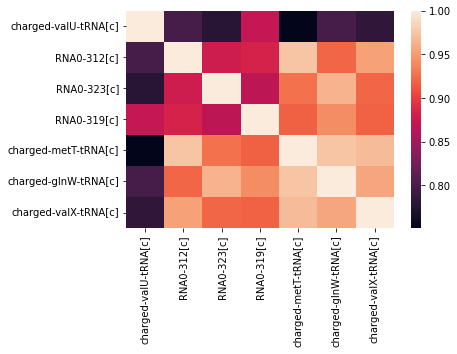

In [128]:
# calculate the correlation matrix
corr = Big_data_set.corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [131]:
Big_data_set = Big_data_set.iloc[[217,475,897,1259,274,12,210,763,1293,836]]
Big_data_set

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,G6567-MONOMER[c],EG10346-MONOMER[c],G6995-MONOMER[c],CPLX0-3501[c],CYTOCHROME-B561-MONOMER[i],CPLX-3942[c],GLUCDEHYDROG-MONOMER[m],CPLX0-8248[c],G378-MONOMER[c],RED-THIOREDOXIN2-MONOMER[c]
217,2001,2679,2321,7699,5009,3825,7442,5904,5707,2578,...,299,376,559,356,867,29,541,100,674,1137
475,1979,2775,2407,7996,5327,4120,7989,6317,6205,2680,...,573,371,495,497,1055,60,951,148,821,511
897,1968,2683,2168,7646,4862,3700,7446,5762,5463,2556,...,393,410,592,263,753,54,878,159,382,758
1259,2181,2907,2554,8409,5452,4111,8290,6566,6137,2960,...,430,500,600,159,1808,59,443,157,661,961
274,2057,2813,2404,7971,5095,3825,8058,6105,5795,2756,...,166,543,519,249,1421,36,294,96,638,1191
12,1968,2683,2168,7646,4862,3700,7446,5762,5463,2556,...,393,410,592,263,753,54,878,159,382,758
210,2131,2809,2478,8348,5352,4032,8083,6170,6005,2789,...,310,434,669,368,820,43,436,140,428,1115
763,2057,2813,2404,7971,5095,3825,8058,6105,5795,2756,...,166,543,519,249,1421,36,294,96,638,1191
1293,2158,2991,2498,8422,5486,4096,8375,6546,6257,2886,...,319,608,517,256,1141,47,522,220,507,578
836,2027,2796,2401,8121,5240,4053,8024,6158,5976,2730,...,226,406,810,164,1136,39,796,120,460,466


In [935]:
Big_data_set.sum(axis=1)

217     48635505323
475     53429095689
897     48813930226
1259    55502818070
274     53135586852
12      48813930226
210     52256242024
763     53135586852
1293    55107661285
836     52360178004
dtype: int64

In [138]:
Big_data_set.T.corr().abs()

,217,475,897,1259,274,12,210,763,1293,836
217,1.000000,0.998316,0.999451,0.998871,0.998213,0.999451,0.999019,0.998213,0.999191,0.999181
475,0.998316,1.000000,0.998527,0.998973,0.998716,0.998527,0.997235,0.998716,0.999131,0.999197
897,0.999451,0.998527,1.000000,0.998684,0.998681,1.000000,0.999231,0.998681,0.999185,0.999093
1259,0.998871,0.998973,0.998684,1.000000,0.998750,0.998684,0.998149,0.998750,0.999719,0.999312
274,0.998213,0.998716,0.998681,0.998750,1.000000,0.998681,0.997192,1.000000,0.999006,0.999505
12,0.999451,0.998527,1.000000,0.998684,0.998681,1.000000,0.999231,0.998681,0.999185,0.999093
210,0.999019,0.997235,0.999231,0.998149,0.997192,0.999231,1.000000,0.997192,0.998223,0.998001
763,0.998213,0.998716,0.998681,0.998750,1.000000,0.998681,0.997192,1.000000,0.999006,0.999505
1293,0.999191,0.999131,0.999185,0.999719,0.999006,0.999185,0.998223,0.999006,1.000000,0.999549
836,0.999181,0.999197,0.999093,0.999312,0.999505,0.999093,0.998001,0.999505,0.999549,1.000000


In [136]:
# Create correlation matrix
corr_matrix = Big_data_set.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] < 0.75)]

# Drop features 
Big_data_set.drop(to_drop, axis=1, inplace=True)

Big_data_set

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],charged-serV-tRNA[c],RNA0-323[c],RNA0-319[c],charged-glnV-tRNA[c],charged-metT-tRNA[c],charged-glnW-tRNA[c],charged-gltW-tRNA[c],charged-valX-tRNA[c],charged-metU-tRNA[c],charged-serU-tRNA[c],charged-valY-tRNA[c]
217,2001,2679,2321,7699,5009,7442,5904,6501,3252,10527,5800,5672,5389,6418,6299,6330
475,1979,2775,2407,7996,5327,7989,6317,6804,3584,10726,6044,6070,5749,6571,6435,6687
897,1968,2683,2168,7646,4862,7446,5762,6312,3270,10290,5679,5533,5258,6197,6114,6149
1259,2181,2907,2554,8409,5452,8290,6566,7106,3764,11359,6182,6292,6077,6950,7034,7093
274,2057,2813,2404,7971,5095,8058,6105,6833,3476,10786,6031,5885,5620,6431,6495,6829
12,1968,2683,2168,7646,4862,7446,5762,6312,3270,10290,5679,5533,5258,6197,6114,6149
210,2131,2809,2478,8348,5352,8083,6170,6737,3589,11309,6155,6114,5679,6799,6853,6606
763,2057,2813,2404,7971,5095,8058,6105,6833,3476,10786,6031,5885,5620,6431,6495,6829
1293,2158,2991,2498,8422,5486,8375,6546,7172,3767,11492,6271,6240,6114,7043,6949,7091
836,2027,2796,2401,8121,5240,8024,6158,6943,3499,10943,6086,6035,5728,6705,6592,6865


<AxesSubplot:>

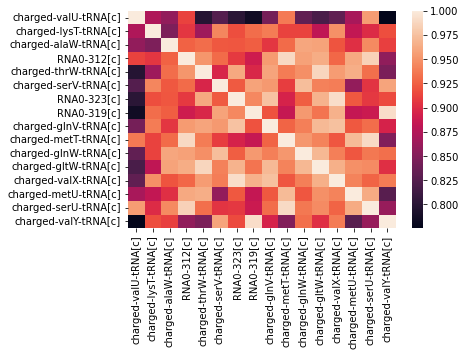

In [139]:
# calculate the correlation matrix
corr = Big_data_set.corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [67]:
#Instructions for building the 2-D plot displaying index numbers when cursor hovers over a data point
# When perplexity is set to 30
trace1 = go.Scatter(
                    x = tsne_embedding2["tsne1_2d"],
                    y = tsne_embedding2["tsne2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = tsne_embedding2.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [68]:
#Instructions for building the 2-D plot displaying index numbers when cursor hovers over a data point
# When perplexity is set to 100
trace1 = go.Scatter(
                    x = tsne_embedding3["tsne1_2d"],
                    y = tsne_embedding3["tsne2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = tsne_embedding3.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [69]:
#Instructions for building the 2-D plot displaying index numbers when cursor hovers over a data point
# When perplexity is set to 500
trace1 = go.Scatter(
                    x = tsne_embedding4["tsne1_2d"],
                    y = tsne_embedding4["tsne2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = tsne_embedding4.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [70]:
#Instructions for building the 2-D plot displaying index numbers when cursor hovers over a data point
# When perplexity is set to 1000
trace1 = go.Scatter(
                    x = tsne_embedding5["tsne1_2d"],
                    y = tsne_embedding5["tsne2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = tsne_embedding5.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [116]:
#UMAP n_neighbours = 15, min_dist = 0, 0.01, 0.05, 0.1, 0.5, 1


#UMAP n_neighbours = 30, min_dist = 0, 0.01, 0.05, 0.1, 0.5, 1

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=30,min_dist=0,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding7 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=30,min_dist=0.01,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding8 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=30,min_dist=0.05,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding9 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=30,min_dist=0.1,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding10 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=30,min_dist=0.5,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding11 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=30,min_dist=1,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding12 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()



#UMAP n_neighbours = 50, min_dist = 0, 0.01, 0.05, 0.1, 0.5, 1

# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=50,min_dist=0,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding13 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=50,min_dist=0.01,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding14 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=50,min_dist=0.05,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding15 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=50,min_dist=0.1,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding16 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=50,min_dist=0.5,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding17 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=50,min_dist=1,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding18 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")


#UMAP n_neighbours = 100, min_dist = 0, 0.01, 0.05, 0.1, 0.5, 1

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=100,min_dist=0,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding19 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=100,min_dist=0.01,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding20 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=100,min_dist=0.05,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding21 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=100,min_dist=0.1,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding22 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=100,min_dist=0.5,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding23 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=100,min_dist=1,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding24 = pd.DataFrame(mapper.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

Processed the UMAP algorithm in -28.5906 seconds
Processed the UMAP algorithm in -24.8686 seconds
Processed the UMAP algorithm in -26.1142 seconds
Processed the UMAP algorithm in -26.9832 seconds
Processed the UMAP algorithm in -26.1427 seconds
Processed the UMAP algorithm in -24.6386 seconds
Processed the UMAP algorithm in -25.4599 seconds
Processed the UMAP algorithm in -24.9616 seconds
Processed the UMAP algorithm in -24.5606 seconds
Processed the UMAP algorithm in -24.6882 seconds
Processed the UMAP algorithm in -24.9632 seconds
Processed the UMAP algorithm in -24.7294 seconds
Processed the UMAP algorithm in -24.9366 seconds
Processed the UMAP algorithm in -25.4593 seconds
Processed the UMAP algorithm in -26.1295 seconds
Processed the UMAP algorithm in -24.2717 seconds
Processed the UMAP algorithm in -25.7404 seconds
Processed the UMAP algorithm in -30.6272 seconds


In [117]:
# Label UMAP embeded data set
UMAP_embedding23.columns = ["tsne1_2d", "tsne2_2d"]

In [118]:
#Instructions for building the 2-D plot displaying index numbers when cursor hovers over a data point
# When n-neighbours = 100, min-dist = 0.5
trace1 = go.Scatter(
                    x = UMAP_embedding23["tsne1_2d"],
                    y = UMAP_embedding23["tsne2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = UMAP_embedding23.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [ ]:
Big_data_set = Big_data_set.iloc[[285,1474,1674,574]]
Big_data_set

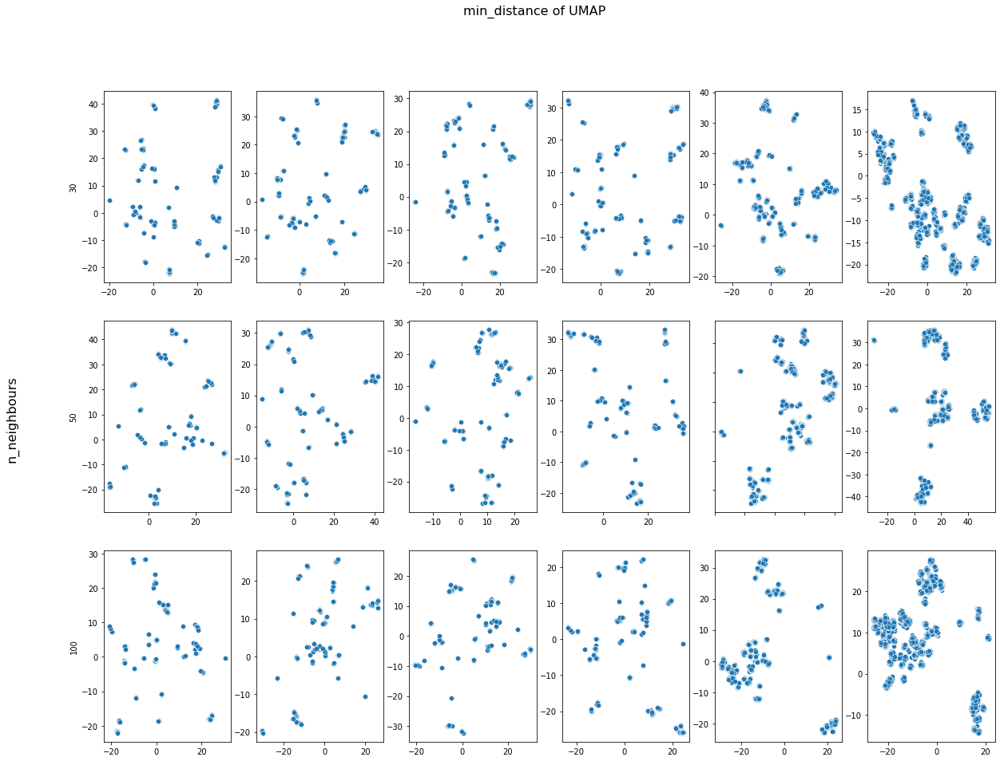

In [19]:
#plot scatterplots in 2D

import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(3, 6, figsize=(20, 15))
fig.suptitle('min_distance of UMAP', fontsize=16)
fig.text(0.04, 0.5, 'n_neighbours', va='center', rotation='vertical', fontsize = 16)





# UMAP_neighbour = 30 , min dist = 0
g7 = sns.scatterplot(ax=axes[0,0], x=UMAP_embedding7[:, 0], y=UMAP_embedding7[:, 1])
g7.set(ylabel = '30')

# UMAP_neighbour = 30 , min dist = 0.01
g8 = sns.scatterplot(ax=axes[0,1], x=UMAP_embedding8[:, 0], y=UMAP_embedding8[:, 1])

# UMAP_neighbour = 30 , min dist = 0.05
g9 = sns.scatterplot(ax=axes[0,2], x=UMAP_embedding9[:, 0], y=UMAP_embedding9[:, 1])


# UMAP_neighbour = 30 , min dist = 0.1
g10 = sns.scatterplot(ax=axes[0,3], x=UMAP_embedding10[:, 0], y=UMAP_embedding10[:, 1])


# UMAP_neighbour = 30 , min dist = 0.5
g11 = sns.scatterplot(ax=axes[0,4], x=UMAP_embedding11[:, 0], y=UMAP_embedding11[:, 1])

# UMAP_neighbour = 30 , min dist = 1
g12 = sns.scatterplot(ax=axes[0,5], x=UMAP_embedding12[:, 0], y=UMAP_embedding12[:, 1])


# UMAP_neighbour = 50 , min dist = 0
g13 = sns.scatterplot(ax=axes[1,0], x=UMAP_embedding13[:, 0], y=UMAP_embedding13[:, 1])
g13.set(ylabel = '50')

# UMAP_neighbour = 50 , min dist = 0.01
g14 = sns.scatterplot(ax=axes[1,1], x=UMAP_embedding14[:, 0], y=UMAP_embedding14[:, 1])


# UMAP_neighbour = 50 , min dist = 0.05
g15 = sns.scatterplot(ax=axes[1,2], x=UMAP_embedding15[:, 0], y=UMAP_embedding15[:, 1])


# UMAP_neighbour = 50 , min dist = 0.1
g16 = sns.scatterplot(ax=axes[1,3], x=UMAP_embedding16[:, 0], y=UMAP_embedding16[:, 1])


# UMAP_neighbour = 50 , min dist = 0.5
g17 = sns.scatterplot(ax=axes[1,4], x=UMAP_embedding17[:, 0], y=UMAP_embedding17[:, 1])
g17.set(xticklabels=[])
g17.set(yticklabels=[])

# UMAP_neighbour = 50 , min dist = 1
g18 = sns.scatterplot(ax=axes[1,5], x=UMAP_embedding18[:, 0], y=UMAP_embedding18[:, 1])




# UMAP_neighbour = 100 , min dist = 0
g19 = sns.scatterplot(ax=axes[2,0], x=UMAP_embedding19[:, 0], y=UMAP_embedding19[:, 1])
g19.set(ylabel = '100')

# UMAP_neighbour = 100 , min dist = 0.01
g20 = sns.scatterplot(ax=axes[2,1], x=UMAP_embedding20[:, 0], y=UMAP_embedding20[:, 1])

# UMAP_neighbour = 100 , min dist = 0.05
g21 = sns.scatterplot(ax=axes[2,2], x=UMAP_embedding21[:, 0], y=UMAP_embedding21[:, 1])

# UMAP_neighbour = 100 , min dist = 0.1
g22 = sns.scatterplot(ax=axes[2,3], x=UMAP_embedding22[:, 0], y=UMAP_embedding22[:, 1])


# UMAP_neighbour = 100 , min dist = 0.5
g23 = sns.scatterplot(ax=axes[2,4], x=UMAP_embedding23[:, 0], y=UMAP_embedding23[:, 1])


# UMAP_neighbour = 100 , min dist = 1
g24 = sns.scatterplot(ax=axes[2,5], x=UMAP_embedding24[:, 0], y=UMAP_embedding24[:, 1])


plt.show()


In [43]:
start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding1 = TSNE(n_components=2, perplexity=5.0, n_iter=1000, verbose=1).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding2 = TSNE(n_components=2, perplexity=30.0, n_iter=1000, verbose=1).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding3 = TSNE(n_components=2, perplexity=100.0, n_iter=1000, verbose=1).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding4 = TSNE(n_components=2, perplexity=500.0, n_iter=1000, verbose=1).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding5 = TSNE(n_components=2, perplexity=1000.0, n_iter=1000, verbose=1).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.008s...
[t-SNE] Computed neighbors for 2070 samples in 0.210s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.455727
[t-SNE] KL divergence after 1000 iterations: 0.324349
Processed the t-SNE algorithm in -10.9287 seconds
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.003s...


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 2070 samples in 0.233s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 25.625626
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.558792
[t-SNE] KL divergence after 1000 iterations: 0.203157
Processed the t-SNE algorithm in -11.4180 seconds
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.003s...


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 2070 samples in 0.279s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 27.438504
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.341690
[t-SNE] KL divergence after 1000 iterations: -0.163296
Processed the t-SNE algorithm in -17.1316 seconds
[t-SNE] Computing 1501 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.002s...


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 2070 samples in 0.485s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 26.560997
[t-SNE] KL divergence after 250 iterations with early exaggeration: 46.558617
[t-SNE] KL divergence after 1000 iterations: 0.352116
Processed the t-SNE algorithm in -42.4392 seconds
[t-SNE] Computing 2069 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.002s...


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 2070 samples in 0.645s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 28.372992
[t-SNE] KL divergence after 250 iterations with early exaggeration: 38.126377
[t-SNE] KL divergence after 1000 iterations: 0.100121
Processed the t-SNE algorithm in -77.4167 seconds


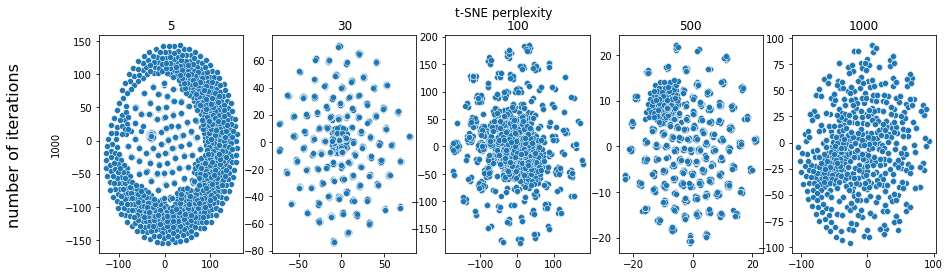

In [44]:
import seaborn as sns

fig, axes = plt.subplots(1, 5, figsize=(15, 4))
fig.suptitle('t-SNE perplexity')
fig.text(0.04, 0.5, 'number of iterations', va='center', rotation='vertical', fontsize = 16)

# t-SNE perplexity = 5
g1 = sns.scatterplot(ax=axes[0], x=tsne_embedding1[:, 0], y=tsne_embedding1[:, 1])
axes[0].set_title('5')
g1.set(ylabel = '1000')


# t-SNE perplexity = 15
g2 = sns.scatterplot(ax=axes[1], x=tsne_embedding2[:, 0], y=tsne_embedding2[:, 1])
axes[1].set_title('30')

# t-SNE perplexity = 30
g3 = sns.scatterplot(ax=axes[2], x=tsne_embedding3[:, 0], y=tsne_embedding3[:, 1])
axes[2].set_title('100')

# t-SNE perplexity = 50
g4 = sns.scatterplot(ax=axes[3], x=tsne_embedding4[:, 0], y=tsne_embedding4[:, 1])
axes[3].set_title('500')

# t-SNE perplexity = 100
g5 = sns.scatterplot(ax=axes[4], x=tsne_embedding5[:, 0], y=tsne_embedding5[:, 1])
axes[4].set_title('1000')

plt.show()

In [24]:
#Embed standardisation in 2D using Laplacian Eigenmap 

start = time.perf_counter()
# Generate Spec embedding
K = 2
spec = SpectralEmbedding(n_components=K)
spec_embedding = spec.fit_transform(standardised_data)

end = time.perf_counter()
print(f"Processed the Spectral algorithm in {start-end:0.4f} seconds")

Processed the Spectral algorithm in -0.7779 seconds


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


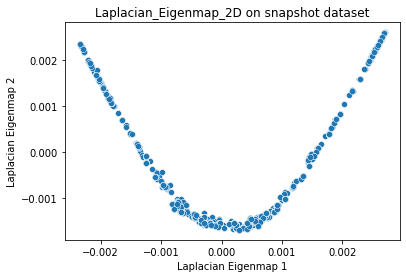

In [25]:
#Plot Laplacian Eigenmap 2D scatterplot

import seaborn as sns

sns.scatterplot(spec_embedding[:, 0], spec_embedding[:, 1])
plt.xlabel('Laplacian Eigenmap 1')
plt.ylabel('Laplacian Eigenmap 2')
plt.title('Laplacian_Eigenmap_2D on snapshot dataset')
plt.show()

In [862]:
start = time.perf_counter()
# Generate Spec embedding
K = 2
spec = SpectralEmbedding(n_components=K)
spec_embedding = pd.DataFrame(spec.fit_transform(standardised_data))

end = time.perf_counter()
print(f"Processed the Spectral algorithm in {start-end:0.4f} seconds")

Processed the Spectral algorithm in -0.8863 seconds


In [863]:
# Label Laplacian Eigenmap columns
spec_embedding.columns = ["Laplace1_2d", "Laplace2_2d"]

In [864]:
#Instructions for building the 2-D plot displaying index numbers when cursor hovers over a data point

trace1 = go.Scatter(
                    x = spec_embedding["Laplace1_2d"],
                    y = spec_embedding["Laplace2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = spec_embedding.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [951]:
Big_data_set = Big_data_set.iloc[[1977,2064,2020,386,1507,1932,78,2050,429,40,1990,458,2019,2069]]
Big_data_set

IndexError: positional indexers are out-of-bounds

In [895]:
Big_data_set3 = Big_data_set.loc[:, (Big_data_set > 1000).any()]
Big_data_set3

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,EG10611-MONOMER[c],G7513-MONOMER[c],MONOMER0-4235[c],EG10856-MONOMER[p],G6337-MONOMER[c],G6995-MONOMER[c],CYTOCHROME-B561-MONOMER[i],GLUCDEHYDROG-MONOMER[m],G378-MONOMER[c],RED-THIOREDOXIN2-MONOMER[c]
1977,1778,2394,2059,6833,4460,3509,6941,5404,5077,2308,...,840,870,572,735,1086,430,992,658,388,1172
2064,1907,2491,2197,7263,4703,3664,7234,5580,5330,2523,...,1176,747,1124,1099,1002,659,1427,462,385,681
2020,1770,2438,2141,7209,4641,3550,7168,5479,5149,2390,...,612,838,1347,894,730,598,1738,856,395,1012
386,1825,2432,2124,7385,4718,3582,7297,5508,5231,2547,...,754,760,1458,965,1151,378,900,568,591,967
1507,2094,2733,2428,7922,5270,3964,7903,6148,5962,2769,...,975,1461,885,921,747,818,1216,683,554,941
1932,2032,2787,2471,7965,5211,4024,7985,6055,5907,2830,...,857,1401,1066,1574,1076,518,1403,548,995,743
78,2054,2833,2396,8016,5176,3902,8020,6060,5998,2788,...,736,821,1171,866,811,699,1441,554,619,442
2050,2123,2900,2610,8363,5395,4235,8282,6428,6319,2883,...,789,1046,1090,1209,1185,837,1838,657,1017,969
429,2066,2690,2451,7965,5117,3975,7962,6082,5949,2797,...,1353,1600,1402,1090,1071,526,1884,820,639,502
40,2076,2783,2409,8014,5137,3930,8113,6136,5941,2848,...,1071,971,946,928,945,968,1341,517,405,761


In [899]:
Newset = Big_data_set3.reindex(var2.sort_values(ascending=False).index, axis=1)
Big_data_set3 = Newset.iloc[:, : 10]
Big_data_set3

,WATER[c],K+[c],glycogen-monomer[c],CPD-12819[c],PUTRESCINE[c],GLT[c],GLUTATHIONE[c],CPD-8260[c],ATP[c],FRUCTOSE-16-DIPHOSPHATE[c]
1977,43850749581,99282233,67740955,43035189,15587214,16422187,12065016,10327533,9879771,6538636
2064,45665066202,103390017,70543725,44815762,16232132,15853253,12564203,10754833,10288544,6809171
2020,46387363459,105025365,71659534,45524625,16488880,16646688,12762935,10924945,10451281,6916874
386,46755501157,105858864,72228236,45885916,16619738,15643326,12864223,11011647,10534224,6971767
1507,52344596828,118513104,80862311,51371063,18606441,17372310,14401997,12327967,11793472,7805164
1932,52324904535,118468519,80831891,51351737,18599442,18173058,14396580,12323328,11789036,7802228
78,51968735588,117662118,80281679,51002192,18472838,17889766,14298583,12239445,11708789,7749119
2050,53336037134,120757818,82393896,52344064,18958859,17684696,14674781,12561466,12016848,7952999
429,52939111393,119859141,81780722,51954520,18817768,19222245,14565570,12467983,11927419,7893813
40,52360482224,118549070,80886852,51386652,18612088,16975522,14406368,12331707,11797051,7807533


In [900]:
Big_data_set3.sum(axis=1)

1977    44131628315
2064    45956317842
2020    46683764586
386     47053119098
1507    52677650657
1932    52658640354
78      52300040117
2050    53675382561
429     53277600574
40      52693235067
1990    59656101097
458     59484777011
2019    58336294104
2069    59239230041
dtype: int64

In [125]:
# Test dimension reduction on the high coefficient of covariance data set

Big_data_set = pd.read_csv('r\home\bonsai\wholecell3\cvhighdataset.csv')
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,EG10686-MONOMER[i],EG12391-MONOMER[c],GUANYL-KIN-MONOMER[c],G7694-MONOMER[m],EG11134-MONOMER[c],EG11426-MONOMER[c],EG11768-MONOMER[c],G7452-MONOMER[c],CREC-MONOMER[i],EG10564-MONOMER[c]
0,0,0,0,0,0,0,8,0,0,0,...,1,1,2,32,2,20,38,3,0,1
1,0,0,0,0,0,0,0,0,0,0,...,1,2,1,25,5,20,36,0,1,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,28,1,41,58,1,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,30,1,19,41,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,1,107,3,59,19,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2065,0,0,0,0,0,0,0,0,0,0,...,1,1,1,204,3,18,28,1,0,1
2066,0,0,0,0,0,0,0,0,0,0,...,0,2,1,28,1,34,32,3,0,1
2067,0,0,0,0,0,0,0,0,0,0,...,1,0,0,24,1,33,60,1,1,0
2068,0,0,0,0,0,0,0,0,0,0,...,1,1,2,22,1,22,27,1,1,1


In [126]:
Big_data_set = Big_data_set.iloc[:, : 1752]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,G6116-MONOMER[c],EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i]
0,0,0,0,0,0,0,8,0,0,0,...,37,0,2,11,0,0,113,0,39,1
1,0,0,0,0,0,0,0,0,0,0,...,39,0,1,14,1,0,93,0,39,1
2,0,0,0,0,0,0,0,0,0,0,...,176,0,1,13,0,1,55,1,41,0
3,0,0,0,0,0,0,0,0,0,0,...,64,0,1,11,0,0,29,1,36,0
4,0,0,0,0,0,0,0,0,0,0,...,28,0,0,1,1,1,30,0,43,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2065,0,0,0,0,0,0,0,0,0,0,...,40,0,0,0,1,0,65,0,287,1
2066,0,0,0,0,0,0,0,0,0,0,...,61,1,2,11,0,1,32,0,39,0
2067,0,0,0,0,0,0,0,0,0,0,...,31,1,1,11,0,0,123,2,45,1
2068,0,0,0,0,0,0,0,0,0,0,...,46,1,0,11,1,0,23,0,78,1


<AxesSubplot:>

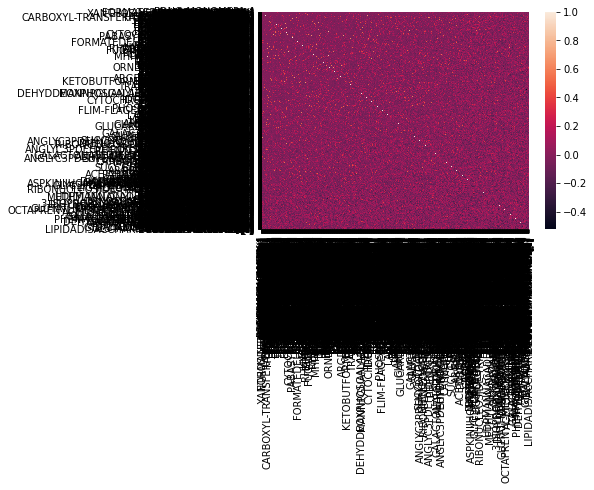

In [14]:
# calculate the correlation matrix
corr = Big_data_set.corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

<AxesSubplot:>

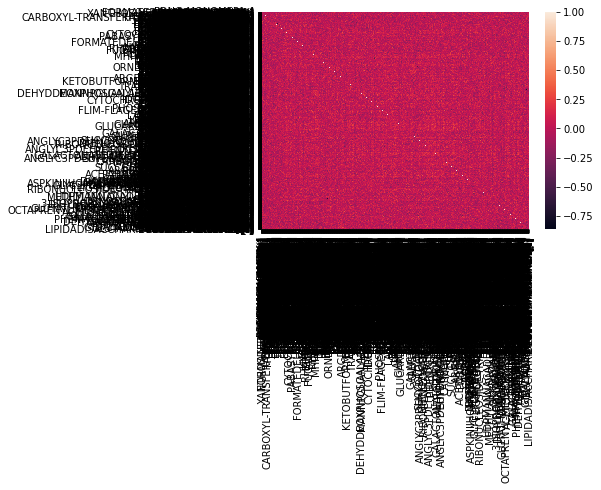

In [15]:
# calculate the correlation matrix
corr = Big_data_set.corr(method = 'spearman')

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [19]:
mean2 = Big_data_set.mean(axis=0)
mean2.sort_values(ascending=True).astype('int')

FORMATEDEHYDROGN-CPLX[i]       0
FDNG-MONOMER[p]                0
MONOMER0-5[i]                  0
E1O[c]                         0
PHOR-CPLX[c]                   0
                            ... 
RRSA-RRNA[c]                 561
EG10871-MONOMER[c]           562
EG10909-MONOMER[c]           953
CPLX0-3955[c]               1400
EG10467-MONOMER[c]          1771
Length: 1752, dtype: int64

In [87]:
from sklearn.preprocessing import StandardScaler
standardised_data = StandardScaler().fit_transform(Big_data_set)
standardised_data

array([[-2.19846601e-02, -2.19846601e-02, -2.19846601e-02, ...,
        -9.99898302e-01, -5.01306136e-01,  9.84717570e-01],
       [-2.19846601e-02, -2.19846601e-02, -2.19846601e-02, ...,
        -9.99898302e-01, -5.01306136e-01,  9.84717570e-01],
       [-2.19846601e-02, -2.19846601e-02, -2.19846601e-02, ...,
         8.59750831e-01, -4.75731184e-01, -1.00005884e+00],
       ...,
       [-2.19846601e-02, -2.19846601e-02, -2.19846601e-02, ...,
         2.71939996e+00, -4.24581278e-01,  9.84717570e-01],
       [-2.19846601e-02, -2.19846601e-02, -2.19846601e-02, ...,
        -9.99898302e-01, -2.59456041e-03,  9.84717570e-01],
       [-2.19846601e-02, -2.19846601e-02, -2.19846601e-02, ...,
        -9.99898302e-01, -3.73431373e-01,  9.84717570e-01]])

In [67]:
from sklearn.decomposition import PCA, FastICA
from sklearn import manifold
import matplotlib.ticker as mticker
import umap
from sklearn.manifold import TSNE
from sklearn.manifold import SpectralEmbedding

import time

start = time.perf_counter()
# Generate PCA embedding
K = 2
pca = PCA(n_components = K) # keep the first K components
pca.fit(standardised_data)
pca_embedding = pca.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the PCA algorithm in {start-end:0.4f} seconds")

print(pca_embedding)

Processed the PCA algorithm in -0.3487 seconds
[[  0.24883327  -0.89168025]
 [-11.91437901  -5.29031863]
 [  1.5138665    4.92672557]
 ...
 [ -1.64397749  -2.42455096]
 [ -0.92762602  -2.09653234]
 [  2.2989528    2.96394763]]


In [69]:
from sklearn.decomposition import PCA, FastICA
from sklearn import manifold
import matplotlib.ticker as mticker
import umap
from sklearn.manifold import TSNE
from sklearn.manifold import SpectralEmbedding

import time

start = time.perf_counter()
# Generate PCA embedding
K = 2
pca = PCA(n_components = K) # keep the first K components
pca.fit(standardised_data)
pca_embedding = pd.DataFrame(pca.transform(standardised_data))

end = time.perf_counter()
print(f"Processed the PCA algorithm in {start-end:0.4f} seconds")

pca_embedding

Processed the PCA algorithm in -0.5011 seconds


,0,1
0,-0.068726,3.492151
1,-8.814706,-8.478607
2,0.725635,-2.780196
3,-3.231340,3.198939
4,-5.573603,-0.463963
...,...,...
2065,-1.154635,-1.794780
2066,4.020689,3.890312
2067,-0.997857,-0.098113
2068,-1.668241,1.858825


In [23]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [24]:
pca_embedding

array([[  1.08805333,   0.65120341],
       [-16.43117747,   4.56415646],
       [  1.14200849,  -1.38876101],
       ...,
       [  0.34815885,   3.69691839],
       [ -1.14437447,  -0.5058152 ],
       [ -5.04127091, -11.90934603]])

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



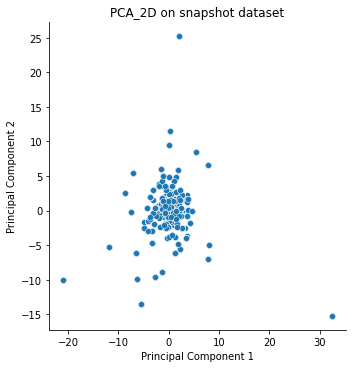

In [68]:
import seaborn as sns

sns.relplot(pca_embedding[:, 0], pca_embedding[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA_2D on snapshot dataset')
plt.show()

In [70]:
pca_embedding.columns = ["PC1_2d", "PC2_2d"]

In [71]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = pca_embedding["PC1_2d"],
                    y = pca_embedding["PC2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = pca_embedding.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using PCA"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [94]:
Big_data_set_pca = pca_embedding.iloc[[1991,399,1492,466,453,2036,1707,874,1907,2020,459,421,1970,993,401,428
                                      ,1981, 2016, 1971]]
Big_data_set_pca

,PC1_2d,PC2_2d
1991,1.469389,-0.889282
399,-0.481443,-0.727987
1492,0.690309,-0.269588
466,-0.231736,0.979310
453,0.928116,-1.479304
2036,0.537649,-0.147500
1707,-0.147739,-0.152587
874,0.462632,-0.862447
1907,-1.624745,-2.477994
2020,2.143299,-0.630832


In [95]:
Big_data_set = Big_data_set.iloc[[1991,399,1492,466,453,2036,1707,874,1907,2020,459,421,1970,993,401,428,1981, 2016, 1971]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,G6116-MONOMER[c],EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i]
1991,0,0,0,0,0,0,0,0,0,0,...,45,1,0,0,0,1,41,1,54,0
399,0,0,0,0,0,0,0,0,0,0,...,36,0,2,0,2,1,73,1,33,1
1492,0,0,0,0,0,0,0,0,0,0,...,52,0,0,12,0,0,24,0,81,0
466,0,0,0,0,0,0,0,0,0,0,...,40,0,2,12,1,1,178,1,48,0
453,0,0,0,0,0,0,0,0,0,0,...,32,0,1,0,1,0,28,0,45,1
2036,0,0,0,0,0,0,0,0,0,0,...,319,1,1,11,1,0,46,0,389,0
1707,0,0,0,0,0,0,0,0,0,0,...,37,1,1,0,1,1,50,1,45,0
874,0,0,0,0,0,0,0,0,0,0,...,39,1,1,12,1,0,22,0,43,0
1907,0,0,0,0,0,0,0,0,0,0,...,36,0,1,11,0,0,49,1,43,1
2020,0,0,0,0,0,0,0,0,0,0,...,45,1,1,12,0,1,34,1,53,1


In [73]:
# Create correlation matrix
corr_matrix = Big_data_set.T.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] < 0.06)]

# Drop features 
#Data_set7.drop(to_drop, axis=1, inplace=True)

#Data_set7

to_drop

[421, 401, 1981, 2016, 1971]

In [96]:
Big_data_set3 = Big_data_set.loc[:, (Big_data_set > 100).any()]
Big_data_set3

,EG11952-MONOMER[m],HYCC-MONOMER[i],EG11072-MONOMER[c],B2771-MONOMER[i],polymerized_ATP[c],EG11646-MONOMER[c],polymerized_GTP[c],DMSA-MONOMER[i],YTFT-MONOMER[i],CELB-MONOMER[i],...,G6498-MONOMER[c],G6301-MONOMER[p],G7573-MONOMER[c],GLUTAMIDOTRANS-MONOMER[c],XYLG-MONOMER[m],G6148-MONOMER[c],G7538-MONOMER[m],G6116-MONOMER[c],ARAH-MONOMER[i],G6112-MONOMER[c]
1991,0,2,66,2,0,180,0,0,0,0,...,33,30,21,358,24,30,15,45,41,54
399,0,0,0,2,1011,0,873,0,0,0,...,25,13,23,310,53,115,14,36,73,33
1492,0,3,0,2,0,3,0,0,0,0,...,92,85,24,72,30,43,35,52,24,81
466,2,0,0,389,125,2,129,0,0,0,...,28,20,15,0,54,28,36,40,178,48
453,0,0,0,4,0,2,0,0,0,0,...,23,16,22,2,16,38,50,32,28,45
2036,1,0,0,3,530,2,590,0,0,0,...,143,39,18,371,10,38,124,319,46,389
1707,0,1,0,1,0,1,0,0,5,0,...,23,29,28,57,21,37,32,37,50,45
874,0,3,0,4,0,1,0,0,0,0,...,20,22,20,24,14,37,29,39,22,43
1907,0,1,0,0,0,1,0,0,5,0,...,21,27,27,255,146,37,32,36,49,43
2020,0,3,0,1,0,3,0,1,2,0,...,16,23,19,247,21,138,107,45,34,53


In [19]:
mean2 = Big_data_set3.mean(axis=0)
mean2.sort_values(ascending=True).astype('int')

YNJC-MONOMER[m]          5
NRFC-MONOMER[c]          6
CPLX0-7530[m]            6
YTFT-MONOMER[i]          7
EG11474-MONOMER[c]       7
                      ... 
RRSA-RRNA[c]           693
EG10871-MONOMER[c]     743
EG10909-MONOMER[c]     846
CPLX0-3955[c]         1404
EG10467-MONOMER[c]    2296
Length: 611, dtype: int64

In [97]:
var2 = Big_data_set3.var(axis=0)
var2.sort_values(ascending=True).head(50)

EG11662-MONOMER[c]            407.029240
G6161-MONOMER[l]              457.497076
EG11301-MONOMER[c]            473.321637
G7317-MONOMER[c]              481.134503
PD00222[c]                    482.374269
EG11613-MONOMER[i]            489.251462
G6147-MONOMER[c]              492.385965
G7549-MONOMER[i]              495.257310
G6651-MONOMER[c]              497.807018
EG12359-MONOMER[e]            507.988304
CPLX-153[i]                   514.479532
YJGT-MONOMER[i]               516.175439
YEEO-MONOMER[i]               531.146199
EG11474-MONOMER[c]            533.222222
G7420-MONOMER[c]              534.245614
GKI-MONOMER[c]                542.450292
G6963-MONOMER[c]              546.356725
SUCCGLUDESUCC-MONOMER[c]      552.333333
G7588-MONOMER[i]              561.374269
G6670-MONOMER[c]              562.064327
EG11594-MONOMER[c]            569.315789
EG11804-MONOMER[c]            569.812865
EG12016-MONOMER[i]            572.099415
SUCCGLUALDDEHYD-MONOMER[c]    575.163743
G6795-MONOMER[m]

In [59]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [98]:
Newset = Big_data_set3.reindex(var2.sort_values(ascending=False).index, axis=1)
Data_set3 = Newset.iloc[:,:]
Data_set3

,EG10467-MONOMER[c],CPLX0-3955[c],EG10909-MONOMER[c],RRLA-RRNA[c],RRSA-RRNA[c],EG10871-MONOMER[c],EG10666-MONOMER[c],MANY-MONOMER[i],FLIM-FLAGELLAR-C-RING-SWITCH[i],RPOB-MONOMER[c],...,EG12359-MONOMER[e],G6651-MONOMER[c],G7549-MONOMER[i],G6147-MONOMER[c],EG11613-MONOMER[i],PD00222[c],G7317-MONOMER[c],EG11301-MONOMER[c],G6161-MONOMER[l],EG11662-MONOMER[c]
1991,1469,1,573,1524,7,732,2,153,21,834,...,4,9,7,29,6,6,15,12,49,22
399,3074,3936,3052,13,1888,18,0,3,28,571,...,2,18,8,24,3,10,12,15,15,13
1492,1409,0,16,14,748,1235,208,139,27,3,...,4,5,9,30,4,11,14,33,27,16
466,9001,4941,2255,13,389,14,0,998,5,883,...,3,5,105,41,3,11,11,10,17,24
453,6714,3551,789,445,1040,26,1,3,21,2,...,0,5,5,24,7,14,10,25,22,20
2036,1492,2361,2667,217,1291,13,0,436,20,2,...,1,6,10,31,6,50,10,42,17,15
1707,1855,1,126,4,2,86,0,37,13,0,...,4,9,11,27,7,13,10,17,29,18
874,1106,89,173,0,9,0,0,54,0,21,...,3,4,11,28,9,9,13,18,14,13
1907,143,0,16,12,259,1237,665,84,10,3,...,4,104,11,26,6,12,10,19,29,17
2020,4886,0,1607,893,15,2385,2,4,19,962,...,0,4,8,86,2,14,9,12,18,16


In [90]:
PCAData_set3 = Data_set3[['RRLA-RRNA[c]',
 'RRSA-RRNA[c]',
 'G7647-MONOMER[c]',
 'UGPE-MONOMER[i]',
 'G6838-MONOMER[c]',
 'NIKD-MONOMER[m]',
 'G7575-MONOMER[c]',
 'NIRC-MONOMER[i]',
 'EG11995-MONOMER[i]',
 'MELB-MONOMER[i]',
 'B0270-MONOMER[i]',
 'G7535-MONOMER[m]',
 'G6498-MONOMER[c]',
 'EG13236-MONOMER[c]',
 'G6945-MONOMER[i]',
 'EG11131-MONOMER[c]',
 'SAPB-MONOMER[i]',
 'MHPF-MONOMER[c]',
 'PSTC-MONOMER[i]',
 'G7923-MONOMER[c]',
 'G7889-MONOMER[i]',
 'G7495-MONOMER[m]',
 'MALG-MONOMER[m]',
 'EG11300-MONOMER[c]',
 'G7946-MONOMER[i]',
 'PD00436[i]',
 'B1828-MONOMER[i]',
 'EG11757-MONOMER[c]',
 'LACTALDREDUCT-CPLX[c]',
 'EG11950-MONOMER[i]',
 'G8210-MONOMER[m]',
 'HCAT-MONOMER[i]',
 'EG11741-MONOMER[c]',
 'G6143-MONOMER[c]',
 'EG12240-MONOMER[i]',
 'EG10825-MONOMER[c]',
 'G6427-MONOMER[c]',
 'CPLX0-7530[m]',
 'GLTS-MONOMER[i]',
 'G7828-MONOMER[c]']]
PCAData_set3

,RRLA-RRNA[c],RRSA-RRNA[c],G7647-MONOMER[c],UGPE-MONOMER[i],G6838-MONOMER[c],NIKD-MONOMER[m],G7575-MONOMER[c],NIRC-MONOMER[i],EG11995-MONOMER[i],MELB-MONOMER[i],B0270-MONOMER[i],G7535-MONOMER[m],G6498-MONOMER[c],EG13236-MONOMER[c],G6945-MONOMER[i],EG11131-MONOMER[c],SAPB-MONOMER[i],MHPF-MONOMER[c],PSTC-MONOMER[i],G7923-MONOMER[c],G7889-MONOMER[i],G7495-MONOMER[m],MALG-MONOMER[m],EG11300-MONOMER[c],G7946-MONOMER[i],PD00436[i],B1828-MONOMER[i],EG11757-MONOMER[c],LACTALDREDUCT-CPLX[c],EG11950-MONOMER[i],G8210-MONOMER[m],HCAT-MONOMER[i],EG11741-MONOMER[c],G6143-MONOMER[c],EG12240-MONOMER[i],EG10825-MONOMER[c],G6427-MONOMER[c],CPLX0-7530[m],GLTS-MONOMER[i],G7828-MONOMER[c]
1991,1524,7,27,0,12,5,7,11,17,24,8,23,33,54,22,4,9,72,15,17,56,5,7,7,30,16,17,0,7,6,6,13,3,20,6,16,7,1,19,29
399,13,1888,21,35,14,6,46,12,11,150,9,39,25,33,25,63,29,14,13,7,85,7,7,120,22,14,8,0,7,9,0,51,3,10,1,24,6,0,24,79
1492,14,748,25,2,17,9,12,16,24,43,14,33,92,7,22,0,12,15,27,23,48,5,17,3,23,14,12,0,9,10,81,16,1,16,0,7,7,2,56,46
466,13,389,22,10,20,3,10,10,11,26,178,15,28,7,22,0,11,9,11,11,17,1,11,3,65,16,11,73,4,8,21,48,2,13,0,5,5,1,17,18
453,445,1040,336,11,11,133,9,8,11,153,5,13,23,13,29,67,8,12,0,6,22,6,0,3,34,18,11,0,8,9,3,10,2,20,0,0,5,2,21,20
2036,217,1291,25,5,11,8,4,9,62,28,7,19,143,9,20,8,58,4,0,11,76,4,10,4,17,15,12,0,8,7,10,12,4,66,0,0,3,0,21,22
1707,4,2,21,13,12,4,12,11,10,32,7,24,23,3,22,0,11,10,0,19,0,8,8,5,14,14,13,0,7,9,0,12,0,24,0,18,6,0,20,27
874,0,9,21,3,12,5,13,13,10,25,5,26,20,4,24,1,0,9,9,14,41,4,15,5,18,11,12,0,5,7,8,8,3,12,0,11,8,1,18,19
1907,12,259,18,7,12,4,84,10,10,40,6,23,21,2,22,88,0,9,19,108,0,7,8,5,14,12,13,1,7,7,0,12,0,24,0,18,6,0,20,26
2020,893,15,266,5,13,4,5,10,15,28,8,12,16,7,28,27,0,9,0,8,4,45,5,5,20,15,41,0,6,7,5,10,3,94,3,26,9,0,18,18


In [97]:
PCAData_set3.sum(axis=1)

1991     2162
399      2930
1492     1528
466      1145
453      2527
2036     2230
1707      425
874       429
1907      934
2020     1703
459      1553
421       645
1970     1220
993       513
401      2740
428      3531
1981    14668
2016      888
1971      554
dtype: int64

In [92]:
PCA2Data_set3 = Data_set3[['charged-trpT-tRNA[c]',
 'EG11171-MONOMER[c]',
 'FEPG-MONOMER[i]',
 'FEPD-MONOMER[i]',
 'FECD-MONOMER[i]',
 'YCFV-MONOMER[i]',
 'MGLC-MONOMER[i]',
 'G6826-MONOMER[c]',
 'G6684-MONOMER[c]',
 'EG11072-MONOMER[c]',
 'G6654-MONOMER[c]',
 'G6788-MONOMER[p]',
 'G7096-MONOMER[c]',
 'G7577-MONOMER[i]',
 'G7526-MONOMER[c]',
 'YJCQ-MONOMER[i]',
 'GLUCARDEHYDRA-MONOMER[c]',
 'G7367-MONOMER[c]',
 'EG11711-MONOMER[c]',
 'G7860-MONOMER[c]',
 'G7589-MONOMER[c]',
 'MALX-MONOMER[i]',
 'HYCC-MONOMER[i]',
 'EG10090-MONOMER[c]',
 'G6579-MONOMER[i]',
 'G7911-MONOMER[p]',
 'EG11099-MONOMER[c]',
 'XAPB-MONOMER[m]',
 'EG11208-MONOMER[c]',
 'EG10085-MONOMER[c]',
 'TAUA-MONOMER[p]',
 'G7095-MONOMER[c]',
 'NARH-MONOMER[i]',
 'G7100-MONOMER[c]',
 'YIDY-MONOMER[i]',
 'PD00345[i]',
 'B2077-MONOMER[i]',
 'G6356-MONOMER[i]',
 'G7361-MONOMER[c]',
 'G6963-MONOMER[c]',
 'EG11662-MONOMER[c]']]
PCA2Data_set3

,charged-trpT-tRNA[c],EG11171-MONOMER[c],FEPG-MONOMER[i],FEPD-MONOMER[i],FECD-MONOMER[i],YCFV-MONOMER[i],MGLC-MONOMER[i],G6826-MONOMER[c],G6684-MONOMER[c],EG11072-MONOMER[c],G6654-MONOMER[c],G6788-MONOMER[p],G7096-MONOMER[c],G7577-MONOMER[i],G7526-MONOMER[c],YJCQ-MONOMER[i],GLUCARDEHYDRA-MONOMER[c],G7367-MONOMER[c],EG11711-MONOMER[c],G7860-MONOMER[c],G7589-MONOMER[c],MALX-MONOMER[i],HYCC-MONOMER[i],EG10090-MONOMER[c],G6579-MONOMER[i],G7911-MONOMER[p],EG11099-MONOMER[c],XAPB-MONOMER[m],EG11208-MONOMER[c],EG10085-MONOMER[c],TAUA-MONOMER[p],G7095-MONOMER[c],NARH-MONOMER[i],G7100-MONOMER[c],YIDY-MONOMER[i],PD00345[i],B2077-MONOMER[i],G6356-MONOMER[i],G7361-MONOMER[c],G6963-MONOMER[c],EG11662-MONOMER[c]
1991,25,0,0,10,0,98,1,5,7,66,6,39,23,4,7,2,16,9,6,17,3,19,2,6,18,16,33,12,24,113,6,11,4,2,11,17,12,13,10,10,22
399,45,0,0,269,0,233,86,265,3,0,8,20,8,37,4,3,20,16,5,165,6,15,0,103,13,18,14,7,20,12,3,5,5,7,5,13,8,10,3,9,13
1492,32,68,0,103,0,58,0,5,3,0,4,29,10,2,6,1,26,10,13,19,7,85,3,9,42,28,50,19,44,31,18,15,1,5,8,21,12,18,6,9,16
466,36,0,18,8,0,166,49,9,6,0,3,18,6,4,3,3,17,5,6,10,8,44,0,4,14,27,10,13,16,12,0,8,24,55,87,17,14,11,2,26,24
453,36,574,6,0,0,20,1,2,5,0,86,143,10,1,8,3,27,10,4,12,11,19,0,4,40,26,19,10,17,23,108,8,1,2,7,21,13,16,60,6,20
2036,33,1,38,7,0,158,141,9,2,0,10,77,10,5,7,6,15,7,3,15,11,10,0,1,16,61,18,11,11,15,4,8,7,3,18,14,11,12,4,20,15
1707,29,0,6,29,0,59,5,6,3,0,6,27,14,2,5,8,20,7,11,14,11,13,1,6,14,19,14,10,18,29,8,10,1,1,8,20,17,15,6,10,18
874,65,0,0,60,25,68,2,5,6,0,3,20,10,4,6,8,19,5,2,24,6,18,3,8,24,23,13,7,23,24,9,11,0,3,11,22,17,17,9,12,13
1907,32,0,233,0,0,127,1,6,3,0,5,91,12,2,5,6,20,7,11,12,9,13,1,6,14,19,14,10,17,27,6,10,1,1,7,20,17,14,6,10,17
2020,32,305,381,0,73,1,1,7,3,0,8,18,12,3,7,3,18,10,10,3,62,14,3,5,43,22,19,12,12,11,5,8,66,6,10,23,9,15,2,12,16


In [98]:
PCA2Data_set3.sum(axis=1)

1991      705
399      1476
1492      836
466       783
453      1379
2036      814
1707      500
874       605
1907      812
2020     1270
459       697
421      1187
1970     1077
993       835
401       844
428      1547
1981      791
2016     1004
1971    10578
dtype: int64

In [94]:
PCA3Data_set3 = Data_set3[['LARGEILVB-MONOMER[c]',
 'PHET-MONOMER[c]',
 'G7686-MONOMER[m]',
 'G7245-MONOMER[c]',
 'OPPB-MONOMER[i]',
 'MONOMER0-4447[c]',
 'G7488-MONOMER[c]',
 'EG10312-MONOMER[c]',
 'G6485-MONOMER[e]',
 'MONOMER0-2748[c]',
 'G6181-MONOMER[c]',
 'YHJX-MONOMER[i]',
 'EG12106-MONOMER[c]',
 'EG11462-MONOMER[m]',
 'EG12370-MONOMER[c]',
 'EG11838-MONOMER[c]',
 'EG12134-MONOMER[i]',
 'G6816-MONOMER[c]',
 'CPLX0-7720[i]',
 'GUTA-MONOMER[i]',
 'G7419-MONOMER[c]',
 'NANK-MONOMER[c]',
 'EG11644-MONOMER[p]',
 'B2845-MONOMER[i]',
 'EG11938-MONOMER[i]',
 'B0427-MONOMER[i]',
 'B1006-MONOMER[i]',
 'G6712-MONOMER[c]',
 'G7145-MONOMER[c]',
 'GLTK-MONOMER[i]',
 'YDEZ-MONOMER[i]',
 'B2-CPLX[c]',
 'G6177-MONOMER[c]',
 'YEHW-MONOMER[i]',
 'G7379-MONOMER[c]',
 'ACRB-MONOMER[p]',
 'G6118-MONOMER[c]',
 'MONOMER0-2691[i]',
 'ARYLSULFAT-MONOMER[p]',
 'HISM-MONOMER[i]',
 'EG11156-MONOMER[m]',
 'G6175-MONOMER[c]',
 'G7545-MONOMER[m]',
 'G6127-MONOMER[c]',
 'MONOMER0-2121[c]',
 'G7104-MONOMER[c]',
 'EG12220-MONOMER[i]',
 'PHNK-MONOMER[c]',
 'TTDB-MONOMER[c]',
 'YEIM-MONOMER[i]',
 'CYTOCHROMEC552-MONOMER[p]',
 'G6156-MONOMER[c]',
 'YDDS-MONOMER[p]',
 'YNJC-MONOMER[m]',
 'G6961-MONOMER[c]',
 'EG11804-MONOMER[c]',
 'EG12359-MONOMER[e]',
 'G6161-MONOMER[l]']]
PCA3Data_set3

,LARGEILVB-MONOMER[c],PHET-MONOMER[c],G7686-MONOMER[m],G7245-MONOMER[c],OPPB-MONOMER[i],MONOMER0-4447[c],G7488-MONOMER[c],EG10312-MONOMER[c],G6485-MONOMER[e],MONOMER0-2748[c],G6181-MONOMER[c],YHJX-MONOMER[i],EG12106-MONOMER[c],EG11462-MONOMER[m],EG12370-MONOMER[c],EG11838-MONOMER[c],EG12134-MONOMER[i],G6816-MONOMER[c],CPLX0-7720[i],GUTA-MONOMER[i],G7419-MONOMER[c],NANK-MONOMER[c],EG11644-MONOMER[p],B2845-MONOMER[i],EG11938-MONOMER[i],B0427-MONOMER[i],B1006-MONOMER[i],G6712-MONOMER[c],G7145-MONOMER[c],GLTK-MONOMER[i],YDEZ-MONOMER[i],B2-CPLX[c],G6177-MONOMER[c],YEHW-MONOMER[i],G7379-MONOMER[c],ACRB-MONOMER[p],G6118-MONOMER[c],MONOMER0-2691[i],ARYLSULFAT-MONOMER[p],HISM-MONOMER[i],EG11156-MONOMER[m],G6175-MONOMER[c],G7545-MONOMER[m],G6127-MONOMER[c],MONOMER0-2121[c],G7104-MONOMER[c],EG12220-MONOMER[i],PHNK-MONOMER[c],TTDB-MONOMER[c],YEIM-MONOMER[i],CYTOCHROMEC552-MONOMER[p],G6156-MONOMER[c],YDDS-MONOMER[p],YNJC-MONOMER[m],G6961-MONOMER[c],EG11804-MONOMER[c],EG12359-MONOMER[e],G6161-MONOMER[l]
1991,1,3,22,71,1,12,19,13,36,18,99,10,22,14,26,148,29,8,25,0,15,23,19,16,18,15,21,5,1,24,9,0,16,30,6,1,31,22,18,0,10,9,1,19,0,6,73,3,9,20,13,0,4,0,6,14,4,49
399,0,1,28,28,0,57,87,10,8,50,257,2,13,9,41,58,28,10,20,1,11,13,23,7,96,17,16,6,1,0,1,0,19,101,5,2,34,17,10,40,6,63,5,14,0,2,22,1,1,11,6,0,8,0,5,34,2,15
1492,1,1,12,40,34,18,21,30,64,29,41,11,32,118,12,24,29,19,15,3,13,27,30,12,27,24,16,7,0,0,4,0,21,19,9,1,35,23,10,1,8,11,7,18,92,6,33,2,0,16,8,5,10,0,7,28,4,27
466,102,367,24,188,1,11,19,17,11,12,102,55,21,7,165,137,15,14,18,24,16,14,14,107,22,34,16,4,4,0,2,0,105,33,5,13,92,15,16,0,7,6,7,20,1,7,67,6,1,13,10,7,11,0,2,14,3,17
453,1,0,22,101,0,13,14,10,23,23,30,8,28,9,27,61,18,16,21,8,13,19,30,7,26,17,15,5,0,0,6,0,18,93,3,109,48,18,31,0,11,8,8,17,10,6,23,2,1,11,0,0,1,1,7,36,0,22
2036,3,3,13,32,160,13,221,17,13,89,55,12,22,14,18,49,9,6,24,7,15,121,21,7,23,104,18,6,72,72,9,0,12,9,3,1,24,30,6,0,12,10,0,18,0,9,26,1,3,13,13,2,14,0,58,20,1,17
1707,4,65,34,37,43,13,13,18,17,26,43,14,17,16,23,23,22,11,20,6,12,25,34,17,18,17,17,9,2,6,0,0,20,12,11,2,33,27,15,0,15,9,4,15,5,16,36,3,1,10,15,0,7,0,5,34,4,29
874,1,1,22,32,49,17,14,11,15,26,37,12,18,13,25,17,17,16,29,3,12,18,43,14,18,13,10,6,1,0,6,0,25,10,4,9,22,19,11,0,12,13,3,18,1,9,27,2,2,7,2,0,10,0,5,18,3,14
1907,71,0,32,164,199,12,13,17,17,25,42,105,16,15,45,23,49,11,20,6,12,45,32,17,16,16,17,8,143,28,0,0,20,8,10,79,30,27,15,1,31,9,4,12,5,46,35,3,0,97,13,0,6,0,5,57,4,29
2020,320,1,24,35,57,6,12,11,42,72,42,8,20,11,17,20,19,7,25,0,138,29,24,13,23,10,89,10,0,0,0,0,13,19,5,20,89,19,15,16,6,9,0,14,2,7,18,2,1,15,1,0,5,0,6,20,0,18


In [ ]:
PCA5Data_set3 = Data_set3[['RRLA-RRNA[c]',
 'RRSA-RRNA[c]',
 'G7647-MONOMER[c]',
 'UGPE-MONOMER[i]',
 'G6838-MONOMER[c]',
 'NIKD-MONOMER[m]',
 'G7575-MONOMER[c]',
 'NIRC-MONOMER[i]',
 'EG11995-MONOMER[i]',
 'MELB-MONOMER[i]',
 'B0270-MONOMER[i]',
 'G7535-MONOMER[m]',
 'G6498-MONOMER[c]',
 'EG13236-MONOMER[c]',
 'G6945-MONOMER[i]',
 'EG11131-MONOMER[c]',
 'SAPB-MONOMER[i]',
 'MHPF-MONOMER[c]',
 'PSTC-MONOMER[i]',
 'G7923-MONOMER[c]',
 'G7889-MONOMER[i]',
 'G7495-MONOMER[m]',
 'MALG-MONOMER[m]',
 'EG11300-MONOMER[c]',
 'G7946-MONOMER[i]',
 'PD00436[i]',
 'B1828-MONOMER[i]',
 'EG11757-MONOMER[c]',
 'LACTALDREDUCT-CPLX[c]',
 'EG11950-MONOMER[i]',
 'G8210-MONOMER[m]',
 'HCAT-MONOMER[i]',
 'EG11741-MONOMER[c]',
 'G6143-MONOMER[c]',
 'EG12240-MONOMER[i]',
 'EG10825-MONOMER[c]',
 'G6427-MONOMER[c]',
 'CPLX0-7530[m]',
 'GLTS-MONOMER[i]',
 'G7828-MONOMER[c]']]
PCA5Data_set3

In [99]:
PCA3Data_set3.sum(axis=1)

1991     1107
399      1322
1492     1115
466      2021
453      1055
2036     1550
1707      950
874       762
1907     1762
2020     1405
459      2479
421      1583
1970     1764
993      1064
401      1869
428      2298
1981     1781
2016    12997
1971     1486
dtype: int64

In [96]:
PCA4Data_set3 = Data_set3[['EG10467-MONOMER[c]',
 'B2771-MONOMER[i]',
 'G7555-MONOMER[c]',
 'FUCP-MONOMER[i]',
 'G7094-MONOMER[c]',
 'G7434-MONOMER[c]',
 'G7131-MONOMER[c]',
 'G6351-MONOMER[e]',
 'G7929-MONOMER[i]',
 'EG11498-MONOMER[c]',
 'EG12694-MONOMER[c]',
 'B2098-MONOMER[i]',
 'YCBE-MONOMER[i]',
 'KDUD-MONOMER[c]',
 'G7059-MONOMER[p]',
 'G7307-MONOMER[i]',
 'G6384-MONOMER[i]',
 'G6597-MONOMER[p]',
 'EG12246-MONOMER[c]',
 'G7205-MONOMER[l]',
 'G6129-MONOMER[c]',
 'G7919-MONOMER[p]',
 'EG12237-MONOMER[c]',
 'G6195-MONOMER[c]',
 'G6200-MONOMER[c]',
 'MONOMER0-4443[c]',
 'DIENOYLCOAREDUCT-MONOMER[c]',
 'G6121-MONOMER[c]',
 'G6798-MONOMER[c]',
 'EG10813-MONOMER[c]',
 'G6180-MONOMER[i]',
 'G6510-MONOMER[c]',
 'G6191-MONOMER[c]',
 'MHPT-MONOMER[i]',
 'G6518-MONOMER[c]',
 'EG11445-MONOMER[i]',
 'G7328-MONOMER[m]',
 'G6434-MONOMER[i]',
 'G7634-MONOMER[i]',
 'G7415-MONOMER[c]',
 'EG11691-MONOMER[i]',
 'SUCCGLUDESUCC-MONOMER[c]',
 'EG11474-MONOMER[c]',
 'G7549-MONOMER[i]']]
PCA4Data_set3

,EG10467-MONOMER[c],B2771-MONOMER[i],G7555-MONOMER[c],FUCP-MONOMER[i],G7094-MONOMER[c],G7434-MONOMER[c],G7131-MONOMER[c],G6351-MONOMER[e],G7929-MONOMER[i],EG11498-MONOMER[c],EG12694-MONOMER[c],B2098-MONOMER[i],YCBE-MONOMER[i],KDUD-MONOMER[c],G7059-MONOMER[p],G7307-MONOMER[i],G6384-MONOMER[i],G6597-MONOMER[p],EG12246-MONOMER[c],G7205-MONOMER[l],G6129-MONOMER[c],G7919-MONOMER[p],EG12237-MONOMER[c],G6195-MONOMER[c],G6200-MONOMER[c],MONOMER0-4443[c],DIENOYLCOAREDUCT-MONOMER[c],G6121-MONOMER[c],G6798-MONOMER[c],EG10813-MONOMER[c],G6180-MONOMER[i],G6510-MONOMER[c],G6191-MONOMER[c],MHPT-MONOMER[i],G6518-MONOMER[c],EG11445-MONOMER[i],G7328-MONOMER[m],G6434-MONOMER[i],G7634-MONOMER[i],G7415-MONOMER[c],EG11691-MONOMER[i],SUCCGLUDESUCC-MONOMER[c],EG11474-MONOMER[c],G7549-MONOMER[i]
1991,1469,2,9,2,19,8,31,75,24,80,35,21,19,26,31,12,137,4,17,49,51,105,31,81,1,13,12,17,23,3,6,100,1,5,12,6,8,24,9,5,1,8,0,7
399,3074,2,19,5,26,11,35,11,18,44,8,15,217,24,149,9,58,2,13,18,121,15,19,108,1,7,8,10,12,2,83,12,2,14,8,15,7,28,5,11,3,9,0,8
1492,1409,2,20,0,19,11,39,16,25,18,18,21,23,31,34,10,34,8,104,51,32,13,28,17,6,60,13,21,21,4,2,20,3,17,12,83,5,30,7,63,4,19,0,9
466,9001,389,375,357,398,373,367,291,337,327,246,258,231,280,205,245,239,224,222,214,196,174,167,116,172,135,151,165,122,146,133,117,135,133,104,110,126,137,119,108,110,109,101,105
453,6714,4,45,162,22,10,31,22,51,19,11,14,27,16,25,8,88,9,43,9,29,5,42,11,5,19,98,24,17,3,2,56,1,9,18,8,6,72,2,7,4,32,2,5
2036,1492,3,101,1,40,12,44,13,23,128,234,18,20,21,0,7,24,1,21,10,68,12,11,26,5,14,9,19,72,10,3,12,1,14,12,7,1,26,3,8,3,36,0,10
1707,1855,1,19,2,13,12,38,19,24,20,16,14,20,30,13,10,32,5,27,5,19,16,25,19,3,16,15,28,18,3,6,11,2,13,10,16,4,29,12,11,1,12,0,11
874,1106,4,16,12,8,14,28,18,15,13,23,9,22,13,1,13,32,2,30,28,30,17,24,8,4,16,16,29,16,13,7,19,1,15,14,11,5,27,3,9,2,12,0,11
1907,143,0,18,2,13,12,45,18,23,18,13,91,20,29,13,10,31,5,25,3,19,15,24,19,2,16,13,78,54,3,6,11,2,13,9,15,4,28,12,11,1,11,0,11
2020,4886,1,11,3,28,9,28,17,19,15,16,15,17,31,10,8,25,1,21,14,85,13,130,11,2,16,4,19,14,5,1,11,1,66,84,9,8,22,7,14,2,8,0,8


In [100]:
PCA4Data_set3.sum(axis=1)

1991     2599
399      4266
1492     2382
466     17770
453      7807
2036     2595
1707     2475
874      1716
1907      909
2020     5715
459      3855
421      1563
1970     1265
993       756
401      2196
428       850
1981     8016
2016      718
1971      998
dtype: int64

In [104]:
PCA5Data_set3 = Data_set3[['CPLX0-3955[c]',
 'FLIM-FLAGELLAR-C-RING-SWITCH[i]',
 'EG11656-MONOMER[c]',
 'PHES-MONOMER[c]',
 'GLUTAMIDOTRANS-MONOMER[c]',
 'G6909-MONOMER[c]',
 'NUOF-MONOMER[i]',
 'PHNL-MONOMER[i]',
 'G7275-MONOMER[c]',
 'MONOMER0-153[m]',
 'YJHB-MONOMER[i]',
 'EG12799-MONOMER[i]',
 'DPPC-MONOMER[i]',
 'OPPC-MONOMER[i]',
 'YDDO-MONOMER[m]',
 'ARAH-MONOMER[i]',
 'B1599-MONOMER[i]',
 'G6126-MONOMER[i]',
 'EXUT-MONOMER[i]',
 'YEJB-MONOMER[i]',
 'EG11956-MONOMER[c]',
 'G6163-MONOMER[c]',
 'MONOMER0-2819[c]',
 'G7082-MONOMER[c]',
 'MONOMER0-2670[c]',
 'G7239-MONOMER[i]',
 'HISQ-MONOMER[i]',
 'MONOMER0-4249[c]',
 'G7917-MONOMER[c]',
 'CPLX-155[i]',
 'RBSA-MONOMER[m]',
 'CELB-MONOMER[i]',
 'YCEE-MONOMER[m]',
 'EG12258-MONOMER[e]',
 'CPLX0-8173[c]',
 'G6331-MONOMER[c]',
 'EG12173-MONOMER[m]',
 'DEHYDDEOXGALACTKIN-MONOMER[c]',
 'G7101-MONOMER[i]',
 'YCJO-MONOMER[i]',
 'G6536-MONOMER[i]',
 'EG10827-MONOMER[c]',
 'YTFT-MONOMER[i]',
 'NIKB-MONOMER[i]']]
PCA5Data_set3

,CPLX0-3955[c],FLIM-FLAGELLAR-C-RING-SWITCH[i],EG11656-MONOMER[c],PHES-MONOMER[c],GLUTAMIDOTRANS-MONOMER[c],G6909-MONOMER[c],NUOF-MONOMER[i],PHNL-MONOMER[i],G7275-MONOMER[c],MONOMER0-153[m],...,CPLX0-8173[c],G6331-MONOMER[c],EG12173-MONOMER[m],DEHYDDEOXGALACTKIN-MONOMER[c],G7101-MONOMER[i],YCJO-MONOMER[i],G6536-MONOMER[i],EG10827-MONOMER[c],YTFT-MONOMER[i],NIKB-MONOMER[i]
1991,1,21,341,275,358,182,0,16,2,4,...,10,9,84,23,8,2,0,15,0,1
399,3936,28,6,705,310,0,0,16,3,2,...,6,7,10,22,70,3,0,66,0,2
1492,0,27,1,383,72,59,18,19,11,131,...,13,11,12,23,3,5,2,10,0,6
466,4941,5,8,3,0,0,179,8,4,2,...,84,5,81,14,30,3,2,42,0,2
453,3551,21,1,398,2,41,0,174,9,1,...,18,7,24,81,1,4,2,18,0,3
2036,2361,20,12,313,371,46,260,12,8,5,...,53,2,14,20,29,4,2,8,0,5
1707,1,13,6,1,57,25,27,17,1,7,...,8,6,12,19,5,0,0,13,5,6
874,89,0,1,21,24,48,28,18,7,7,...,17,18,20,26,6,2,1,7,0,3
1907,0,10,1,259,255,26,69,17,1,6,...,32,6,9,19,5,0,0,13,5,6
2020,0,19,28,79,247,0,0,12,9,0,...,10,9,49,29,4,3,0,14,2,3


In [105]:
PCA5Data_set3.sum(axis=1)

1991     2475
399      5822
1492     1260
466      6134
453      5083
2036     4504
1707      617
874       663
1907     1386
2020     1043
459       818
421      5495
1970     1262
993       602
401     17233
428      1296
1981     3149
2016     1056
1971     1310
dtype: int64

In [63]:
print(Data_set3.columns.values.tolist())

['EG10467-MONOMER[c]', 'CPLX0-3955[c]', 'EG10909-MONOMER[c]', 'RRLA-RRNA[c]', 'RRSA-RRNA[c]', 'EG10871-MONOMER[c]', 'EG10666-MONOMER[c]', 'MANY-MONOMER[i]', 'FLIM-FLAGELLAR-C-RING-SWITCH[i]', 'RPOB-MONOMER[c]', 'G7657-MONOMER[c]', 'FLIG-FLAGELLAR-SWITCH-PROTEIN[i]', 'EG11656-MONOMER[c]', 'EG11892-MONOMER[c]', 'polymerized_ATP[c]', 'charged-trpT-tRNA[c]', 'polymerized_GTP[c]', 'PHES-MONOMER[c]', 'polymerized_CTP[c]', 'EG10125-MONOMER[c]', 'LARGEILVB-MONOMER[c]', 'EG10320-MONOMER[c]', 'EG11171-MONOMER[c]', 'polymerized_UTP[c]', 'MANZ-MONOMER[i]', 'EG10600-MONOMER[c]', 'EG10436-MONOMER[c]', 'RPOC-MONOMER[c]', 'E2P-MONOMER[c]', 'G6991-MONOMER[c]', 'CARBPSYN-LARGE[c]', 'G7647-MONOMER[c]', 'PHET-MONOMER[c]', 'FEPG-MONOMER[i]', 'GLUTAMIDOTRANS-MONOMER[c]', 'FEPC-MONOMER[i]', 'GLYS-MONOMER[c]', 'ANGLYC3PDEHYDROGSUBUNITB-MONOMER[c]', 'SMALLILVN-MONOMER[c]', 'G7686-MONOMER[m]', 'EG10314-MONOMER[l]', 'PABASYN-COMPI-MONOMER[c]', 'EG10435-MONOMER[i]', 'FEPD-MONOMER[i]', 'ANGLYC3PDEHYDROGSUBUNITA-MO

In [99]:
# find the column name of maximum
# values in every row
maxValueIndex = Data_set3.idxmax(axis = 0)
maxValueIndex

EG10467-MONOMER[c]     466
CPLX0-3955[c]          401
EG10909-MONOMER[c]     399
RRLA-RRNA[c]          1981
RRSA-RRNA[c]          1981
                      ... 
PD00222[c]             421
G7317-MONOMER[c]       459
EG11301-MONOMER[c]     428
G6161-MONOMER[l]      2016
EG11662-MONOMER[c]    1971
Length: 611, dtype: int64

In [100]:
maxpca = pd.DataFrame(maxValueIndex)
maxpca.columns = ['Column'] 
bulkmolecules = ['EG10467-MONOMER[c]', 'CPLX0-3955[c]', 'EG10909-MONOMER[c]', 'RRLA-RRNA[c]', 'RRSA-RRNA[c]', 'EG10871-MONOMER[c]', 'EG10666-MONOMER[c]', 'MANY-MONOMER[i]', 'FLIM-FLAGELLAR-C-RING-SWITCH[i]', 'RPOB-MONOMER[c]', 'G7657-MONOMER[c]', 'FLIG-FLAGELLAR-SWITCH-PROTEIN[i]', 'EG11656-MONOMER[c]', 'EG11892-MONOMER[c]', 'polymerized_ATP[c]', 'charged-trpT-tRNA[c]', 'polymerized_GTP[c]', 'PHES-MONOMER[c]', 'polymerized_CTP[c]', 'EG10125-MONOMER[c]', 'LARGEILVB-MONOMER[c]', 'EG10320-MONOMER[c]', 'EG11171-MONOMER[c]', 'polymerized_UTP[c]', 'MANZ-MONOMER[i]', 'EG10600-MONOMER[c]', 'EG10436-MONOMER[c]', 'RPOC-MONOMER[c]', 'E2P-MONOMER[c]', 'G6991-MONOMER[c]', 'CARBPSYN-LARGE[c]', 'G7647-MONOMER[c]', 'PHET-MONOMER[c]', 'FEPG-MONOMER[i]', 'GLUTAMIDOTRANS-MONOMER[c]', 'FEPC-MONOMER[i]', 'GLYS-MONOMER[c]', 'ANGLYC3PDEHYDROGSUBUNITB-MONOMER[c]', 'SMALLILVN-MONOMER[c]', 'G7686-MONOMER[m]', 'EG10314-MONOMER[l]', 'PABASYN-COMPI-MONOMER[c]', 'EG10435-MONOMER[i]', 'FEPD-MONOMER[i]', 'ANGLYC3PDEHYDROGSUBUNITA-MONOMER[c]', 'G7602-MONOMER[c]', 'G6908-MONOMER[c]', 'G7245-MONOMER[c]', 'G6665-MONOMER[p]', 'G6116-MONOMER[c]', 'EG11703-MONOMER[p]', 'MALK-MONOMER[m]', 'EG10724-MONOMER[c]', 'MONOMER0-4248[c]', 'G6909-MONOMER[c]', 'EG11222-MONOMER[c]', 'OPPB-MONOMER[i]', 'EG12138-MONOMER[i]', 'MONOMER0-4447[c]', 'FECD-MONOMER[i]', 'EG10315-MONOMER[l]', 'CPLX0-2401[c]', 'G7488-MONOMER[c]', 'EG10312-MONOMER[c]', 'NUOF-MONOMER[i]', 'YNJD-MONOMER[i]', 'G7371-MONOMER[i]', 'YCFV-MONOMER[i]', 'MGLC-MONOMER[i]', 'B2771-MONOMER[i]', 'PHNL-MONOMER[i]', 'G7555-MONOMER[c]', 'FUCP-MONOMER[i]', 'G6691-MONOMER[c]', 'G7094-MONOMER[c]', 'G7275-MONOMER[c]', 'G7620-MONOMER[c]', 'RPOA-MONOMER[m]', 'G6826-MONOMER[c]', 'G6485-MONOMER[e]', 'G6112-MONOMER[c]', 'CPLX0-8181[c]', 'EG11832-MONOMER[i]', 'G6684-MONOMER[c]', 'MONOMER0-153[m]', 'G6693-MONOMER[c]', 'G6415-MONOMER[p]', 'G7434-MONOMER[c]', 'UGPE-MONOMER[i]', 'G6087-MONOMER[i]', 'MONOMER0-2748[c]', 'MONOMER0-4225[c]', 'FECE-MONOMER[i]', 'G6840-MONOMER[i]', 'DMSA-MONOMER[i]', 'G6181-MONOMER[c]', 'POTH-MONOMER[i]', 'CYCLASE-MONOMER[c]', 'G7131-MONOMER[c]', 'YHJX-MONOMER[i]', 'EG11124-MONOMER[o]', 'YJHF-MONOMER[i]', 'EG11822-MONOMER[c]', 'GNTP-MONOMER[i]', 'YJHB-MONOMER[i]', 'EG11072-MONOMER[c]', 'G6352-MONOMER[c]', 'LIVH-MONOMER[i]', 'CELC-MONOMER[c]', 'G7868-MONOMER[c]', 'ANGLYC3PDEHYDROGSUBUNITC-MONOMER[i]', 'G6838-MONOMER[c]', 'EG12171-MONOMER[c]', 'MONOMER0-561[i]', 'G6351-MONOMER[e]', 'ASPCARBREG-DIMER[c]', 'G7929-MONOMER[i]', 'B1600-MONOMER[i]', 'EG11498-MONOMER[c]', 'NIKD-MONOMER[m]', 'YTFR-MONOMER[m]', 'EG12106-MONOMER[c]', 'MONOMER0-2662[c]', 'EG10313-MONOMER[l]', 'EG12374-MONOMER[c]', 'G6654-MONOMER[c]', 'PD00519[c]', 'EG12799-MONOMER[i]', 'G7722-MONOMER[m]', 'G7223-MONOMER[c]', 'G6738-MONOMER[c]', 'POTI-MONOMER[i]', 'EG11141-MONOMER[m]', 'EG12694-MONOMER[c]', 'G6685-MONOMER[c]', 'EG12154-MONOMER[i]', 'GABP-MONOMER[i]', 'G7921-MONOMER[o]', 'EG11207-MONOMER[c]', 'G7851-MONOMER[p]', 'YEHY-MONOMER[i]', 'EG11522-MONOMER[i]', 'XYLF-MONOMER[p]', 'G6853-MONOMER[c]', 'G6788-MONOMER[p]', 'EG11694-MONOMER[c]', 'G7096-MONOMER[c]', 'EG11094-MONOMER[c]', 'G7706-MONOMER[m]', 'B1433-MONOMER[i]', 'G6946-MONOMER[c]', 'G7575-MONOMER[c]', 'EG10459-MONOMER[c]', 'EG11462-MONOMER[m]', 'B2098-MONOMER[i]', 'G7577-MONOMER[i]', 'NIRC-MONOMER[i]', 'GUTB-MONOMER[c]', 'YCBE-MONOMER[i]', 'DPPC-MONOMER[i]', 'EG12370-MONOMER[c]', 'EG11057-MONOMER[c]', 'AKBLIG-CPLX[c]', 'G7526-MONOMER[c]', 'G7329-MONOMER[c]', 'EG11995-MONOMER[i]', 'OPPC-MONOMER[i]', 'YEJA-MONOMER[p]', 'G7213-MONOMER[c]', 'LIVM-MONOMER[i]', 'G6483-MONOMER[e]', 'B2740-MONOMER[i]', 'YDDO-MONOMER[m]', 'B2975-MONOMER[i]', 'YJCQ-MONOMER[i]', 'EG11848-MONOMER[c]', 'G7930-MONOMER[i]', 'EG11267-MONOMER[i]', 'YDHC-MONOMER[i]', 'MELB-MONOMER[i]', 'B0270-MONOMER[i]', 'PHENYLPRODIOXY-MONOMER[c]', 'EG11838-MONOMER[c]', 'KDUD-MONOMER[c]', 'G7277-MONOMER[c]', 'G7059-MONOMER[p]', 'G6504-MONOMER[m]', 'G6697-MONOMER[c]', 'B1634-MONOMER[i]', 'ARAH-MONOMER[i]', 'G6627-MONOMER[c]', 'G7535-MONOMER[m]', 'YDDQ-MONOMER[i]', 'G7861-MONOMER[p]', 'G6498-MONOMER[c]', 'DEHYDDEOXPHOSGALACT-ALDOL-MONOMER[c]', 'EG11912-MONOMER[i]', 'YHDZ-MONOMER[i]', 'EG11250-MONOMER[c]', 'G6591-MONOMER[c]', 'G7869-MONOMER[c]', 'G6899-MONOMER[p]', 'EG12134-MONOMER[i]', 'G7689-MONOMER[c]', 'FUM-MEMB2[i]', 'GLUCARDEHYDRA-MONOMER[c]', 'G7206-MONOMER[e]', 'ARGSUCCTRAN-MONOMER[c]', 'YPHC-MONOMER[c]', 'EG10737-MONOMER[c]', 'G7547-MONOMER[c]', 'G7308-MONOMER[c]', 'PD00361[c]', 'G6816-MONOMER[c]', 'G7274-MONOMER[c]', 'CPLX0-7720[i]', 'YRBE-MONOMER[i]', 'EG12335-MONOMER[c]', 'B1599-MONOMER[i]', 'G7307-MONOMER[i]', 'MONOMER0-144[i]', 'EG12308-MONOMER[c]', 'G6126-MONOMER[i]', 'G6646-MONOMER[c]', 'G7838-MONOMER[c]', 'GUTA-MONOMER[i]', 'YJFT-MONOMER[c]', 'YNEA-MONOMER[p]', 'G6677-MONOMER[c]', 'EG12180-MONOMER[o]', 'EG13236-MONOMER[c]', 'G7419-MONOMER[c]', 'G7367-MONOMER[c]', 'G6384-MONOMER[i]', 'NANK-MONOMER[c]', 'ARAG-MONOMER[c]', 'EG11644-MONOMER[p]', 'EG12023-MONOMER[i]', 'MONOMER0-2851[c]', 'NUOJ-MONOMER[i]', 'G6900-MONOMER[c]', 'EG11525-MONOMER[c]', 'EG11711-MONOMER[c]', 'YIDT-MONOMER[i]', 'G7860-MONOMER[c]', 'B2845-MONOMER[i]', 'G7884-MONOMER[c]', 'YDCS-MONOMER[p]', 'EXUT-MONOMER[i]', 'G6597-MONOMER[p]', 'EG12634-MONOMER[c]', 'G7589-MONOMER[c]', 'G7703-MONOMER[m]', 'G7260-MONOMER[c]', 'MALX-MONOMER[i]', 'G6607-MONOMER[c]', 'EG10443-MONOMER[c]', 'G7622-MONOMER[c]', 'EG11938-MONOMER[i]', 'EG12357-MONOMER[i]', 'EG11186-MONOMER[i]', 'HYCF-MONOMER[m]', 'G6945-MONOMER[i]', 'G6585-MONOMER[c]', 'YEJB-MONOMER[i]', 'G7418-MONOMER[m]', 'G6503-MONOMER[c]', 'G7711-MONOMER[i]', 'G6193-MONOMER[i]', 'G6953-MONOMER[i]', 'EG11956-MONOMER[c]', 'EG11131-MONOMER[c]', 'YDCU-MONOMER[m]', 'EG12337-MONOMER[m]', 'YJCX-MONOMER[p]', 'B0427-MONOMER[i]', 'LACY-MONOMER[m]', 'B1006-MONOMER[i]', 'G6712-MONOMER[c]', 'G7145-MONOMER[c]', 'HYCC-MONOMER[i]', 'EG12259-MONOMER[i]', 'G7670-MONOMER[m]', 'EG12246-MONOMER[c]', 'EG12113-MONOMER[m]', 'G7494-MONOMER[c]', 'EG12195-MONOMER[c]', 'SAPB-MONOMER[i]', 'G7205-MONOMER[l]', 'G7084-MONOMER[c]', 'MHPF-MONOMER[c]', 'DSDX-MONOMER[i]', 'G6163-MONOMER[c]', 'MONOMER0-2819[c]', 'GLTK-MONOMER[i]', 'YJFF-MONOMER[i]', 'G6437-MONOMER[p]', 'G7074-MONOMER[c]', 'G6825-MONOMER[c]', 'G6374-MONOMER[i]', 'G7082-MONOMER[c]', 'YDEZ-MONOMER[i]', 'SAPC-MONOMER[i]', 'G6129-MONOMER[c]', 'G7081-MONOMER[i]', 'EG10090-MONOMER[c]', 'EG12326-MONOMER[l]', 'PHENPRODIOLDEHYDROG-MONOMER[c]', 'MONOMER0-2689[m]', 'G7636-MONOMER[c]', 'G6467-MONOMER[c]', 'MONOMER0-2678[c]', 'B2-CPLX[c]', 'YJDL-MONOMER[i]', 'G7229-MONOMER[c]', 'MONOMER0-2670[c]', 'FTSX-MONOMER[o]', 'G7405-MONOMER[m]', 'CYST-MONOMER[i]', 'G7919-MONOMER[p]', 'G6579-MONOMER[i]', 'G7567-MONOMER[m]', 'CPLX0-7950[c]', 'G7239-MONOMER[i]', 'G6177-MONOMER[c]', 'G6480-MONOMER[l]', 'EG11063-MONOMER[c]', 'G7605-MONOMER[m]', 'UGPC-MONOMER[i]', 'G6148-MONOMER[c]', 'PSTC-MONOMER[i]', 'CPLX0-7444[c]', 'G7923-MONOMER[c]', 'EG10473-MONOMER[c]', 'MONOMER0-4246[c]', 'CCMA-MONOMER[i]', 'EG11862-MONOMER[c]', 'YEHW-MONOMER[i]', 'EG11646-MONOMER[c]', 'G7911-MONOMER[p]', 'B1065-MONOMER[i]', 'B2372-MONOMER[i]', 'G6669-MONOMER[c]', 'G7889-MONOMER[i]', 'YAAJ-MONOMER[i]', 'G7379-MONOMER[c]', 'EG11812-MONOMER[c]', 'KETOBUTFORMLY-INACT-MONOMER[m]', 'G7427-MONOMER[c]', 'EG11769-MONOMER[m]', 'G7505-MONOMER[i]', 'G6482-MONOMER[m]', 'EG10145-MONOMER[i]', 'EG11062-MONOMER[c]', 'EG11763-MONOMER[c]', 'EG12237-MONOMER[c]', 'HISQ-MONOMER[i]', 'G7739-MONOMER[c]', 'G7495-MONOMER[m]', 'CPLX0-7713[c]', 'G6578-MONOMER[i]', 'MALG-MONOMER[m]', 'G6301-MONOMER[p]', 'G6195-MONOMER[c]', 'EG11099-MONOMER[c]', 'G6188-MONOMER[c]', 'G6200-MONOMER[c]', 'ACRB-MONOMER[p]', 'G7731-MONOMER[i]', 'MONOMER0-4443[c]', 'G7573-MONOMER[c]', 'G7932-MONOMER[c]', 'XAPB-MONOMER[m]', 'DIENOYLCOAREDUCT-MONOMER[c]', 'EG11208-MONOMER[c]', 'G7483-MONOMER[m]', 'YHDX-MONOMER[i]', 'EG11300-MONOMER[c]', 'MHPHYDROXY-MONOMER[c]', 'G6118-MONOMER[c]', 'G6121-MONOMER[c]', 'EG11714-MONOMER[p]', 'FADA-MONOMER[c]', 'G7946-MONOMER[i]', 'EG10085-MONOMER[c]', 'G7342-MONOMER[p]', 'AGAD-MONOMER[i]', 'G6215-MONOMER[i]', 'UGPA-MONOMER[i]', 'CYDC-MONOMER[i]', 'MONOMER0-2828[p]', 'TAUA-MONOMER[p]', 'PD00436[i]', 'G7061-MONOMER[c]', 'XYLG-MONOMER[m]', 'G7370-MONOMER[i]', 'MONOMER0-2656[c]', 'RIB5PISOMB-CPLX[c]', 'G6641-MONOMER[c]', 'GLUCONOKINI-MONOMER[c]', 'EG10779-MONOMER[i]', 'MONOMER0-2691[i]', 'G7103-MONOMER[c]', 'EG12225-MONOMER[c]', 'G7429-MONOMER[c]', 'EG11952-MONOMER[m]', 'G7866-MONOMER[c]', 'G7095-MONOMER[c]', 'ARYLSULFAT-MONOMER[p]', 'G7751-MONOMER[c]', 'CAIC-MONOMER[c]', 'G7708-MONOMER[m]', 'G6082-MONOMER[c]', 'EG11579-MONOMER[c]', 'HISM-MONOMER[i]', 'MONOMER0-4249[c]', 'EG11156-MONOMER[m]', 'G6719-MONOMER[c]', 'G6798-MONOMER[c]', 'G7917-MONOMER[c]', 'G6175-MONOMER[c]', 'G7710-MONOMER[m]', 'G7701-MONOMER[c]', 'CPLX-155[i]', 'CPLX0-1683[c]', 'B1828-MONOMER[i]', 'RBSA-MONOMER[m]', 'EG11728-MONOMER[c]', 'G7545-MONOMER[m]', 'MONOMER0-4254[c]', 'EG10813-MONOMER[c]', 'G7945-MONOMER[c]', 'FUCULOKIN-MONOMER[c]', 'G6593-MONOMER[c]', 'EG12169-MONOMER[m]', 'FUM-FE-S[c]', 'G6180-MONOMER[i]', 'CELB-MONOMER[i]', 'EG11757-MONOMER[c]', 'NARH-MONOMER[i]', 'B2775-MONOMER[m]', 'G6244-MONOMER[c]', 'LACTALDREDUCT-CPLX[c]', 'NARU-MONOMER[i]', 'G6120-MONOMER[c]', 'EG11950-MONOMER[i]', 'G7100-MONOMER[c]', 'G6918-MONOMER[c]', 'EG11900-MONOMER[c]', 'G6828-MONOMER[c]', 'G7631-MONOMER[i]', 'G7152-MONOMER[c]', 'G6653-MONOMER[c]', 'G6681-MONOMER[c]', 'G7182-MONOMER[c]', 'G7181-MONOMER[c]', 'G6747-MONOMER[c]', 'G8210-MONOMER[m]', 'G7538-MONOMER[m]', 'G7534-MONOMER[i]', 'G7433-MONOMER[c]', 'YCEE-MONOMER[m]', 'EG12024-MONOMER[i]', 'CPLX0-236[c]', 'EG12258-MONOMER[e]', 'EG11765-MONOMER[i]', 'YIDY-MONOMER[i]', 'HCAT-MONOMER[i]', 'HYCG-MONOMER[i]', 'YDEF-MONOMER[i]', 'TRE6PHYDRO-MONOMER[c]', 'YBDE-MONOMER[i]', 'UHPC-MONOMER[m]', 'CPLX0-8173[c]', 'EG11266-MONOMER[m]', 'G7632-MONOMER[c]', 'G6845-MONOMER[i]', 'EG11678-MONOMER[l]', 'EG12375-MONOMER[i]', 'G6127-MONOMER[c]', 'G6510-MONOMER[c]', 'G6401-MONOMER[c]', 'EG11741-MONOMER[c]', 'CPLX0-7947[c]', 'G6730-MONOMER[i]', 'ARTM-MONOMER[i]', 'G6601-MONOMER[c]', 'B2322-MONOMER[i]', 'CARBODEHYDRAT-CPLX[c]', 'G7446-MONOMER[c]', 'NUOK-MONOMER[i]', 'G7467-MONOMER[i]', 'G7231-MONOMER[c]', 'G6548-MONOMER[p]', 'G6191-MONOMER[c]', 'MHPT-MONOMER[i]', 'PD00345[i]', 'G6518-MONOMER[c]', 'G6160-MONOMER[p]', 'G6143-MONOMER[c]', 'G6331-MONOMER[c]', 'EG12173-MONOMER[m]', 'DEHYDDEOXGALACTKIN-MONOMER[c]', 'GLTJ-MONOMER[i]', 'EG10037-MONOMER[c]', 'PROPKIN-MONOMER[c]', 'CPLX0-8154[c]', 'G7102-MONOMER[c]', 'MONOMER0-2121[c]', 'G7101-MONOMER[i]', 'EG10253-MONOMER[c]', 'PHOSMANMUT-MONOMER[c]', 'YCJO-MONOMER[i]', 'G7104-MONOMER[c]', 'EG12220-MONOMER[i]', 'B2077-MONOMER[i]', 'G6356-MONOMER[i]', 'G7913-MONOMER[c]', 'DCUB-MONOMER[i]', 'EG11552-MONOMER[c]', 'G6484-MONOMER[e]', 'KDGT-MONOMER[i]', 'EG11926-MONOMER[i]', 'PHNK-MONOMER[c]', 'TTDB-MONOMER[c]', 'EG12240-MONOMER[i]', 'FRUA-MONOMER[i]', 'G6536-MONOMER[i]', 'G7646-MONOMER[c]', 'G7166-MONOMER[c]', 'EG10827-MONOMER[c]', 'YEIM-MONOMER[i]', 'EG11445-MONOMER[i]', 'G6310-MONOMER[c]', 'G6506-MONOMER[c]', 'CYTOCHROMEC552-MONOMER[p]', 'CPLX0-7732[c]', 'G7328-MONOMER[m]', 'G6434-MONOMER[i]', 'G6547-MONOMER[l]', 'G6919-MONOMER[c]', 'G7361-MONOMER[c]', 'G6156-MONOMER[c]', 'G6598-MONOMER[c]', 'EG10825-MONOMER[c]', 'PSTA-MONOMER[i]', 'YHIV-MONOMER[i]', 'G6404-MONOMER[i]', 'G6427-MONOMER[c]', 'G6682-MONOMER[c]', 'EG11187-MONOMER[c]', 'B0709-MONOMER[i]', 'YTFT-MONOMER[i]', 'CPLX0-7597[c]', 'G7170-MONOMER[i]', 'G7204-MONOMER[e]', 'EG11798-MONOMER[i]', 'G7566-MONOMER[c]', 'EG12325-MONOMER[l]', 'G7607-MONOMER[i]', 'NIKB-MONOMER[i]', 'EG10243-MONOMER[c]', 'G6663-MONOMER[c]', 'YDDS-MONOMER[p]', 'G6830-MONOMER[c]', 'G6782-MONOMER[c]', 'G7105-MONOMER[i]', 'G7276-MONOMER[c]', 'CPLX0-7530[m]', 'G7634-MONOMER[i]', 'GLTS-MONOMER[i]', 'G6314-MONOMER[c]', 'G6592-MONOMER[c]', 'YNJC-MONOMER[m]', 'G6405-MONOMER[i]', 'B0612-MONOMER[m]', 'MONOMER0-2673[c]', 'G6961-MONOMER[c]', 'EG11634-MONOMER[c]', 'EG11683-MONOMER[i]', 'EG11310-MONOMER[i]', 'G7415-MONOMER[c]', 'G7828-MONOMER[c]', 'EG11691-MONOMER[i]', 'NRFC-MONOMER[c]', 'HYBA-MONOMER[p]', 'G6795-MONOMER[m]', 'SUCCGLUALDDEHYD-MONOMER[c]', 'EG12016-MONOMER[i]', 'EG11804-MONOMER[c]', 'EG11594-MONOMER[c]', 'G6670-MONOMER[c]', 'G7588-MONOMER[i]', 'SUCCGLUDESUCC-MONOMER[c]', 'G6963-MONOMER[c]', 'GKI-MONOMER[c]', 'G7420-MONOMER[c]', 'EG11474-MONOMER[c]', 'YEEO-MONOMER[i]', 'YJGT-MONOMER[i]', 'CPLX-153[i]', 'EG12359-MONOMER[e]', 'G6651-MONOMER[c]', 'G7549-MONOMER[i]', 'G6147-MONOMER[c]', 'EG11613-MONOMER[i]', 'PD00222[c]', 'G7317-MONOMER[c]', 'EG11301-MONOMER[c]', 'G6161-MONOMER[l]', 'EG11662-MONOMER[c]']
maxpca['Bulkmolecules'] = bulkmolecules
maxValueIndex
# find the column name of maximum
# values in every row
maxValueIndex = Data_set3.idxmax(axis = 0)
maxValueIndex
maxpca

,Column,Bulkmolecules
EG10467-MONOMER[c],466,EG10467-MONOMER[c]
CPLX0-3955[c],401,CPLX0-3955[c]
EG10909-MONOMER[c],399,EG10909-MONOMER[c]
RRLA-RRNA[c],1981,RRLA-RRNA[c]
RRSA-RRNA[c],1981,RRSA-RRNA[c]
...,...,...
PD00222[c],421,PD00222[c]
G7317-MONOMER[c],459,G7317-MONOMER[c]
EG11301-MONOMER[c],428,EG11301-MONOMER[c]
G6161-MONOMER[l],2016,G6161-MONOMER[l]


In [83]:
maxpca1 = maxpca[maxpca['Column'] == 1981]
maxpca1.drop('Column', axis=1, inplace=True)
maxpca1_list = maxpca1["Bulkmolecules"].tolist()
maxpca1_list 




['RRLA-RRNA[c]',
 'RRSA-RRNA[c]',
 'G7647-MONOMER[c]',
 'UGPE-MONOMER[i]',
 'G6838-MONOMER[c]',
 'NIKD-MONOMER[m]',
 'G7575-MONOMER[c]',
 'NIRC-MONOMER[i]',
 'EG11995-MONOMER[i]',
 'MELB-MONOMER[i]',
 'B0270-MONOMER[i]',
 'G7535-MONOMER[m]',
 'G6498-MONOMER[c]',
 'EG13236-MONOMER[c]',
 'G6945-MONOMER[i]',
 'EG11131-MONOMER[c]',
 'SAPB-MONOMER[i]',
 'MHPF-MONOMER[c]',
 'PSTC-MONOMER[i]',
 'G7923-MONOMER[c]',
 'G7889-MONOMER[i]',
 'G7495-MONOMER[m]',
 'MALG-MONOMER[m]',
 'EG11300-MONOMER[c]',
 'G7946-MONOMER[i]',
 'PD00436[i]',
 'B1828-MONOMER[i]',
 'EG11757-MONOMER[c]',
 'LACTALDREDUCT-CPLX[c]',
 'EG11950-MONOMER[i]',
 'G8210-MONOMER[m]',
 'HCAT-MONOMER[i]',
 'EG11741-MONOMER[c]',
 'G6143-MONOMER[c]',
 'EG12240-MONOMER[i]',
 'EG10825-MONOMER[c]',
 'G6427-MONOMER[c]',
 'CPLX0-7530[m]',
 'GLTS-MONOMER[i]',
 'G7828-MONOMER[c]']

In [91]:
maxpca2 = maxpca[maxpca['Column'] == 1971]
maxpca2.drop('Column', axis=1, inplace=True)
maxpca2_list = maxpca2["Bulkmolecules"].tolist()
maxpca2_list 

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



['charged-trpT-tRNA[c]',
 'EG11171-MONOMER[c]',
 'FEPG-MONOMER[i]',
 'FEPD-MONOMER[i]',
 'FECD-MONOMER[i]',
 'YCFV-MONOMER[i]',
 'MGLC-MONOMER[i]',
 'G6826-MONOMER[c]',
 'G6684-MONOMER[c]',
 'EG11072-MONOMER[c]',
 'G6654-MONOMER[c]',
 'G6788-MONOMER[p]',
 'G7096-MONOMER[c]',
 'G7577-MONOMER[i]',
 'G7526-MONOMER[c]',
 'YJCQ-MONOMER[i]',
 'GLUCARDEHYDRA-MONOMER[c]',
 'G7367-MONOMER[c]',
 'EG11711-MONOMER[c]',
 'G7860-MONOMER[c]',
 'G7589-MONOMER[c]',
 'MALX-MONOMER[i]',
 'HYCC-MONOMER[i]',
 'EG10090-MONOMER[c]',
 'G6579-MONOMER[i]',
 'G7911-MONOMER[p]',
 'EG11099-MONOMER[c]',
 'XAPB-MONOMER[m]',
 'EG11208-MONOMER[c]',
 'EG10085-MONOMER[c]',
 'TAUA-MONOMER[p]',
 'G7095-MONOMER[c]',
 'NARH-MONOMER[i]',
 'G7100-MONOMER[c]',
 'YIDY-MONOMER[i]',
 'PD00345[i]',
 'B2077-MONOMER[i]',
 'G6356-MONOMER[i]',
 'G7361-MONOMER[c]',
 'G6963-MONOMER[c]',
 'EG11662-MONOMER[c]']

In [93]:
maxpca3 = maxpca[maxpca['Column'] == 2016]
maxpca3.drop('Column', axis=1, inplace=True)
maxpca3_list = maxpca3["Bulkmolecules"].tolist()
maxpca3_list 

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



['LARGEILVB-MONOMER[c]',
 'PHET-MONOMER[c]',
 'G7686-MONOMER[m]',
 'G7245-MONOMER[c]',
 'OPPB-MONOMER[i]',
 'MONOMER0-4447[c]',
 'G7488-MONOMER[c]',
 'EG10312-MONOMER[c]',
 'G6485-MONOMER[e]',
 'MONOMER0-2748[c]',
 'G6181-MONOMER[c]',
 'YHJX-MONOMER[i]',
 'EG12106-MONOMER[c]',
 'EG11462-MONOMER[m]',
 'EG12370-MONOMER[c]',
 'EG11838-MONOMER[c]',
 'EG12134-MONOMER[i]',
 'G6816-MONOMER[c]',
 'CPLX0-7720[i]',
 'GUTA-MONOMER[i]',
 'G7419-MONOMER[c]',
 'NANK-MONOMER[c]',
 'EG11644-MONOMER[p]',
 'B2845-MONOMER[i]',
 'EG11938-MONOMER[i]',
 'B0427-MONOMER[i]',
 'B1006-MONOMER[i]',
 'G6712-MONOMER[c]',
 'G7145-MONOMER[c]',
 'GLTK-MONOMER[i]',
 'YDEZ-MONOMER[i]',
 'B2-CPLX[c]',
 'G6177-MONOMER[c]',
 'YEHW-MONOMER[i]',
 'G7379-MONOMER[c]',
 'ACRB-MONOMER[p]',
 'G6118-MONOMER[c]',
 'MONOMER0-2691[i]',
 'ARYLSULFAT-MONOMER[p]',
 'HISM-MONOMER[i]',
 'EG11156-MONOMER[m]',
 'G6175-MONOMER[c]',
 'G7545-MONOMER[m]',
 'G6127-MONOMER[c]',
 'MONOMER0-2121[c]',
 'G7104-MONOMER[c]',
 'EG12220-MONOMER[i]',
 'P

In [95]:
maxpca4 = maxpca[maxpca['Column'] == 466]
maxpca4.drop('Column', axis=1, inplace=True)
maxpca4_list = maxpca4["Bulkmolecules"].tolist()
maxpca4_list 

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



['EG10467-MONOMER[c]',
 'B2771-MONOMER[i]',
 'G7555-MONOMER[c]',
 'FUCP-MONOMER[i]',
 'G7094-MONOMER[c]',
 'G7434-MONOMER[c]',
 'G7131-MONOMER[c]',
 'G6351-MONOMER[e]',
 'G7929-MONOMER[i]',
 'EG11498-MONOMER[c]',
 'EG12694-MONOMER[c]',
 'B2098-MONOMER[i]',
 'YCBE-MONOMER[i]',
 'KDUD-MONOMER[c]',
 'G7059-MONOMER[p]',
 'G7307-MONOMER[i]',
 'G6384-MONOMER[i]',
 'G6597-MONOMER[p]',
 'EG12246-MONOMER[c]',
 'G7205-MONOMER[l]',
 'G6129-MONOMER[c]',
 'G7919-MONOMER[p]',
 'EG12237-MONOMER[c]',
 'G6195-MONOMER[c]',
 'G6200-MONOMER[c]',
 'MONOMER0-4443[c]',
 'DIENOYLCOAREDUCT-MONOMER[c]',
 'G6121-MONOMER[c]',
 'G6798-MONOMER[c]',
 'EG10813-MONOMER[c]',
 'G6180-MONOMER[i]',
 'G6510-MONOMER[c]',
 'G6191-MONOMER[c]',
 'MHPT-MONOMER[i]',
 'G6518-MONOMER[c]',
 'EG11445-MONOMER[i]',
 'G7328-MONOMER[m]',
 'G6434-MONOMER[i]',
 'G7634-MONOMER[i]',
 'G7415-MONOMER[c]',
 'EG11691-MONOMER[i]',
 'SUCCGLUDESUCC-MONOMER[c]',
 'EG11474-MONOMER[c]',
 'G7549-MONOMER[i]']

In [101]:
maxpca5 = maxpca[maxpca['Column'] == 401]
maxpca5.drop('Column', axis=1, inplace=True)
maxpca5_list = maxpca5["Bulkmolecules"].tolist()
maxpca5_list 


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



['CPLX0-3955[c]',
 'FLIM-FLAGELLAR-C-RING-SWITCH[i]',
 'EG11656-MONOMER[c]',
 'PHES-MONOMER[c]',
 'GLUTAMIDOTRANS-MONOMER[c]',
 'G6909-MONOMER[c]',
 'NUOF-MONOMER[i]',
 'PHNL-MONOMER[i]',
 'G7275-MONOMER[c]',
 'MONOMER0-153[m]',
 'YJHB-MONOMER[i]',
 'EG12799-MONOMER[i]',
 'DPPC-MONOMER[i]',
 'OPPC-MONOMER[i]',
 'YDDO-MONOMER[m]',
 'ARAH-MONOMER[i]',
 'B1599-MONOMER[i]',
 'G6126-MONOMER[i]',
 'EXUT-MONOMER[i]',
 'YEJB-MONOMER[i]',
 'EG11956-MONOMER[c]',
 'G6163-MONOMER[c]',
 'MONOMER0-2819[c]',
 'G7082-MONOMER[c]',
 'MONOMER0-2670[c]',
 'G7239-MONOMER[i]',
 'HISQ-MONOMER[i]',
 'MONOMER0-4249[c]',
 'G7917-MONOMER[c]',
 'CPLX-155[i]',
 'RBSA-MONOMER[m]',
 'CELB-MONOMER[i]',
 'YCEE-MONOMER[m]',
 'EG12258-MONOMER[e]',
 'CPLX0-8173[c]',
 'G6331-MONOMER[c]',
 'EG12173-MONOMER[m]',
 'DEHYDDEOXGALACTKIN-MONOMER[c]',
 'G7101-MONOMER[i]',
 'YCJO-MONOMER[i]',
 'G6536-MONOMER[i]',
 'EG10827-MONOMER[c]',
 'YTFT-MONOMER[i]',
 'NIKB-MONOMER[i]']

In [38]:
print(maxpca['Column'].value_counts())

2016    58
1970    47
453     46
459     46
466     44
401     44
421     42
1971    41
1981    40
2036    39
399     38
428     37
1991    28
2020    28
1907    23
1492     6
993      4
Name: Column, dtype: int64


In [39]:
Data_set3.sum(axis=1)

1991    28484
399     41030
1492    18153
466     42477
453     38308
2036    36310
1707    11840
874     10721
1907    23627
2020    31406
459     33853
421     29533
1970    31341
993     14649
401     38886
428     34227
1981    41743
2016    30244
1971    28554
dtype: int64

In [27]:
Big_data_set1 = Big_data_set.iloc[[993,1981, 2016, 1971]]
Big_data_set1

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i],G6385-MONOMER[c]
993,0,0,0,0,0,0,0,0,0,0,...,2,3,11,0,0,10,1,40,0,18
1981,0,0,0,0,0,0,0,0,0,0,...,1,0,11,1,1,24,1,82,1,89
2016,0,0,0,0,0,0,0,0,0,0,...,1,3,0,1,1,44,0,30,1,96
1971,0,0,0,0,0,0,0,0,0,0,...,0,1,14,1,0,93,0,39,1,26


In [34]:
Big_data_set2 = Big_data_set1.loc[:, (Big_data_set1 > 20).any()]
Big_data_set2

,HYCC-MONOMER[i],EG10474-MONOMER[c],G7469-MONOMER[c],EG11072-MONOMER[c],polymerized_ATP[c],YCBM-MONOMER[m],polymerized_GTP[c],G7577-MONOMER[i],polymerized_CTP[c],polymerized_UTP[c],...,G7573-MONOMER[c],EG12022-MONOMER[c],GLUTAMIDOTRANS-MONOMER[c],XYLG-MONOMER[m],G6148-MONOMER[c],G7538-MONOMER[m],G6116-MONOMER[c],ARAH-MONOMER[i],G6112-MONOMER[c],G6385-MONOMER[c]
993,1,4,1,0,227,0,322,3,294,235,...,25,10,0,21,41,32,72,10,40,18
1981,0,2,1,0,0,54,0,1,0,0,...,13,33,0,84,31,29,100,24,82,89
2016,2,97,0,0,0,0,0,2,0,0,...,20,13,128,37,43,84,138,44,30,96
1971,213,0,66,335,115,1,141,284,124,110,...,16,28,234,20,112,99,39,93,39,26


In [40]:
Big_data_set = Big_data_set.iloc[[466,2016]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i],G6385-MONOMER[c]
466,0,0,0,0,0,0,0,0,0,0,...,0,2,12,1,1,178,1,48,0,22
2016,0,0,0,0,0,0,0,0,0,0,...,1,3,0,1,1,44,0,30,1,96


In [47]:
Big_data_set = Big_data_set.iloc[[466,1971]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i],G6385-MONOMER[c]
466,0,0,0,0,0,0,0,0,0,0,...,0,2,12,1,1,178,1,48,0,22
1971,0,0,0,0,0,0,0,0,0,0,...,0,1,14,1,0,93,0,39,1,26


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


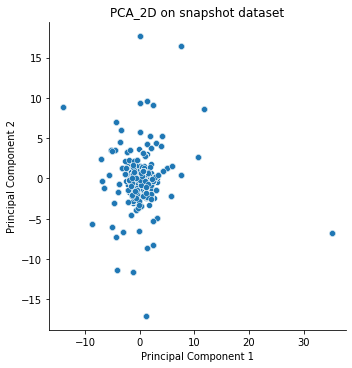

In [30]:
import seaborn as sns

sns.relplot(pca_embedding[:, 0], pca_embedding[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA_2D on snapshot dataset')
plt.show()

In [108]:
start = time.perf_counter()
# Generate Isomap embedding
isomap_5 = manifold.Isomap(n_neighbors=30, n_components=2) #default settings
isomap_embedding_5 = pd.DataFrame(isomap_5.fit_transform(standardised_data))

end = time.perf_counter()
print(f"Processed the Isomap algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate Isomap embedding
isomap_15 = manifold.Isomap(n_neighbors=50, n_components=2) #default settings
isomap_embedding_15 = pd.DataFrame(isomap_15.fit_transform(standardised_data))

end = time.perf_counter()
print(f"Processed the Isomap algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate Isomap embedding
isomap_30 = manifold.Isomap(n_neighbors=100, n_components=2) #default settings
isomap_embedding_30 = pd.DataFrame(isomap_30.fit_transform(standardised_data))

end = time.perf_counter()
print(f"Processed the Isomap algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate Isomap embedding
isomap_50 = manifold.Isomap(n_neighbors=250, n_components=2) #default settings
isomap_embedding_50 = pd.DataFrame(isomap_50.fit_transform(standardised_data))

end = time.perf_counter()
print(f"Processed the Isomap algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate Isomap embedding
isomap_100 = manifold.Isomap(n_neighbors=500, n_components=2) #default settings
isomap_embedding_100 = pd.DataFrame(isomap_100.fit_transform(standardised_data))

end = time.perf_counter()
print(f"Processed the Isomap algorithm in {start-end:0.4f} seconds")


Processed the Isomap algorithm in -15.2974 seconds
Processed the Isomap algorithm in -14.1702 seconds
Processed the Isomap algorithm in -15.2264 seconds
Processed the Isomap algorithm in -17.5722 seconds
Processed the Isomap algorithm in -21.6421 seconds


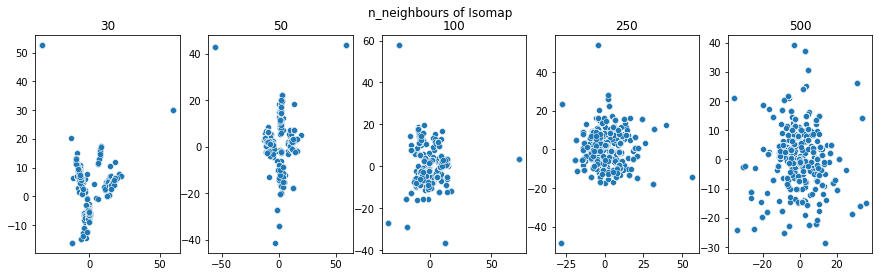

In [106]:
import seaborn as sns

fig, axes = plt.subplots(1, 5, figsize=(15, 4))
fig.suptitle('n_neighbours of Isomap')

# Isomap neighbour = 5
g1 = sns.scatterplot(ax=axes[0], x=isomap_embedding_5[:, 0], y=isomap_embedding_5[:, 1])
axes[0].set_title('30')

# Isomap neighbour = 15
g2 = sns.scatterplot(ax=axes[1], x=isomap_embedding_15[:, 0], y=isomap_embedding_15[:, 1])
axes[1].set_title('50')

# Isomap neighbour = 30
g3 = sns.scatterplot(ax=axes[2], x=isomap_embedding_30[:, 0], y=isomap_embedding_30[:, 1])
axes[2].set_title('100')

# Isomap neighbour = 50
g4 = sns.scatterplot(ax=axes[3], x=isomap_embedding_50[:, 0], y=isomap_embedding_50[:, 1])
axes[3].set_title('250')

# Isomap neighbour = 100
g5 = sns.scatterplot(ax=axes[4], x=isomap_embedding_100[:, 0], y=isomap_embedding_100[:, 1])
axes[4].set_title('500')

plt.show()

In [ ]:
start = time.perf_counter()
# Generate Isomap embedding
isomap_30 = manifold.Isomap(n_neighbors=250, n_components=2) #default settings
isomap_embedding_30 = pd.DataFrame(isomap_30.fit_transform(standardised_data))

end = time.perf_counter()
print(f"Processed the Isomap algorithm in {start-end:0.4f} seconds")

print(isomap_embedding_30)

In [109]:
isomap_embedding_5.columns = ["Isomap1_2d", "Isomap2_2d"]
isomap_embedding_15.columns = ["Isomap1_2d", "Isomap2_2d"]
isomap_embedding_30.columns = ["Isomap1_2d", "Isomap2_2d"]
isomap_embedding_50.columns = ["Isomap1_2d", "Isomap2_2d"]
isomap_embedding_100.columns = ["Isomap1_2d", "Isomap2_2d"]

In [110]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = isomap_embedding_5["Isomap1_2d"],
                    y = isomap_embedding_5["Isomap2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = isomap_embedding_5.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [111]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = isomap_embedding_15["Isomap1_2d"],
                    y = isomap_embedding_15["Isomap2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = isomap_embedding_15.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [112]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = isomap_embedding_30["Isomap1_2d"],
                    y = isomap_embedding_30["Isomap2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = isomap_embedding_30.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [113]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = isomap_embedding_50["Isomap1_2d"],
                    y = isomap_embedding_50["Isomap2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = isomap_embedding_50.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [114]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = isomap_embedding_100["Isomap1_2d"],
                    y = isomap_embedding_100["Isomap2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = isomap_embedding_100.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [33]:
Big_data_set = Big_data_set.iloc[[2038,2065,1535,648,67,465]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i],G6385-MONOMER[c]
2038,0,0,0,0,0,0,0,0,0,0,...,1,2,11,2,0,15,0,38,0,22
2065,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,65,0,287,1,19
1535,0,0,0,0,0,0,0,0,0,0,...,1,2,1,1,0,23,0,50,1,18
648,0,0,0,0,0,0,0,0,0,0,...,0,1,9,0,1,28,1,326,0,24
67,0,0,0,0,0,0,0,0,0,8,...,1,0,11,1,0,37,0,291,0,69
465,0,0,0,0,0,0,0,0,0,0,...,1,1,11,1,1,64,1,45,0,93


In [34]:
Big_data_set = Big_data_set.loc[:, (Big_data_set > 100).any()]
Big_data_set

,CARBOXYL-TRANSFERASE-ALPHA-MONOMER[c],B2771-MONOMER[i],EG11815-MONOMER[p],EG11906-MONOMER[c],EG10716-MONOMER[c],YPHD-MONOMER[i],G6109-MONOMER[c],SECF[i],GLYS-MONOMER[c],MONOMER0-152[c],...,CYDC-MONOMER[i],DEHYDDEOXGALACTKIN-MONOMER[c],MONOMER0-2819[c],ALPHA-AMYL-PERI-MONOMER[p],G7868-MONOMER[c],YHIP-MONOMER[i],KDGT-MONOMER[i],G6498-MONOMER[c],GLUTAMIDOTRANS-MONOMER[c],G6112-MONOMER[c]
2038,1,3,0,1,1,2,0,0,243,103,...,122,22,60,25,198,61,19,20,336,38
2065,1,1,111,1,5,0,1,0,1,0,...,37,160,37,23,51,42,16,19,511,287
1535,0,2,0,4,5,0,104,0,1,1,...,26,23,20,19,35,16,13,23,18,50
648,1,170,0,0,123,0,0,0,0,1,...,45,53,27,115,34,124,17,231,37,326
67,2,71,0,345,1,0,0,114,1,2,...,0,51,80,21,368,16,123,35,0,291
465,370,0,0,3,1,111,1,0,3,4,...,81,28,159,27,112,20,26,80,98,45


In [35]:
mean2 = Big_data_set.mean(axis=0)
mean2.sort_values(ascending=True).astype('int')

G6109-MONOMER[c]                     17
OPPC-MONOMER[i]                      18
EG11815-MONOMER[p]                   18
MONOMER0-152[c]                      18
YPHD-MONOMER[i]                      18
                                   ... 
FLIG-FLAGELLAR-SWITCH-PROTEIN[i]    382
EG10871-MONOMER[c]                  411
RRLA-RRNA[c]                        498
EG10909-MONOMER[c]                  715
EG10467-MONOMER[c]                  753
Length: 287, dtype: int64

In [36]:
var2 = Big_data_set.var(axis=0)
var2.sort_values(ascending=True).astype('int')

MONOMER0-4247[c]                     1126
G6244-MONOMER[c]                     1160
CPLX0-7720[i]                        1184
G6127-MONOMER[c]                     1262
PHENPRODIOLDEHYDROG-MONOMER[c]       1337
                                   ...   
SMALLILVN-MONOMER[c]               353317
CPLX0-3955[c]                      454829
RRLA-RRNA[c]                       673620
EG10467-MONOMER[c]                1034331
EG10909-MONOMER[c]                1219219
Length: 287, dtype: int64

In [37]:
Newset = Big_data_set.reindex(var2.sort_values(ascending=False).index, axis=1)
Data_set4 = Newset.iloc[:, : 20]
Data_set4

,EG10909-MONOMER[c],EG10467-MONOMER[c],RRLA-RRNA[c],CPLX0-3955[c],SMALLILVN-MONOMER[c],RPOB-MONOMER[c],FLIG-FLAGELLAR-SWITCH-PROTEIN[i],EG10871-MONOMER[c],RRSA-RRNA[c],ASPCARBREG-DIMER[c],MANY-MONOMER[i],G7657-MONOMER[c],LARGEILVB-MONOMER[c],EG10320-MONOMER[c],EG10666-MONOMER[c],PHES-MONOMER[c],PHET-MONOMER[c],charged-trpT-tRNA[c],FEPC-MONOMER[i],EG10125-MONOMER[c]
2038,18,12,1988,1657,440,32,1260,26,1038,64,817,30,3,5,313,1,520,39,50,54
2065,27,35,953,1,5,1120,498,276,62,2,1,4,490,296,701,1,83,634,192,1
1535,113,355,8,0,188,2,100,821,15,2,1,219,0,2,2,1,24,20,47,19
648,14,1934,18,1,72,0,75,214,228,576,9,845,0,3,496,0,506,27,1,613
67,2636,2171,9,24,2,702,358,24,10,2,602,3,726,786,0,657,0,35,1,5
465,1485,16,17,0,1541,3,4,1106,19,925,4,280,0,3,1,70,1,24,624,86


In [44]:
Big_data_set = Big_data_set.iloc[[2011,2065,1535,648,67,465]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i],G6385-MONOMER[c]
2011,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,132,1,38,1,135
2065,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,65,0,287,1,19
1535,0,0,0,0,0,0,0,0,0,0,...,1,2,1,1,0,23,0,50,1,18
648,0,0,0,0,0,0,0,0,0,0,...,0,1,9,0,1,28,1,326,0,24
67,0,0,0,0,0,0,0,0,0,8,...,1,0,11,1,0,37,0,291,0,69
465,0,0,0,0,0,0,0,0,0,0,...,1,1,11,1,1,64,1,45,0,93


In [45]:
Big_data_set = Big_data_set.loc[:, (Big_data_set > 100).any()]
Big_data_set

,CARBOXYL-TRANSFERASE-ALPHA-MONOMER[c],B2771-MONOMER[i],EG11815-MONOMER[p],EG11906-MONOMER[c],EG10716-MONOMER[c],YPHD-MONOMER[i],G6109-MONOMER[c],SECF[i],G6481-MONOMER[p],G7342-MONOMER[p],...,ALPHA-AMYL-PERI-MONOMER[p],G7868-MONOMER[c],YHIP-MONOMER[i],G6953-MONOMER[i],KDGT-MONOMER[i],G6498-MONOMER[c],GLUTAMIDOTRANS-MONOMER[c],ARAH-MONOMER[i],G6112-MONOMER[c],G6385-MONOMER[c]
2011,1,0,0,3,2,2,1,23,341,0,...,78,29,21,109,21,26,219,132,38,135
2065,1,1,111,1,5,0,1,0,9,0,...,23,51,42,12,16,19,511,65,287,19
1535,0,2,0,4,5,0,104,0,3,34,...,19,35,16,29,13,23,18,23,50,18
648,1,170,0,0,123,0,0,0,6,4,...,115,34,124,34,17,231,37,28,326,24
67,2,71,0,345,1,0,0,114,2,2,...,21,368,16,38,123,35,0,37,291,69
465,370,0,0,3,1,111,1,0,5,115,...,27,112,20,32,26,80,98,64,45,93


In [46]:
mean2 = Big_data_set.mean(axis=0)
mean2.sort_values(ascending=True).astype('int')

G6109-MONOMER[c]          17
EG11815-MONOMER[p]        18
YPHD-MONOMER[i]           18
EG12374-MONOMER[c]        21
PROPKIN-MONOMER[c]        21
                        ... 
SMALLILVN-MONOMER[c]     536
CPLX0-3955[c]            611
RPOB-MONOMER[c]          670
EG10909-MONOMER[c]      1145
EG10467-MONOMER[c]      1431
Length: 280, dtype: int64

In [47]:
var2 = Big_data_set.var(axis=0)
var2.sort_values(ascending=True).astype('int')

G6585-MONOMER[c]            944
G6244-MONOMER[c]           1134
MONOMER0-4247[c]           1139
CPLX0-7720[i]              1143
G6953-MONOMER[i]           1147
                         ...   
SMALLILVN-MONOMER[c]     536533
RPOB-MONOMER[c]          775663
EG10909-MONOMER[c]      1607058
CPLX0-3955[c]           2206899
EG10467-MONOMER[c]      2585324
Length: 280, dtype: int64

In [48]:
Newset = Big_data_set.reindex(var2.sort_values(ascending=False).index, axis=1)
Data_set4 = Newset.iloc[:, : 20]
Data_set4

,EG10467-MONOMER[c],CPLX0-3955[c],EG10909-MONOMER[c],RPOB-MONOMER[c],SMALLILVN-MONOMER[c],MANY-MONOMER[i],RRLA-RRNA[c],ASPCARBREG-DIMER[c],EG10871-MONOMER[c],PHES-MONOMER[c],LARGEILVB-MONOMER[c],G7657-MONOMER[c],EG10320-MONOMER[c],EG10666-MONOMER[c],EG11171-MONOMER[c],charged-trpT-tRNA[c],FEPC-MONOMER[i],EG10125-MONOMER[c],FLIG-FLAGELLAR-SWITCH-PROTEIN[i],PHET-MONOMER[c]
2011,4080,3644,2595,2198,1413,1273,1049,1116,22,639,1,48,0,1,683,37,1,155,40,2
2065,35,1,27,1120,5,1,953,2,276,1,490,4,296,701,158,634,192,1,498,83
1535,355,0,113,2,188,1,8,2,821,1,0,219,2,2,7,20,47,19,100,24
648,1934,1,14,0,72,9,18,576,214,0,0,845,3,496,0,27,1,613,75,506
67,2171,24,2636,702,2,602,9,2,24,657,726,3,786,0,0,35,1,5,358,0
465,16,0,1485,3,1541,4,17,925,1106,70,0,280,3,1,325,24,624,86,4,1


In [51]:
Big_data_set = Big_data_set.iloc[[2005,2065,1535,648,67,465]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i],G6385-MONOMER[c]
2005,0,0,0,0,0,0,0,0,0,0,...,0,3,9,0,1,177,1,46,1,33
2065,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,65,0,287,1,19
1535,0,0,0,0,0,0,0,0,0,0,...,1,2,1,1,0,23,0,50,1,18
648,0,0,0,0,0,0,0,0,0,0,...,0,1,9,0,1,28,1,326,0,24
67,0,0,0,0,0,0,0,0,0,8,...,1,0,11,1,0,37,0,291,0,69
465,0,0,0,0,0,0,0,0,0,0,...,1,1,11,1,1,64,1,45,0,93


In [52]:
Big_data_set = Big_data_set.loc[:, (Big_data_set > 100).any()]
Big_data_set

,CARBOXYL-TRANSFERASE-ALPHA-MONOMER[c],B2771-MONOMER[i],EG11815-MONOMER[p],YTFT-MONOMER[i],EG11906-MONOMER[c],EG10716-MONOMER[c],YPHD-MONOMER[i],G6109-MONOMER[c],PROW-MONOMER[i],SECF[i],...,MONOMER0-2819[c],ALPHA-AMYL-PERI-MONOMER[p],G7868-MONOMER[c],YHIP-MONOMER[i],KDGT-MONOMER[i],G6498-MONOMER[c],GLUTAMIDOTRANS-MONOMER[c],XYLG-MONOMER[m],ARAH-MONOMER[i],G6112-MONOMER[c]
2005,3,0,0,104,5,3,133,1,108,0,...,35,30,103,21,61,24,41,133,177,46
2065,1,1,111,0,1,5,0,1,0,0,...,37,23,51,42,16,19,511,25,65,287
1535,0,2,0,1,4,5,0,104,1,0,...,20,19,35,16,13,23,18,16,23,50
648,1,170,0,0,0,123,0,0,1,0,...,27,115,34,124,17,231,37,13,28,326
67,2,71,0,0,345,1,0,0,0,114,...,80,21,368,16,123,35,0,25,37,291
465,370,0,0,0,3,1,111,1,0,0,...,159,27,112,20,26,80,98,11,64,45


In [53]:
mean2 = Big_data_set.mean(axis=0)
mean2.sort_values(ascending=True).astype('int')

YTFT-MONOMER[i]        17
G6109-MONOMER[c]       17
YDCT-MONOMER[i]        18
PROW-MONOMER[i]        18
OPPC-MONOMER[i]        18
                     ... 
RRLA-RRNA[c]          372
CPLX0-3955[c]         403
EG10871-MONOMER[c]    410
EG10909-MONOMER[c]    724
EG10467-MONOMER[c]    946
Length: 284, dtype: int64

In [54]:
var2 = Big_data_set.var(axis=0)
var2.sort_values(ascending=True).astype('int')

CPLX0-7720[i]               890
G6585-MONOMER[c]           1082
MONOMER0-4225[c]           1128
G6244-MONOMER[c]           1154
EG12007-MONOMER[i]         1198
                         ...   
RRSA-RRNA[c]             348229
SMALLILVN-MONOMER[c]     367960
EG10467-MONOMER[c]       914208
CPLX0-3955[c]            951149
EG10909-MONOMER[c]      1205424
Length: 284, dtype: int64

In [55]:
Newset = Big_data_set.reindex(var2.sort_values(ascending=False).index, axis=1)
Data_set4 = Newset.iloc[:, : 20]
Data_set4

,EG10909-MONOMER[c],CPLX0-3955[c],EG10467-MONOMER[c],SMALLILVN-MONOMER[c],RRSA-RRNA[c],RRLA-RRNA[c],MANY-MONOMER[i],RPOB-MONOMER[c],EG10871-MONOMER[c],ASPCARBREG-DIMER[c],G7657-MONOMER[c],LARGEILVB-MONOMER[c],EG10320-MONOMER[c],EG10666-MONOMER[c],EG10125-MONOMER[c],PHES-MONOMER[c],charged-trpT-tRNA[c],FEPC-MONOMER[i],FLIG-FLAGELLAR-SWITCH-PROTEIN[i],RPOC-MONOMER[c]
2005,69,2394,1170,55,1498,1228,1315,6,21,1,762,0,3,3,645,4,37,176,470,511
2065,27,1,35,5,62,953,1,1120,276,2,4,490,296,701,1,1,634,192,498,0
1535,113,0,355,188,15,8,1,2,821,2,219,0,2,2,19,1,20,47,100,304
648,14,1,1934,72,228,18,9,0,214,576,845,0,3,496,613,0,27,1,75,145
67,2636,24,2171,2,10,9,602,702,24,2,3,726,786,0,5,657,35,1,358,4
465,1485,0,16,1541,19,17,4,3,1106,925,280,0,3,1,86,70,24,624,4,394


In [58]:
Big_data_set = Big_data_set.iloc[[2014,2065,1535,648,67,465]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i],G6385-MONOMER[c]
2014,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,82,0,43,0,36
2065,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,65,0,287,1,19
1535,0,0,0,0,0,0,0,0,0,0,...,1,2,1,1,0,23,0,50,1,18
648,0,0,0,0,0,0,0,0,0,0,...,0,1,9,0,1,28,1,326,0,24
67,0,0,0,0,0,0,0,0,0,8,...,1,0,11,1,0,37,0,291,0,69
465,0,0,0,0,0,0,0,0,0,0,...,1,1,11,1,1,64,1,45,0,93


In [59]:
Big_data_set = Big_data_set.loc[:, (Big_data_set > 100).any()]
Big_data_set

,CARBOXYL-TRANSFERASE-ALPHA-MONOMER[c],B2771-MONOMER[i],EG11815-MONOMER[p],TAUC-MONOMER[i],EG11906-MONOMER[c],EG10716-MONOMER[c],YPHD-MONOMER[i],G6109-MONOMER[c],SECF[i],G7342-MONOMER[p],...,MONOMER0-2819[c],G7131-MONOMER[c],ALPHA-AMYL-PERI-MONOMER[p],G7868-MONOMER[c],YHIP-MONOMER[i],KDGT-MONOMER[i],G6498-MONOMER[c],GLUTAMIDOTRANS-MONOMER[c],G6116-MONOMER[c],G6112-MONOMER[c]
2014,0,1,0,123,4,0,1,1,0,0,...,33,105,23,37,68,12,154,0,231,43
2065,1,1,111,0,1,5,0,1,0,0,...,37,31,23,51,42,16,19,511,40,287
1535,0,2,0,1,4,5,0,104,0,34,...,20,29,19,35,16,13,23,18,61,50
648,1,170,0,1,0,123,0,0,0,4,...,27,22,115,34,124,17,231,37,37,326
67,2,71,0,1,345,1,0,0,114,2,...,80,33,21,368,16,123,35,0,33,291
465,370,0,0,26,3,1,111,1,0,115,...,159,48,27,112,20,26,80,98,32,45


In [60]:
mean2 = Big_data_set.mean(axis=0)
mean2.sort_values(ascending=True).astype('int')

G6109-MONOMER[c]        17
EG11815-MONOMER[p]      18
OPPC-MONOMER[i]         18
YPHD-MONOMER[i]         18
SECF[i]                 19
                      ... 
EG10871-MONOMER[c]     409
RPOB-MONOMER[c]        464
EG10909-MONOMER[c]     797
CPLX0-3955[c]         1541
EG10467-MONOMER[c]    1746
Length: 276, dtype: int64

In [61]:
var2 = Big_data_set.var(axis=0)
var2.sort_values(ascending=True).astype('int')

G7131-MONOMER[c]             946
MGTA-MONOMER[i]             1070
CPLX0-7720[i]               1157
G6244-MONOMER[c]            1160
MONOMER0-4247[c]            1160
                          ...   
RPOB-MONOMER[c]           274851
SMALLILVN-MONOMER[c]      365136
EG10909-MONOMER[c]       1122526
EG10467-MONOMER[c]       5174246
CPLX0-3955[c]           14155250
Length: 276, dtype: int64

In [62]:
Newset = Big_data_set.reindex(var2.sort_values(ascending=False).index, axis=1)
Data_set4 = Newset.iloc[:, : 20]
Data_set4

,CPLX0-3955[c],EG10467-MONOMER[c],EG10909-MONOMER[c],SMALLILVN-MONOMER[c],RPOB-MONOMER[c],EG10871-MONOMER[c],MANY-MONOMER[i],ASPCARBREG-DIMER[c],RRLA-RRNA[c],LARGEILVB-MONOMER[c],EG10320-MONOMER[c],EG10666-MONOMER[c],G7657-MONOMER[c],FLIG-FLAGELLAR-SWITCH-PROTEIN[i],PHES-MONOMER[c],charged-trpT-tRNA[c],FEPC-MONOMER[i],EG10125-MONOMER[c],PHET-MONOMER[c],GLUTAMIDOTRANS-MONOMER[c]
2014,9221,5965,508,84,960,17,954,56,13,0,4,0,232,642,106,21,1,195,1,0
2065,1,35,27,5,1120,276,1,2,953,490,296,701,4,498,1,634,192,1,83,511
1535,0,355,113,188,2,821,1,2,8,0,2,2,219,100,1,20,47,19,24,18
648,1,1934,14,72,0,214,9,576,18,0,3,496,845,75,0,27,1,613,506,37
67,24,2171,2636,2,702,24,602,2,9,726,786,0,3,358,657,35,1,5,0,0
465,0,16,1485,1541,3,1106,4,925,17,0,3,1,280,4,70,24,624,86,1,98


In [72]:
Big_data_set = Big_data_set.iloc[[2014,2038,2011,2005,67,465,1535,1650,648,409,415]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i],G6385-MONOMER[c]
2014,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,82,0,43,0,36
2038,0,0,0,0,0,0,0,0,0,0,...,1,2,11,2,0,15,0,38,0,22
2011,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,132,1,38,1,135
2005,0,0,0,0,0,0,0,0,0,0,...,0,3,9,0,1,177,1,46,1,33
67,0,0,0,0,0,0,0,0,0,8,...,1,0,11,1,0,37,0,291,0,69
465,0,0,0,0,0,0,0,0,0,0,...,1,1,11,1,1,64,1,45,0,93
1535,0,0,0,0,0,0,0,0,0,0,...,1,2,1,1,0,23,0,50,1,18
1650,0,0,0,0,0,0,0,0,0,0,...,1,0,11,0,1,61,0,44,1,18
648,0,0,0,0,0,0,0,0,0,0,...,0,1,9,0,1,28,1,326,0,24
409,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,2,13,0,162,1,28


In [73]:
Big_data_set = Big_data_set.loc[:, (Big_data_set > 100).any()]
Big_data_set

,CARBOXYL-TRANSFERASE-ALPHA-MONOMER[c],B2771-MONOMER[i],TAUC-MONOMER[i],YTFT-MONOMER[i],EG11906-MONOMER[c],EG10716-MONOMER[c],YPHD-MONOMER[i],YCJN-MONOMER[p],G6109-MONOMER[c],PROW-MONOMER[i],...,G6953-MONOMER[i],KDGT-MONOMER[i],G6498-MONOMER[c],GLUTAMIDOTRANS-MONOMER[c],XYLG-MONOMER[m],G7538-MONOMER[m],G6116-MONOMER[c],ARAH-MONOMER[i],G6112-MONOMER[c],G6385-MONOMER[c]
2014,0,1,123,0,4,0,1,0,1,0,...,34,12,154,0,17,30,231,82,43,36
2038,1,3,0,0,1,1,2,4,0,0,...,25,19,20,336,44,31,37,15,38,22
2011,1,0,1,0,3,2,2,3,1,0,...,109,21,26,219,20,19,94,132,38,135
2005,3,0,0,104,5,3,133,2,1,108,...,42,61,24,41,133,30,57,177,46,33
67,2,71,1,0,345,1,0,3,0,0,...,38,123,35,0,25,21,33,37,291,69
465,370,0,26,0,3,1,111,2,1,0,...,32,26,80,98,11,26,32,64,45,93
1535,0,2,1,1,4,5,0,3,104,1,...,29,13,23,18,16,23,61,23,50,18
1650,2,0,0,0,5,4,0,3,1,1,...,31,19,23,0,57,29,104,61,44,18
648,1,170,1,0,0,123,0,1,0,1,...,34,17,231,37,13,14,37,28,326,24
409,4,2,2,0,0,4,1,1,1,1,...,37,34,43,2,145,366,50,13,162,28


In [74]:
mean2 = Big_data_set.mean(axis=0)
mean2.sort_values(ascending=True).astype('int')

YTFT-MONOMER[i]          9
PROW-MONOMER[i]         10
CCMB-MONOMER[i]         10
MONOMER0-152[c]         10
MGLC-MONOMER[i]         12
                      ... 
RRLA-RRNA[c]           454
MANY-MONOMER[i]        574
EG10909-MONOMER[c]     734
EG10467-MONOMER[c]    1870
CPLX0-3955[c]         2300
Length: 430, dtype: int64

In [75]:
var2 = Big_data_set.var(axis=0)
var2.sort_values(ascending=True).astype('int')

G6953-MONOMER[i]          566
EG10037-MONOMER[c]        662
G7131-MONOMER[c]          690
G6127-MONOMER[c]          696
GKI-MONOMER[c]            698
                       ...   
RRLA-RRNA[c]           469822
RPOB-MONOMER[c]        476366
EG10909-MONOMER[c]    1062176
EG10467-MONOMER[c]    4492529
CPLX0-3955[c]         8692455
Length: 430, dtype: int64

In [76]:
Newset = Big_data_set.reindex(var2.sort_values(ascending=False).index, axis=1)
Data_set4 = Newset.iloc[:, : 20]
Data_set4

,CPLX0-3955[c],EG10467-MONOMER[c],EG10909-MONOMER[c],RPOB-MONOMER[c],RRLA-RRNA[c],SMALLILVN-MONOMER[c],RRSA-RRNA[c],MANY-MONOMER[i],ASPCARBREG-DIMER[c],EG10871-MONOMER[c],FLIG-FLAGELLAR-SWITCH-PROTEIN[i],G7657-MONOMER[c],EG10435-MONOMER[i],PHES-MONOMER[c],EG10320-MONOMER[c],EG10125-MONOMER[c],EG10600-MONOMER[c],LARGEILVB-MONOMER[c],EG11171-MONOMER[c],EG10666-MONOMER[c]
2014,9221,5965,508,960,13,84,13,954,56,17,642,232,0,106,4,195,13,0,0,0
2038,1657,12,18,32,1988,440,1038,817,64,26,1260,30,0,1,5,54,6,3,112,313
2011,3644,4080,2595,2198,1049,1413,18,1273,1116,22,40,48,305,639,0,155,16,1,683,1
2005,2394,1170,69,6,1228,55,1498,1315,1,21,470,762,46,4,3,645,17,0,0,3
67,24,2171,2636,702,9,2,10,602,2,24,358,3,281,657,786,5,159,726,0,0
465,0,16,1485,3,17,1541,19,4,925,1106,4,280,160,70,3,86,6,0,325,1
1535,0,355,113,2,8,188,15,1,2,821,100,219,4,1,2,19,8,0,7,2
1650,1177,85,7,0,10,151,108,126,208,12,216,655,0,16,2,248,12,2,0,131
648,1,1934,14,0,18,72,228,9,576,214,75,845,87,0,3,613,20,0,0,496
409,1237,4602,628,158,19,394,11,852,2,29,172,525,891,0,9,37,764,1,0,3


In [33]:
#UMAP n_neighbours = 15, min_dist = 0, 0.01, 0.05, 0.1, 0.5, 1


#UMAP n_neighbours = 30, min_dist = 0, 0.01, 0.05, 0.1, 0.5, 1

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=30,min_dist=0,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding7 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=30,min_dist=0.01,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding8 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=30,min_dist=0.05,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding9 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=30,min_dist=0.1,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding10 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=30,min_dist=0.5,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding11 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=30,min_dist=1,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding12 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()



#UMAP n_neighbours = 50, min_dist = 0, 0.01, 0.05, 0.1, 0.5, 1

# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=50,min_dist=0,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding13 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=50,min_dist=0.01,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding14 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=50,min_dist=0.05,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding15 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=50,min_dist=0.1,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding16 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=50,min_dist=0.5,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding17 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=50,min_dist=1,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding18 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")


#UMAP n_neighbours = 100, min_dist = 0, 0.01, 0.05, 0.1, 0.5, 1

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=100,min_dist=0,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding19 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=100,min_dist=0.01,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding20 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=100,min_dist=0.05,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding21 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=100,min_dist=0.1,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding22 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=100,min_dist=0.5,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding23 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate UMAP embedding
mapper = umap.UMAP(n_neighbors=100,min_dist=1,n_components=2, metric='euclidean',random_state=0).fit(standardised_data) #default settings
UMAP_embedding24 = mapper.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the UMAP algorithm in {start-end:0.4f} seconds")

Processed the UMAP algorithm in -26.1260 seconds
Processed the UMAP algorithm in -25.6398 seconds
Processed the UMAP algorithm in -25.7710 seconds
Processed the UMAP algorithm in -26.5427 seconds
Processed the UMAP algorithm in -26.3034 seconds
Processed the UMAP algorithm in -26.0942 seconds
Processed the UMAP algorithm in -25.9138 seconds
Processed the UMAP algorithm in -26.0463 seconds
Processed the UMAP algorithm in -26.2999 seconds
Processed the UMAP algorithm in -25.9453 seconds
Processed the UMAP algorithm in -27.0835 seconds
Processed the UMAP algorithm in -27.6573 seconds
Processed the UMAP algorithm in -26.5951 seconds
Processed the UMAP algorithm in -26.5100 seconds
Processed the UMAP algorithm in -27.3036 seconds
Processed the UMAP algorithm in -28.3209 seconds
Processed the UMAP algorithm in -26.5724 seconds
Processed the UMAP algorithm in -26.7636 seconds


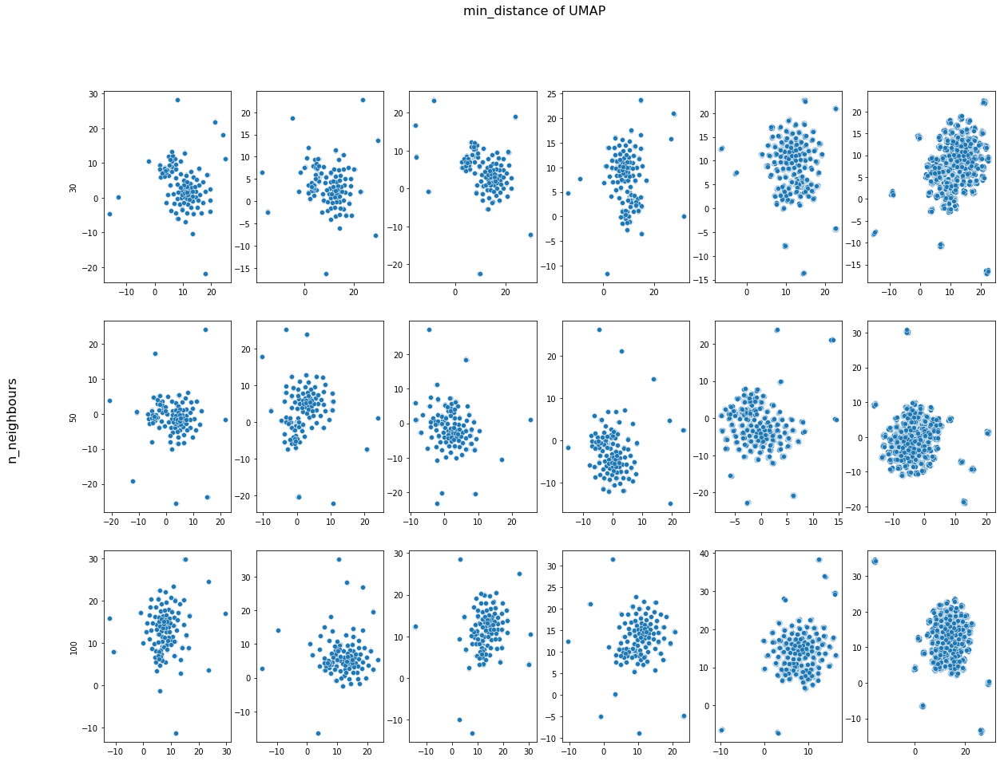

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(3, 6, figsize=(20, 15))
fig.suptitle('min_distance of UMAP', fontsize=16)
fig.text(0.04, 0.5, 'n_neighbours', va='center', rotation='vertical', fontsize = 16)




# UMAP_neighbour = 30 , min dist = 0
g7 = sns.scatterplot(ax=axes[0,0], x=UMAP_embedding7[:, 0], y=UMAP_embedding7[:, 1])
g7.set(ylabel = '30')

# UMAP_neighbour = 30 , min dist = 0.01
g8 = sns.scatterplot(ax=axes[0,1], x=UMAP_embedding8[:, 0], y=UMAP_embedding8[:, 1])


# UMAP_neighbour = 30 , min dist = 0.05
g9 = sns.scatterplot(ax=axes[0,2], x=UMAP_embedding9[:, 0], y=UMAP_embedding9[:, 1])



# UMAP_neighbour = 30 , min dist = 0.1
g10 = sns.scatterplot(ax=axes[0,3], x=UMAP_embedding10[:, 0], y=UMAP_embedding10[:, 1])



# UMAP_neighbour = 30 , min dist = 0.5
g11 = sns.scatterplot(ax=axes[0,4], x=UMAP_embedding11[:, 0], y=UMAP_embedding11[:, 1])


# UMAP_neighbour = 30 , min dist = 1
g12 = sns.scatterplot(ax=axes[0,5], x=UMAP_embedding12[:, 0], y=UMAP_embedding12[:, 1])





# UMAP_neighbour = 50 , min dist = 0
g13 = sns.scatterplot(ax=axes[1,0], x=UMAP_embedding13[:, 0], y=UMAP_embedding13[:, 1])
g13.set(ylabel = '50')

# UMAP_neighbour = 50 , min dist = 0.01
g14 = sns.scatterplot(ax=axes[1,1], x=UMAP_embedding14[:, 0], y=UMAP_embedding14[:, 1])


# UMAP_neighbour = 50 , min dist = 0.05
g15 = sns.scatterplot(ax=axes[1,2], x=UMAP_embedding15[:, 0], y=UMAP_embedding15[:, 1])

# UMAP_neighbour = 50 , min dist = 0.1
g16 = sns.scatterplot(ax=axes[1,3], x=UMAP_embedding16[:, 0], y=UMAP_embedding16[:, 1])

# UMAP_neighbour = 50 , min dist = 0.5
g17 = sns.scatterplot(ax=axes[1,4], x=UMAP_embedding17[:, 0], y=UMAP_embedding17[:, 1])

# UMAP_neighbour = 50 , min dist = 1
g18 = sns.scatterplot(ax=axes[1,5], x=UMAP_embedding18[:, 0], y=UMAP_embedding18[:, 1])


# UMAP_neighbour = 100 , min dist = 0
g19 = sns.scatterplot(ax=axes[2,0], x=UMAP_embedding19[:, 0], y=UMAP_embedding19[:, 1])
g19.set(ylabel = '100')

# UMAP_neighbour = 100 , min dist = 0.01
g20 = sns.scatterplot(ax=axes[2,1], x=UMAP_embedding20[:, 0], y=UMAP_embedding20[:, 1])

# UMAP_neighbour = 100 , min dist = 0.05
g21 = sns.scatterplot(ax=axes[2,2], x=UMAP_embedding21[:, 0], y=UMAP_embedding21[:, 1])

# UMAP_neighbour = 100 , min dist = 0.1
g22 = sns.scatterplot(ax=axes[2,3], x=UMAP_embedding22[:, 0], y=UMAP_embedding22[:, 1])

# UMAP_neighbour = 100 , min dist = 0.5
g23 = sns.scatterplot(ax=axes[2,4], x=UMAP_embedding23[:, 0], y=UMAP_embedding23[:, 1])

# UMAP_neighbour = 100 , min dist = 1
g24 = sns.scatterplot(ax=axes[2,5], x=UMAP_embedding24[:, 0], y=UMAP_embedding24[:, 1])

plt.show()


In [119]:
UMAP_embedding11.columns = ["tsne1_2d", "tsne2_2d"]

In [120]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = UMAP_embedding11["tsne1_2d"],
                    y = UMAP_embedding11["tsne2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = UMAP_embedding11.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [127]:
Big_data_set = Big_data_set.iloc[[652,1652,1252,1748,2048,1948,548,159,453,1193,492,1918,2037]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,G6116-MONOMER[c],EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i]
652,0,0,0,0,0,0,0,0,0,0,...,112,1,1,11,0,0,129,0,60,1
1652,0,0,0,0,0,0,0,0,0,0,...,112,1,1,11,0,0,129,0,60,1
1252,0,0,0,0,0,0,0,0,0,0,...,112,1,1,11,0,0,129,0,60,1
1748,0,0,0,0,0,0,0,0,0,0,...,37,0,1,12,0,1,27,1,502,0
2048,0,0,0,0,0,0,0,0,0,0,...,37,0,1,12,0,1,27,1,502,0
1948,0,0,0,0,0,0,0,0,0,0,...,37,0,1,12,0,1,27,1,502,0
548,0,0,0,0,0,0,0,0,0,0,...,37,0,1,12,0,1,27,1,502,0
159,0,0,0,0,0,0,0,0,0,0,...,37,0,1,12,0,1,27,1,502,0
453,0,0,0,0,0,0,0,0,0,0,...,32,0,1,0,1,0,28,0,45,1
1193,0,0,0,0,0,0,0,0,0,0,...,103,1,3,0,2,0,47,0,52,1


In [ ]:
start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding1 = TSNE(n_components=2, perplexity=5.0, n_iter=1000, verbose=1, 
                       random_state=0).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding2 = TSNE(n_components=2, perplexity=30.0, n_iter=1000, verbose=1,
                      random_state=0).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding3 = TSNE(n_components=2, perplexity=100.0, n_iter=1000, verbose=1,
                      random_state=0).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding4 = TSNE(n_components=2, perplexity=500.0, n_iter=1000, verbose=1,
                      random_state=0).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding5 = TSNE(n_components=2, perplexity=1000.0, n_iter=1000, verbose=1,
                      random_state=0).fit_transform(standardised_data)
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

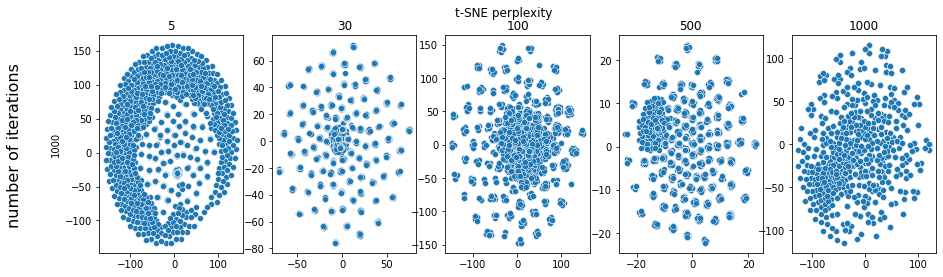

In [38]:
import seaborn as sns

fig, axes = plt.subplots(1, 5, figsize=(15, 4))
fig.suptitle('t-SNE perplexity')
fig.text(0.04, 0.5, 'number of iterations', va='center', rotation='vertical', fontsize = 16)

# t-SNE perplexity = 5
g1 = sns.scatterplot(ax=axes[0], x=tsne_embedding1[:, 0], y=tsne_embedding1[:, 1])
axes[0].set_title('5')
g1.set(ylabel = '1000')


# t-SNE perplexity = 15
g2 = sns.scatterplot(ax=axes[1], x=tsne_embedding2[:, 0], y=tsne_embedding2[:, 1])
axes[1].set_title('30')

# t-SNE perplexity = 30
g3 = sns.scatterplot(ax=axes[2], x=tsne_embedding3[:, 0], y=tsne_embedding3[:, 1])
axes[2].set_title('100')

# t-SNE perplexity = 50
g4 = sns.scatterplot(ax=axes[3], x=tsne_embedding4[:, 0], y=tsne_embedding4[:, 1])
axes[3].set_title('500')

# t-SNE perplexity = 100
g5 = sns.scatterplot(ax=axes[4], x=tsne_embedding5[:, 0], y=tsne_embedding5[:, 1])
axes[4].set_title('1000')

plt.show()

In [112]:
start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding1 = pd.DataFrame(TSNE(n_components=2, perplexity=5.0, n_iter=1000, verbose=1, 
                                    random_state=0).fit_transform(standardised_data))
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding2 = pd.DataFrame(TSNE(n_components=2, perplexity=30.0, n_iter=1000, verbose=1,
                                   random_state=0).fit_transform(standardised_data))
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding3 = pd.DataFrame(TSNE(n_components=2, perplexity=100.0, n_iter=1000, verbose=1,
                      random_state=0).fit_transform(standardised_data))
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding4 = pd.DataFrame(TSNE(n_components=2, perplexity=500.0, n_iter=1000, verbose=1,
                      random_state=0).fit_transform(standardised_data))
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

start = time.perf_counter()
# Generate t-sne embedding
tsne_embedding5 = pd.DataFrame(TSNE(n_components=2, perplexity=1000.0, n_iter=1000, verbose=1,
                      random_state=0).fit_transform(standardised_data))
end = time.perf_counter()
print(f"Processed the t-SNE algorithm in {start-end:0.4f} seconds")

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.002s...
[t-SNE] Computed neighbors for 2070 samples in 0.496s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.779747
[t-SNE] KL divergence after 1000 iterations: 0.306662
Processed the t-SNE algorithm in -122.0708 seconds
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.007s...


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computed neighbors for 2070 samples in 0.400s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 25.619016
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.393173
[t-SNE] KL divergence after 1000 iterations: 0.231684
Processed the t-SNE algorithm in -134.3952 seconds
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.007s...


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computed neighbors for 2070 samples in 0.386s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 27.427186
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.464752
[t-SNE] KL divergence after 1000 iterations: -0.212142
Processed the t-SNE algorithm in -132.1592 seconds
[t-SNE] Computing 1501 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.002s...


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computed neighbors for 2070 samples in 0.645s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 26.552744
[t-SNE] KL divergence after 250 iterations with early exaggeration: 46.680229
[t-SNE] KL divergence after 1000 iterations: 0.356943
Processed the t-SNE algorithm in -155.0791 seconds
[t-SNE] Computing 2069 nearest neighbors...
[t-SNE] Indexed 2070 samples in 0.002s...


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computed neighbors for 2070 samples in 0.645s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2070
[t-SNE] Computed conditional probabilities for sample 2000 / 2070
[t-SNE] Computed conditional probabilities for sample 2070 / 2070
[t-SNE] Mean sigma: 28.364415
[t-SNE] KL divergence after 250 iterations with early exaggeration: 38.239189
[t-SNE] KL divergence after 1000 iterations: -0.034734
Processed the t-SNE algorithm in -151.4803 seconds


In [113]:
tsne_embedding1.columns = ["tsne1_2d", "tsne2_2d"]
tsne_embedding2.columns = ["tsne1_2d", "tsne2_2d"]
tsne_embedding3.columns = ["tsne1_2d", "tsne2_2d"]
tsne_embedding4.columns = ["tsne1_2d", "tsne2_2d"]
tsne_embedding5.columns = ["tsne1_2d", "tsne2_2d"]

In [101]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = tsne_embedding1["tsne1_2d"],
                    y = tsne_embedding1["tsne2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = tsne_embedding1.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [102]:
Big_data_set = Big_data_set.iloc[[1976,1176,576,577,1977,1677,1985,1585,296,2049,360,1949]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,G6116-MONOMER[c],EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i]
1976,0,0,0,0,0,0,0,0,0,0,...,64,0,1,11,0,0,29,1,36,0
1176,0,0,0,0,0,0,0,0,0,0,...,64,0,1,11,0,0,29,1,36,0
576,0,0,0,0,0,0,0,0,0,0,...,64,0,1,11,0,0,29,1,36,0
577,0,0,0,0,0,0,0,0,0,0,...,43,1,1,0,1,0,127,1,37,1
1977,0,0,0,0,0,0,0,0,0,0,...,43,1,1,0,1,0,127,1,37,1
1677,0,0,0,0,0,0,0,0,0,0,...,43,1,1,0,1,0,127,1,37,1
1985,0,0,0,0,0,0,0,0,0,0,...,64,1,0,10,0,1,161,0,61,0
1585,0,0,0,0,0,0,0,0,0,0,...,64,1,0,10,0,1,161,0,61,0
296,0,0,0,0,0,0,0,0,0,0,...,64,1,0,10,0,1,161,0,61,0
2049,0,0,0,0,0,0,0,0,0,0,...,317,0,1,0,1,0,34,0,35,0


In [114]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = tsne_embedding2["tsne1_2d"],
                    y = tsne_embedding2["tsne2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = tsne_embedding2.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [849]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=True).index, axis=1)
Data_set = Newset.iloc[:, :]
Data_set

,LIPIDADISACCHARIDESYNTH-MONOMER[i],G6112-MONOMER[c],EG11692-MONOMER[c],ARAH-MONOMER[i],G6662-MONOMER[c],G7531-MONOMER[c],PHOSPHO-ARCA[c],CPLX0-7958[i],EG11249-MONOMER[c],G6116-MONOMER[c],...,PHOSPHO-PHOB[c],PHOR-CPLX[c],CPLX0-7697[c],G6529-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],YBBP-MONOMER[i],MONOMER0-5[i],FORMATEDEHYDROGN-CPLX[i],E1O[c],FDNG-MONOMER[p]
258,0,30,2,88,0,1,1,1,1,64,...,0,0,0,0,0,0,0,0,0,0
1159,1,35,1,28,1,1,12,2,0,354,...,0,0,0,0,0,0,0,0,0,0
1187,1,57,1,58,1,0,10,3,0,52,...,0,0,0,0,0,0,0,0,0,0
254,0,34,0,24,0,1,0,0,2,39,...,0,0,0,0,0,0,0,0,0,0
1659,1,35,1,28,1,1,12,2,0,354,...,0,0,0,0,0,0,0,0,0,0
960,1,52,0,116,0,1,11,1,1,134,...,0,0,0,0,0,0,0,0,0,0
2046,0,55,1,66,0,0,11,1,0,89,...,0,0,0,17,0,0,0,0,0,0
342,1,39,0,87,0,1,13,0,0,46,...,0,0,0,0,0,0,0,0,0,0
1240,1,38,1,40,0,0,9,0,1,29,...,0,0,0,0,0,0,0,0,15,0
1440,1,36,1,152,1,0,0,0,1,33,...,0,0,0,0,0,0,0,0,0,0


In [850]:
mean2 = Big_data_set.mean(axis=0)
mean2.sort_values(ascending=True).astype('int')

FDNG-MONOMER[p]          0
EG10484-MONOMER[c]       0
EG12096-MONOMER[c]       0
EG10718-MONOMER[c]       0
MONOMER0-6[i]            0
                      ... 
MANY-MONOMER[i]        631
RRSA-RRNA[c]           718
CPLX0-3955[c]          760
EG10909-MONOMER[c]    1477
EG10467-MONOMER[c]    2664
Length: 1752, dtype: int64

In [851]:
Newset = Big_data_set.reindex(mean2.sort_values(ascending=False).index, axis=1)
Data_set7 = Newset.iloc[:, :]
Data_set7

,EG10467-MONOMER[c],EG10909-MONOMER[c],CPLX0-3955[c],RRSA-RRNA[c],MANY-MONOMER[i],EG10666-MONOMER[c],EG10871-MONOMER[c],RRLA-RRNA[c],CARBPSYN-LARGE[c],G7657-MONOMER[c],...,CYDD-MONOMER[i],EG12096-MONOMER[c],B2-CPLX[c],EG10484-MONOMER[c],G6494-MONOMER[c],G7685-MONOMER[i],PD02233[c],YADH-MONOMER[i],DMSA-MONOMER[i],FDNG-MONOMER[p]
258,18,246,1351,17,261,2,24,1130,41,1,...,0,0,0,0,0,0,0,0,0,0
1159,6897,19,0,2077,849,1821,287,14,1473,688,...,0,0,0,0,0,0,0,0,0,0
1187,25,26,940,458,465,1759,20,145,345,42,...,0,0,0,0,0,0,0,0,0,0
254,1138,17,1,18,786,548,2524,20,669,1,...,0,0,0,0,0,0,0,0,0,0
1659,6897,19,0,2077,849,1821,287,14,1473,688,...,0,0,0,0,0,0,0,0,0,0
960,1986,870,3187,19,318,0,15,25,2,747,...,0,0,0,0,0,0,0,0,0,0
2046,2547,3030,1421,1531,530,1,12,2229,1,293,...,0,0,0,0,0,0,0,0,0,0
342,5294,3313,1,968,689,4,2181,882,3,1,...,0,0,0,0,0,0,0,0,0,0
1240,1072,2708,700,7,728,0,7,741,1,788,...,0,0,0,0,0,0,0,0,0,0
1440,770,4526,1,8,840,0,250,14,0,668,...,0,0,0,0,0,0,0,0,0,0


In [857]:
# Create correlation matrix
corr_matrix = Data_set7.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] < 0.40)]

# Drop features 
Data_set7.drop(to_drop, axis=1, inplace=True)

Data_set7

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,EG10467-MONOMER[c],MANY-MONOMER[i]
258,18,261
1159,6897,849
1187,25,465
254,1138,786
1659,6897,849
960,1986,318
2046,2547,530
342,5294,689
1240,1072,728
1440,770,840


In [858]:
Data_set7 = Data_set7.loc[:, (Data_set7 > 1).any()]
Data_set7

,EG10467-MONOMER[c],MANY-MONOMER[i]
258,18,261
1159,6897,849
1187,25,465
254,1138,786
1659,6897,849
960,1986,318
2046,2547,530
342,5294,689
1240,1072,728
1440,770,840


<AxesSubplot:>

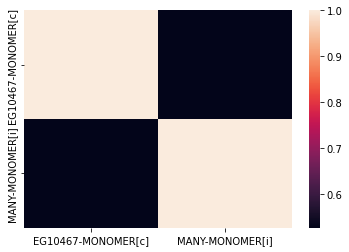

In [859]:
# calculate the correlation matrix
corr = Data_set7.corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [313]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = tsne_embedding2["tsne1_2d"],
                    y = tsne_embedding2["tsne2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = tsne_embedding2.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [830]:
Big_data_set = Big_data_set.iloc[[71,58,68,396,433,407,460,431,467,79]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,G6116-MONOMER[c],EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i]
71,0,0,0,0,0,0,0,0,0,0,...,53,1,0,0,0,0,53,0,38,0
58,0,0,0,0,0,0,0,0,0,0,...,37,0,1,0,0,1,12,0,54,1
68,0,0,0,0,0,1,0,0,0,0,...,106,1,1,1,0,0,63,1,170,0
396,0,0,0,0,0,0,0,0,0,0,...,36,1,0,8,0,1,33,2,37,0
433,0,0,0,0,0,0,0,0,0,0,...,45,0,0,9,0,1,130,1,49,0
407,0,0,0,0,0,4,0,0,0,0,...,32,0,1,0,1,0,182,0,44,1
460,0,0,0,0,0,0,0,0,0,0,...,43,0,0,11,1,1,39,0,128,1
431,0,0,0,0,0,0,0,0,0,0,...,35,0,2,0,1,1,164,0,50,1
467,0,0,0,0,0,0,0,0,0,0,...,32,1,1,0,1,1,23,1,44,0
79,0,0,0,1,0,0,1,0,0,0,...,103,0,1,10,0,1,65,0,36,0


In [831]:
Big_data_set.sum(axis=1)

71     41071
58     38891
68     35069
396    44873
433    43391
407    41892
460    34449
431    41766
467    47755
79     35606
dtype: int64

In [762]:
mean2 = Big_data_set.mean(axis=0)
mean2.sort_values(ascending=True).astype('int')

FDNG-MONOMER[p]          0
MONOMER0-4440[c]         0
EG11952-MONOMER[m]       0
YADH-MONOMER[i]          0
G7685-MONOMER[i]         0
                      ... 
RRSA-RRNA[c]           383
RPOC-MONOMER[c]        661
EG10909-MONOMER[c]    1570
EG10467-MONOMER[c]    1666
CPLX0-3955[c]         1767
Length: 1752, dtype: int64

In [763]:
Newset = Big_data_set.reindex(mean2.sort_values(ascending=False).index, axis=1)
Data_set7 = Newset.iloc[:, :]
Data_set7

,CPLX0-3955[c],EG10467-MONOMER[c],EG10909-MONOMER[c],RPOC-MONOMER[c],RRSA-RRNA[c],G7657-MONOMER[c],FLIG-FLAGELLAR-SWITCH-PROTEIN[i],EG10666-MONOMER[c],EG10871-MONOMER[c],MANY-MONOMER[i],...,CPLX0-2141[i],CITTRANS-CPLX[c],YTFT-MONOMER[i],DMSA-MONOMER[i],EG11815-MONOMER[p],G6138-MONOMER[c],CPLX0-7722[c],EG11071-MONOMER[c],G7875-MONOMER[i],FDNG-MONOMER[p]
71,516,22,3358,179,41,169,312,1,18,722,...,0,0,0,0,0,0,0,0,0,0
58,0,2216,15,1477,28,135,761,1269,415,467,...,0,0,0,0,0,0,0,0,0,0
68,900,393,756,673,1090,0,6,3,26,1,...,0,0,0,0,0,0,0,0,0,0
396,0,7350,1147,400,1214,1,632,1,615,2,...,0,0,0,0,0,0,0,0,0,0
433,7394,27,727,308,26,836,550,1,24,331,...,0,0,0,0,0,0,0,0,0,0
407,0,970,2198,1049,19,881,453,1,804,733,...,0,0,0,0,0,0,0,0,0,0
460,1,1613,10,1,1371,631,15,962,216,3,...,0,0,0,0,0,0,0,0,0,0
431,6432,2279,15,3,6,257,42,508,32,37,...,0,0,0,0,0,0,0,0,0,0
467,2431,1464,5686,1384,19,147,15,1,19,2,...,0,0,0,0,0,0,0,0,0,0
79,0,334,1793,1143,20,419,9,2,539,42,...,0,0,0,0,0,0,0,0,0,0


In [764]:
# Create correlation matrix
corr_matrix = Data_set7.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] < 0.10)]

# Drop features 
Data_set7.drop(to_drop, axis=1, inplace=True)

Data_set7

,CPLX0-3955[c],EG10467-MONOMER[c],EG10909-MONOMER[c],RPOC-MONOMER[c],RRSA-RRNA[c],G7657-MONOMER[c],MONOMER0-4448[c],G7685-MONOMER[i],EMRB-MONOMER[i],YADH-MONOMER[i],...,CPLX0-2141[i],CITTRANS-CPLX[c],YTFT-MONOMER[i],DMSA-MONOMER[i],EG11815-MONOMER[p],G6138-MONOMER[c],CPLX0-7722[c],EG11071-MONOMER[c],G7875-MONOMER[i],FDNG-MONOMER[p]
71,516,22,3358,179,41,169,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
58,0,2216,15,1477,28,135,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
68,900,393,756,673,1090,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
396,0,7350,1147,400,1214,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
433,7394,27,727,308,26,836,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
407,0,970,2198,1049,19,881,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
460,1,1613,10,1,1371,631,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
431,6432,2279,15,3,6,257,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
467,2431,1464,5686,1384,19,147,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
79,0,334,1793,1143,20,419,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [765]:
Data_set7 = Data_set7.loc[:, (Data_set7 > 1).any()]
Data_set7

,CPLX0-3955[c],EG10467-MONOMER[c],EG10909-MONOMER[c],RPOC-MONOMER[c],RRSA-RRNA[c],G7657-MONOMER[c]
71,516,22,3358,179,41,169
58,0,2216,15,1477,28,135
68,900,393,756,673,1090,0
396,0,7350,1147,400,1214,1
433,7394,27,727,308,26,836
407,0,970,2198,1049,19,881
460,1,1613,10,1,1371,631
431,6432,2279,15,3,6,257
467,2431,1464,5686,1384,19,147
79,0,334,1793,1143,20,419


<AxesSubplot:>

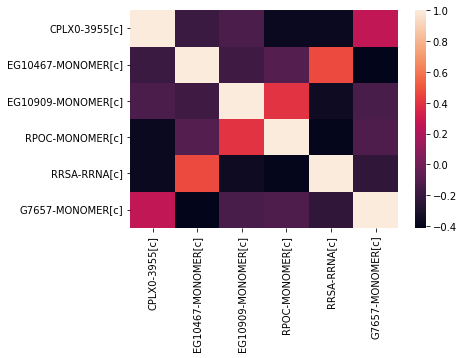

In [766]:
# calculate the correlation matrix
corr = Data_set7.corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [770]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = tsne_embedding3["tsne1_2d"],
                    y = tsne_embedding3["tsne2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = tsne_embedding3.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [837]:
Big_data_set = Big_data_set.iloc[[398,72,80,465,467,63,430,401,1030,386]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,G6116-MONOMER[c],EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i]
398,0,0,0,0,0,0,0,0,1,0,...,59,0,1,0,0,1,28,0,26,0
72,0,0,0,0,0,0,0,0,0,0,...,100,0,2,0,0,0,32,1,69,0
80,0,0,0,0,0,0,0,0,0,0,...,36,1,0,0,0,0,21,0,38,1
465,0,0,0,0,0,0,0,0,0,0,...,32,1,1,11,1,1,64,1,45,0
467,0,0,0,0,0,0,0,0,0,0,...,32,1,1,0,1,1,23,1,44,0
63,0,0,0,0,0,0,0,0,0,0,...,37,0,2,12,1,1,4,1,45,1
430,0,0,0,0,0,0,0,0,0,0,...,36,0,2,13,1,2,132,1,125,0
401,0,0,0,0,0,0,0,0,0,0,...,42,0,1,11,1,1,209,0,40,1
1030,0,0,0,0,0,0,0,0,0,0,...,53,1,0,12,1,1,39,1,29,0
386,0,0,0,0,0,0,0,0,0,0,...,186,0,2,11,0,1,146,0,48,1


In [838]:
Big_data_set.sum(axis=1)

398     45153
72      41620
80      36215
465     37469
467     47755
63      34361
430     45401
401     47024
1030    30159
386     34377
dtype: int64

In [773]:
Newset = Big_data_set.reindex(mean2.sort_values(ascending=False).index, axis=1)
Data_set7 = Newset.iloc[:, :]
Data_set7

,CPLX0-3955[c],EG10467-MONOMER[c],EG10909-MONOMER[c],RPOC-MONOMER[c],RRSA-RRNA[c],G7657-MONOMER[c],FLIG-FLAGELLAR-SWITCH-PROTEIN[i],EG10666-MONOMER[c],EG10871-MONOMER[c],MANY-MONOMER[i],...,CPLX0-2141[i],CITTRANS-CPLX[c],YTFT-MONOMER[i],DMSA-MONOMER[i],EG11815-MONOMER[p],G6138-MONOMER[c],CPLX0-7722[c],EG11071-MONOMER[c],G7875-MONOMER[i],FDNG-MONOMER[p]
398,1665,6330,1248,1344,172,54,2,0,25,693,...,0,0,0,0,0,0,0,0,0,0
72,0,5594,10,251,42,106,14,636,792,1292,...,1,0,0,53,0,0,7,0,0,0
80,1,2695,17,1,1092,187,345,68,973,1,...,0,0,0,3,0,0,0,0,0,0
465,0,16,1485,394,19,280,4,1,1106,4,...,0,0,0,0,0,0,0,0,0,0
467,2431,1464,5686,1384,19,147,15,1,19,2,...,0,0,0,0,0,0,0,0,0,0
63,3961,442,25,846,692,141,26,646,14,342,...,0,0,0,0,0,0,0,0,0,0
430,3786,6125,1177,0,920,0,692,1,11,3,...,0,0,0,1,0,0,0,0,0,0
401,5636,1266,14,297,1270,87,2,1447,27,1192,...,0,0,118,0,1,0,0,0,0,0
1030,0,24,755,903,12,1224,311,1,839,360,...,0,0,0,7,0,0,0,0,0,0
386,2394,947,17,628,837,5,402,1091,11,734,...,0,0,0,0,0,0,0,0,0,0


In [774]:
# Create correlation matrix
corr_matrix = Data_set7.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] < 0.10)]

# Drop features 
Data_set7.drop(to_drop, axis=1, inplace=True)

Data_set7

,CPLX0-3955[c],EG10666-MONOMER[c],EG11656-MONOMER[c],G7544-MONOMER[m],CYDD-MONOMER[i],G7500-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],NIKC-MONOMER[i],EG12260-MONOMER[i],FHLMULTI-CPLX[i],...,E1O[c],YNJC-MONOMER[m],SECF[i],G6988-MONOMER[c],MONOMER0-4446[c],CITTRANS-CPLX[c],G6138-MONOMER[c],EG11071-MONOMER[c],G7875-MONOMER[i],FDNG-MONOMER[p]
398,1665,0,8,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
72,0,636,11,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
80,1,68,183,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
465,0,1,25,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
467,2431,1,4,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
63,3961,646,55,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
430,3786,1,4,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
401,5636,1447,1196,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1030,0,1,13,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
386,2394,1091,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [775]:
Data_set7 = Data_set7.loc[:, (Data_set7 > 1).any()]
Data_set7

,CPLX0-3955[c],EG10666-MONOMER[c],EG11656-MONOMER[c]
398,1665,0,8
72,0,636,11
80,1,68,183
465,0,1,25
467,2431,1,4
63,3961,646,55
430,3786,1,4
401,5636,1447,1196
1030,0,1,13
386,2394,1091,1


<AxesSubplot:>

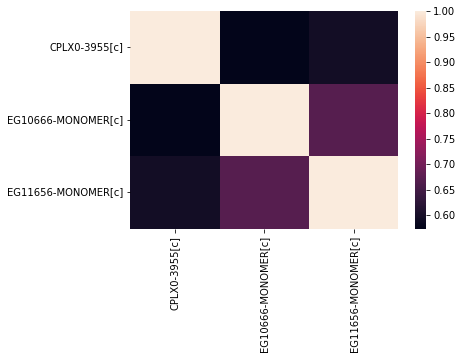

In [777]:
# calculate the correlation matrix
corr = Data_set7.corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [771]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = tsne_embedding4["tsne1_2d"],
                    y = tsne_embedding4["tsne2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = tsne_embedding4.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [814]:
Big_data_set = Big_data_set.iloc[[468,396,422,55,420,407,453,441,449,400]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,G6116-MONOMER[c],EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i]
468,0,0,0,0,0,0,0,0,0,0,...,33,1,2,11,0,1,70,0,43,0
396,0,0,0,0,0,0,0,0,0,0,...,36,1,0,8,0,1,33,2,37,0
422,0,0,0,0,0,0,0,0,0,0,...,57,0,3,8,1,0,37,1,161,1
55,0,0,0,0,0,0,0,0,0,0,...,49,0,0,13,1,1,34,1,52,1
420,0,0,0,0,0,0,0,0,0,0,...,72,0,1,0,0,0,67,1,118,0
407,0,0,0,0,0,4,0,0,0,0,...,32,0,1,0,1,0,182,0,44,1
453,0,0,0,0,0,0,0,0,0,0,...,32,0,1,0,1,0,28,0,45,1
441,0,0,0,0,0,0,0,0,0,0,...,37,1,0,8,1,1,11,1,35,0
449,0,0,0,0,0,0,0,0,0,0,...,37,1,1,0,0,1,93,0,272,1
400,0,0,0,0,0,0,0,0,0,0,...,56,1,0,13,1,0,32,0,66,0


In [815]:
Big_data_set.sum(axis=1)

468    45691
396    44873
422    42513
55     51574
420    40408
407    41892
453    46455
441    38787
449    35283
400    40221
dtype: int64

In [816]:
Newset = Big_data_set.reindex(mean2.sort_values(ascending=False).index, axis=1)
Data_set7 = Newset.iloc[:, :]
Data_set7

,CPLX0-3955[c],EG10467-MONOMER[c],EG10909-MONOMER[c],RPOC-MONOMER[c],RRSA-RRNA[c],G7657-MONOMER[c],FLIG-FLAGELLAR-SWITCH-PROTEIN[i],EG10666-MONOMER[c],EG10871-MONOMER[c],MANY-MONOMER[i],...,CPLX0-2141[i],CITTRANS-CPLX[c],YTFT-MONOMER[i],DMSA-MONOMER[i],EG11815-MONOMER[p],G6138-MONOMER[c],CPLX0-7722[c],EG11071-MONOMER[c],G7875-MONOMER[i],FDNG-MONOMER[p]
468,3497,5420,1583,1,12,609,475,1,12,491,...,0,0,0,0,0,1,0,0,0,0
396,0,7350,1147,400,1214,1,632,1,615,2,...,0,0,0,0,0,0,0,0,0,0
422,6253,26,12,1,153,731,108,1441,4,544,...,0,0,0,0,0,0,0,0,0,0
55,788,1741,2271,4,2512,206,9,0,17,325,...,0,0,1,0,0,1,0,0,0,0
420,3453,2125,20,2,16,1279,2,281,19,0,...,0,0,0,10,0,0,0,0,0,0
407,0,970,2198,1049,19,881,453,1,804,733,...,0,0,0,0,0,0,0,0,0,0
453,3551,6714,789,428,1040,0,102,1,26,3,...,0,0,0,0,0,0,0,0,0,0
441,5870,2569,12,1040,119,25,105,659,26,258,...,0,0,0,10,0,0,0,0,0,0
449,1673,14,1358,1,18,12,18,1,19,87,...,0,0,0,103,1,0,4,0,4,0
400,1,31,1746,1,271,95,286,2,236,149,...,0,0,0,0,0,0,0,0,0,0


In [817]:
# Create correlation matrix
corr_matrix = Data_set7.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] < 0.10)]

# Drop features 
Data_set7.drop(to_drop, axis=1, inplace=True)

Data_set7

,CPLX0-3955[c],RRSA-RRNA[c],CELB-MONOMER[i],PD00519[c],B2-CPLX[c],G7212-MONOMER[c],G6848-MONOMER[i],CPLX0-821[c],EG12260-MONOMER[i],G6728-MONOMER[i],...,G7777-MONOMER[c],PABASYN-COMPII-MONOMER[c],G6988-MONOMER[c],THREDEHYDCAT-CPLX[c],MONOMER0-2682[i],MONOMER0-4446[c],CPLX0-2141[i],CITTRANS-CPLX[c],EG11071-MONOMER[c],FDNG-MONOMER[p]
468,3497,12,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
396,0,1214,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
422,6253,153,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
55,788,2512,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
420,3453,16,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
407,0,19,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
453,3551,1040,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
441,5870,119,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
449,1673,18,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
400,1,271,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [818]:
Data_set7 = Data_set7.loc[:, (Data_set7 > 1).any()]
Data_set7

,CPLX0-3955[c],RRSA-RRNA[c]
468,3497,12
396,0,1214
422,6253,153
55,788,2512
420,3453,16
407,0,19
453,3551,1040
441,5870,119
449,1673,18
400,1,271


<AxesSubplot:>

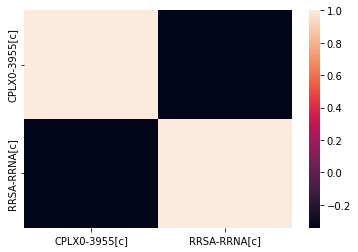

In [819]:
# calculate the correlation matrix
corr = Data_set7.corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [316]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = tsne_embedding5["tsne1_2d"],
                    y = tsne_embedding5["tsne2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = tsne_embedding5.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Isomap"

layout = dict(title = title,
              xaxis= dict(title= 'tsne1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'tsne2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [502]:
Big_data_set = Big_data_set.iloc[[1650,1492,438,467,461,429,442,448,426,1707,394,439,469,64]]
Big_data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,EG11249-MONOMER[c],CPLX0-7958[i],PHOSPHO-ARCA[c],G7531-MONOMER[c],G6662-MONOMER[c],ARAH-MONOMER[i],EG11692-MONOMER[c],G6112-MONOMER[c],LIPIDADISACCHARIDESYNTH-MONOMER[i],G6385-MONOMER[c]
1650,0,0,0,0,0,0,0,0,0,0,...,1,0,11,0,1,61,0,44,1,18
1492,0,0,0,0,0,0,0,0,0,0,...,0,0,12,0,0,24,0,81,0,26
438,0,0,0,0,0,0,0,0,0,0,...,1,1,10,0,1,19,1,33,1,14
467,0,0,0,0,0,0,0,0,0,0,...,1,1,0,1,1,23,1,44,0,21
461,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,211,0,36,0,32
429,0,0,0,0,0,0,0,0,0,0,...,0,0,10,1,1,32,1,252,0,15
442,0,0,0,0,0,0,0,0,0,0,...,0,2,22,3,1,33,0,49,1,28
448,0,0,0,0,0,0,0,0,0,0,...,1,2,11,1,1,39,1,102,1,38
426,0,0,0,0,0,0,0,0,0,0,...,1,1,0,1,2,23,0,30,0,22
1707,0,0,0,0,0,0,0,0,0,0,...,1,1,0,1,1,50,1,45,0,31


In [503]:
mean2 = Big_data_set.mean(axis=0)
mean2.sort_values(ascending=True).astype('int')

FDNG-MONOMER[p]          0
MONOMER0-4448[c]         0
MONOMER0-4440[c]         0
FHUB-MONOMER[i]          0
EG10718-MONOMER[c]       0
                      ... 
G7657-MONOMER[c]       298
RRSA-RRNA[c]           448
EG10909-MONOMER[c]    1074
CPLX0-3955[c]         1546
EG10467-MONOMER[c]    2666
Length: 1753, dtype: int64

In [504]:
Newset = Big_data_set.reindex(mean2.sort_values(ascending=False).index, axis=1)
Data_set7 = Newset.iloc[:, :]
Data_set7

,EG10467-MONOMER[c],CPLX0-3955[c],EG10909-MONOMER[c],RRSA-RRNA[c],G7657-MONOMER[c],ASPCARBREG-DIMER[c],RPOB-MONOMER[c],SMALLILVN-MONOMER[c],EG10871-MONOMER[c],MANY-MONOMER[i],...,EG10718-MONOMER[c],FHUB-MONOMER[i],MONOMER0-4440[c],MONOMER0-4448[c],CPLX0-7613[c],EG12260-MONOMER[i],YLIC-MONOMER[i],MONOMER0-4449[c],CPLX0-7836[c],FDNG-MONOMER[p]
1650,85,1177,7,108,655,208,0,151,12,126,...,0,0,0,0,0,0,0,0,0,0
1492,1409,0,16,748,284,2,3,231,1235,139,...,0,0,0,0,0,0,0,0,0,0
438,6377,205,1387,14,134,1,783,488,9,296,...,0,0,0,0,0,0,0,0,0,0
467,1464,2431,5686,19,147,0,2,47,19,2,...,0,0,0,0,0,0,0,0,0,0
461,2950,0,2374,1582,275,2,909,3,338,2,...,0,0,0,0,0,0,0,0,0,0
429,201,0,22,30,46,2,155,3,1840,1,...,0,0,0,0,0,0,0,0,0,0
442,4352,4982,1251,18,211,1016,491,665,18,642,...,0,0,0,0,0,0,0,0,0,0
448,3552,135,804,1856,704,1254,1111,1700,16,1113,...,0,0,0,0,0,0,0,0,0,0
426,5156,1951,21,1327,641,1,31,112,18,0,...,0,0,0,0,0,0,0,0,0,0
1707,1855,1,126,2,581,2,0,1,86,37,...,0,0,0,0,0,0,0,0,0,0


In [510]:
# Create correlation matrix
corr_matrix = Data_set7.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] < 0.75)]

# Drop features 
Data_set7.drop(to_drop, axis=1, inplace=True)

Data_set7

,EG10467-MONOMER[c],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],FORMATEDEHYDROGN-CPLX[i],G7480-MONOMER[c],MONOMER0-5[i],EMRB-MONOMER[i],YBBP-MONOMER[i],G6529-MONOMER[i],...,EG10718-MONOMER[c],FHUB-MONOMER[i],MONOMER0-4440[c],MONOMER0-4448[c],CPLX0-7613[c],EG12260-MONOMER[i],YLIC-MONOMER[i],MONOMER0-4449[c],CPLX0-7836[c],FDNG-MONOMER[p]
1650,85,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1492,1409,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
438,6377,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
467,1464,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
461,2950,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
429,201,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
442,4352,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
448,3552,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
426,5156,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1707,1855,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [512]:
Big_data_set7 = Data_set7.loc[:, (Data_set7 > 1).any()]
Big_data_set7

,EG10467-MONOMER[c]
1650,85
1492,1409
438,6377
467,1464
461,2950
429,201
442,4352
448,3552
426,5156
1707,1855


In [ ]:
Big_data_set7.corrwith(dfa.iloc[0], axis=1)

In [39]:
start = time.perf_counter()
# Generate ICA embedding

K = 2
ica = FastICA(n_components=K)
ica.fit(standardised_data) 
ica_embedding = ica.transform(standardised_data)

end = time.perf_counter()
print(f"Processed the ICA algorithm in {start-end:0.4f} seconds")


Processed the ICA algorithm in -3.7389 seconds


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


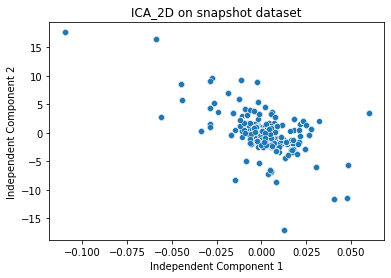

In [40]:
import seaborn as sns

sns.scatterplot(ica_embedding[:, 0], pca_embedding[:, 1])
plt.xlabel('Independent Component 1')
plt.ylabel('Independent Component 2')
plt.title('ICA_2D on snapshot dataset')
plt.show()

In [94]:
start = time.perf_counter()
# Generate Spec embedding
K = 2
spec = SpectralEmbedding(n_components=K)
spec_embedding = spec.fit_transform(standardised_data)

end = time.perf_counter()
print(f"Processed the Spectral algorithm in {start-end:0.4f} seconds")

Processed the Spectral algorithm in -2.3757 seconds


/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



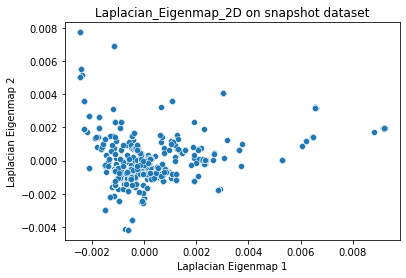

In [95]:
import seaborn as sns

sns.scatterplot(spec_embedding[:, 0], spec_embedding[:, 1])
plt.xlabel('Laplacian Eigenmap 1')
plt.ylabel('Laplacian Eigenmap 2')
plt.title('Laplacian_Eigenmap_2D on snapshot dataset')
plt.show()

In [92]:
spec_embedding.columns = ["Laplace1_2d", "Laplace2_2d"]

In [93]:
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = spec_embedding["Laplace1_2d"],
                    y = spec_embedding["Laplace2_2d"],
                    mode = "markers",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text = spec_embedding.index)

data = [trace1]

title = "Visualizing in Two Dimensions Using Laplacian Eigenmaps"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = data, layout = layout)

iplot(fig)